# Capstone project with Spinnaker

### Purpose
> The objective of the project is to find tradable signals across sectors for helping investor to identify ‘sector-rotation patterns’ in financial markets and develop tradable predictions.

### Dataset
> The dataset contains sectoral data for 3 separate types of investments made in the US.
> *   Institutional Mutual Fund 
*   ETF
*   Retail Mutual Fund
>
> The weekly data spans 10 years from 2006 through end-Jan 2017. Not all sectors have data available for all the dates since new investment vehicles are introduced at various points in time.
<br><br>
Data fields:<br>
**ReportDate**: Weekly data aggregated and released every Wednesday	
**AssetClass**: Industry/Sector/Asset Class	
**Flow**: Amount of positive (inflow) or negative (outflow) in Millions of USD 	
**FlowPct**: Flows as percent of assets at beginning of the week 	
**AssetsEnd**: Assets at end of the week in Millions of USD	
**PortfolioChangePct**: Percent change in overall portfolio during the week



# Outline
* Notebook 1 - Data Cleaning + EDA + VAR Model 1
 1. Data cleaning
 2. Explanatory data analysis
 3. VAR Model 1-1: Within one market - ETF
 4. VAR Model 1-2: Within one market - Institutional MF

* Notebook 2 - VAR Model 2
 6. VAR Model 2-1: Cross-market
 7. VAR Model 2-2: Cross-market, smooth method applied

* Notebook 3 - VAR Model 3
 8. VAR Model 3: Cross-market, smooth method applied and market indices added


# Import dataset

In [ ]:
! pip install -U statsmodels

     |████████████████████████████████| 9.5MB 5.3MB/s 
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
# imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics 

# color maps
from matplotlib import cm

# time series
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.ar_model import AutoReg
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tools.eval_measures import rmse, aic
from scipy.stats import chi2_contingency
from scipy.spatial import distance

# chi-square test
import scipy
from scipy.stats import pearsonr

Import datasets from github:

In [ ]:
# The initial datasets of three markets
url_etf = 'https://raw.githubusercontent.com/huahuang95/Capstone-Project/main/Datasets/US%20Sector%20Inst%20ETF.csv?token=ARFA2GKTHK6DANXU5XYOGILA6R4NG'
etf = pd.read_csv(url_etf)

url_inst = 'https://raw.githubusercontent.com/huahuang95/Capstone-Project/main/Datasets/US%20Sector%20Institutional%20MF.csv?token=ARFA2GI7MBZREZUP4QDWZMTA6R4OW'
inst = pd.read_csv(url_inst)

url_retail = 'https://raw.githubusercontent.com/huahuang95/Capstone-Project/main/Datasets/US%20Sector%20Retail%20MF.csv?token=ARFA2GKTULUDTR3COF7NOI3A6R4Q4'
retail = pd.read_csv(url_retail)

In [ ]:
etf.head(3)

,ReportDate,AssetClass,Flow,FlowPct,AssetsEnd,PortfolioChangePct
0,2/1/2017 12:00:00 AM,Commodities/Materials-North America-USA-North ...,378.578706,4.5064,8679.056347,-1.1938
1,2/1/2017 12:00:00 AM,Consumer Goods-North America-USA-North America...,332.526792,1.1479,28973.613065,-1.1231
2,2/1/2017 12:00:00 AM,Energy-North America-USA-North America-Equity,186.031374,0.3782,48446.700077,-1.8855


In [ ]:
inst.head(3)

,ReportDate,AssetClass,Flow,FlowPct,AssetsEnd,PortfolioChangePct
0,2/1/2017 12:00:00 AM,Commodities/Materials-North America-USA-North ...,380.126769,4.4676,8787.631717,-1.1853
1,2/1/2017 12:00:00 AM,Consumer Goods-North America-USA-North America...,332.526792,1.1479,28973.613065,-1.1231
2,2/1/2017 12:00:00 AM,Energy-North America-USA-North America-Equity,217.857886,0.3460,62136.008339,-1.6441


In [ ]:
retail.head(3)

,ReportDate,AssetClass,Flow,FlowPct,AssetsEnd,PortfolioChangePct
0,2/1/2017 12:00:00 AM,Commodities/Materials-North America-USA-North ...,25.681524,8.0046,344.521230,-0.6207
1,2/1/2017 12:00:00 AM,Consumer Goods-North America-USA-North America...,-3.951259,-1.1736,329.044261,-1.0916
2,2/1/2017 12:00:00 AM,Energy-North America-USA-North America-Equity,73.933969,0.2713,27246.540015,-0.2297


# Data Cleaning

## Missing values
Check if there is any missing value in the datasets:

In [ ]:
# check missing value (no missing value)
etf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11003 entries, 0 to 11002
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ReportDate          11003 non-null  object 
 1   AssetClass          11003 non-null  object 
 2   Flow                11003 non-null  float64
 3   FlowPct             11003 non-null  float64
 4   AssetsEnd           11003 non-null  float64
 5   PortfolioChangePct  11003 non-null  float64
dtypes: float64(4), object(2)
memory usage: 515.9+ KB


In [ ]:
inst.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11017 entries, 0 to 11016
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ReportDate          11017 non-null  object 
 1   AssetClass          11017 non-null  object 
 2   Flow                11017 non-null  float64
 3   FlowPct             11017 non-null  float64
 4   AssetsEnd           11017 non-null  float64
 5   PortfolioChangePct  11017 non-null  float64
dtypes: float64(4), object(2)
memory usage: 516.5+ KB


In [ ]:
retail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10668 entries, 0 to 10667
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ReportDate          10668 non-null  object 
 1   AssetClass          10668 non-null  object 
 2   Flow                10668 non-null  float64
 3   FlowPct             10668 non-null  float64
 4   AssetsEnd           10668 non-null  float64
 5   PortfolioChangePct  10668 non-null  float64
dtypes: float64(4), object(2)
memory usage: 500.2+ KB


## Statistic for each asset class
Get row counts per sector:

In [ ]:
# check number of rows in each asset class
etf.groupby(['AssetClass']).describe()

Flow  ... PortfolioChangePct
                                                    count  ...                max
AssetClass                                                 ...                   
Commodities/Materials-North America-USA-North A...  579.0  ...            14.8178
Consumer Goods-North America-USA-North America-...  579.0  ...             9.5154
Energy-North America-USA-North America-Equity       579.0  ...            13.3104
Financials-North America-USA-North America-Equity   579.0  ...            25.9750
Health Care/Biotech-North America-USA-North Ame...  579.0  ...             9.3791
Industrials-North America-USA-North America-Equity  579.0  ...            10.7326
Infrastructure-North America-USA-North America-...    2.0  ...             0.4765
Large Cap Blend-North America-USA-North America...  579.0  ...            10.0611
Large Cap Growth-North America-USA-North Americ...  579.0  ...             9.5671
Large Cap Value-North America-USA-North America...  579.0  ...            10.9447
Mid Cap Blend-North America-USA-North America-E...  579.0  ...            12.6040
Mid Cap Growth-North America-USA-North America-...  579.0  ...            12.7949
Mid Cap Value-North America-USA-North America-E...  579.0  ...            12.6578
Real Estate-North America-USA-North America-Equity  579.0  ...            24.0975
Small Cap Blend-North America-USA-North America...  579.0  ...            13.8065
Small Cap Growth-North America-USA-North Americ...  579.0  ...            12.7790
Small Cap Value-North America-USA-North America...  579.0  ...            15.4937
Technology-North America-USA-North America-Equity   579.0  ...            10.7991
Telecom-North America-USA-North America-Equity      579.0  ...            17.5016
Utilities-North America-USA-North America-Equity    579.0  ...            10.6158

[20 rows x 32 columns]

In [ ]:
inst.groupby(['AssetClass']).describe()

Flow  ... PortfolioChangePct
                                                    count  ...                max
AssetClass                                                 ...                   
Commodities/Materials-North America-USA-North A...  579.0  ...            14.8178
Consumer Goods-North America-USA-North America-...  579.0  ...             9.5154
Energy-North America-USA-North America-Equity       579.0  ...            13.3115
Financials-North America-USA-North America-Equity   579.0  ...            25.9749
Health Care/Biotech-North America-USA-North Ame...  579.0  ...             9.3282
Industrials-North America-USA-North America-Equity  579.0  ...            10.7326
Infrastructure-North America-USA-North America-...   16.0  ...             2.1065
Large Cap Blend-North America-USA-North America...  579.0  ...             9.7148
Large Cap Growth-North America-USA-North Americ...  579.0  ...             9.5312
Large Cap Value-North America-USA-North America...  579.0  ...            10.4794
Mid Cap Blend-North America-USA-North America-E...  579.0  ...            10.8439
Mid Cap Growth-North America-USA-North America-...  579.0  ...            11.8977
Mid Cap Value-North America-USA-North America-E...  579.0  ...            12.1099
Real Estate-North America-USA-North America-Equity  579.0  ...            23.8593
Small Cap Blend-North America-USA-North America...  579.0  ...            13.1679
Small Cap Growth-North America-USA-North Americ...  579.0  ...            12.4140
Small Cap Value-North America-USA-North America...  579.0  ...            13.6372
Technology-North America-USA-North America-Equity   579.0  ...            10.6722
Telecom-North America-USA-North America-Equity      579.0  ...            17.5016
Utilities-North America-USA-North America-Equity    579.0  ...            10.1838

[20 rows x 32 columns]

In [ ]:
retail.groupby(['AssetClass']).describe()

Flow  ... PortfolioChangePct
                                                    count  ...                max
AssetClass                                                 ...                   
Commodities/Materials-North America-USA-North A...  542.0  ...            18.9681
Consumer Goods-North America-USA-North America-...  542.0  ...             6.7809
Energy-North America-USA-North America-Equity       579.0  ...            14.8613
Financials-North America-USA-North America-Equity   579.0  ...            19.9000
Health Care/Biotech-North America-USA-North Ame...  579.0  ...             8.2699
Industrials-North America-USA-North America-Equity  277.0  ...             8.8433
Infrastructure-North America-USA-North America-...   43.0  ...             3.6288
Large Cap Blend-North America-USA-North America...  579.0  ...             9.3012
Large Cap Growth-North America-USA-North Americ...  579.0  ...             8.6511
Large Cap Value-North America-USA-North America...  579.0  ...            10.2173
Mid Cap Blend-North America-USA-North America-E...  579.0  ...             9.3957
Mid Cap Growth-North America-USA-North America-...  579.0  ...            11.2333
Mid Cap Value-North America-USA-North America-E...  579.0  ...             9.8570
Real Estate-North America-USA-North America-Equity  579.0  ...            22.1615
Small Cap Blend-North America-USA-North America...  579.0  ...            12.6514
Small Cap Growth-North America-USA-North Americ...  579.0  ...            12.1805
Small Cap Value-North America-USA-North America...  579.0  ...            12.8152
Technology-North America-USA-North America-Equity   579.0  ...            10.2007
Telecom-North America-USA-North America-Equity      579.0  ...            13.8701
Utilities-North America-USA-North America-Equity    579.0  ...             9.4816

[20 rows x 32 columns]

We found AssetClass `Infrastructure` doesn't have consistent rows counts across three datasets, and it also doesn't have enough rows for prediction, we remove the sector from the dataset.

In [ ]:
etf.drop(etf[etf['AssetClass'] == 'Infrastructure-North America-USA-North America-Equity'].index, inplace=True)
etf.info()
inst.drop(inst[inst['AssetClass'] == 'Infrastructure-North America-USA-North America-Equity'].index, inplace=True)
inst.info()
retail.drop(retail[retail['AssetClass'] == 'Infrastructure-North America-USA-North America-Equity'].index, inplace=True)
retail.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11001 entries, 0 to 11002
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ReportDate          11001 non-null  object 
 1   AssetClass          11001 non-null  object 
 2   Flow                11001 non-null  float64
 3   FlowPct             11001 non-null  float64
 4   AssetsEnd           11001 non-null  float64
 5   PortfolioChangePct  11001 non-null  float64
dtypes: float64(4), object(2)
memory usage: 601.6+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 11001 entries, 0 to 11016
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ReportDate          11001 non-null  object 
 1   AssetClass          11001 non-null  object 
 2   Flow                11001 non-null  float64
 3   FlowPct             11001 non-null  float64
 4   AssetsEnd           11001 non-null  flo

## Time series
Since we aim to use time sereis data for our analysis, we convert the data type of `ReportDate `from `object` into `datetime`.

In [ ]:
# convert the data type of ReportDate from object into datetime
etf["ReportDate"] = pd.to_datetime(etf["ReportDate"])
inst["ReportDate"] = pd.to_datetime(inst["ReportDate"])
retail["ReportDate"] = pd.to_datetime(retail["ReportDate"])

# Explanatory Data Analysis

* The plots of variables (Flow, FlowPct, AssetsEnd and PortfolioChangePct) from 2006 to 2017.
* The plots of mean of Flow, FlowPct, AssetsEnd and PortfolioChangePct in three market from 2006 to 2017.


## Plots of Variables

The different colors in the following plots represent 20 different Asset classes in each fund market. 

In [ ]:
# extract the year of datetime and add an extra conlumn 'year' in all three datasets
etf['Year'] = etf['ReportDate'].dt.year
etf_mean =  etf.sort_values('ReportDate').groupby(['AssetClass', 'Year']).mean()
etf_mean.reset_index(inplace=True)

inst['Year'] = inst['ReportDate'].dt.year
inst_mean =  inst.sort_values('ReportDate').groupby(['AssetClass', 'Year']).mean()
inst_mean.reset_index(inplace=True)

retail['Year'] = retail['ReportDate'].dt.year
retail_mean =  retail.sort_values('ReportDate').groupby(['AssetClass', 'Year']).mean()
retail_mean.reset_index(inplace=True)

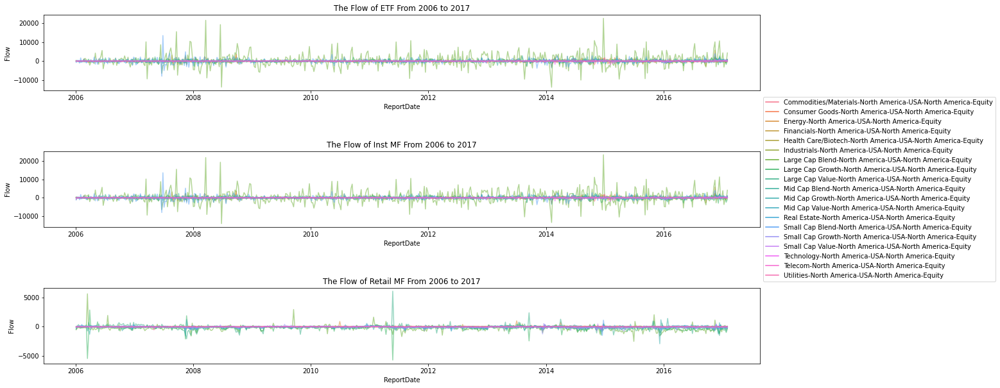

In [ ]:
# The trend of Flow for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='ReportDate',y='Flow', data=etf, hue='AssetClass',alpha=0.5)
axes[0].set_title('The Flow of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='ReportDate',y='Flow', data=inst, hue='AssetClass',alpha=0.5)
axes[1].set_title('The Flow of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='ReportDate',y='Flow', data=retail, hue='AssetClass',alpha=0.5)
axes[2].set_title('The Flow of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

The trend of Flow from 2006 to 2017:

* The fluctuation of flow in ETF and institutional MF data are larger than that in retail MF data. And the overall values for both input and output flow in the Asset Classes of two institutional datasets also larger than retail dataset. 
* The trend of flow over time in the two institutional fund holdings is similar, which is obviously different from retail fund holdings.


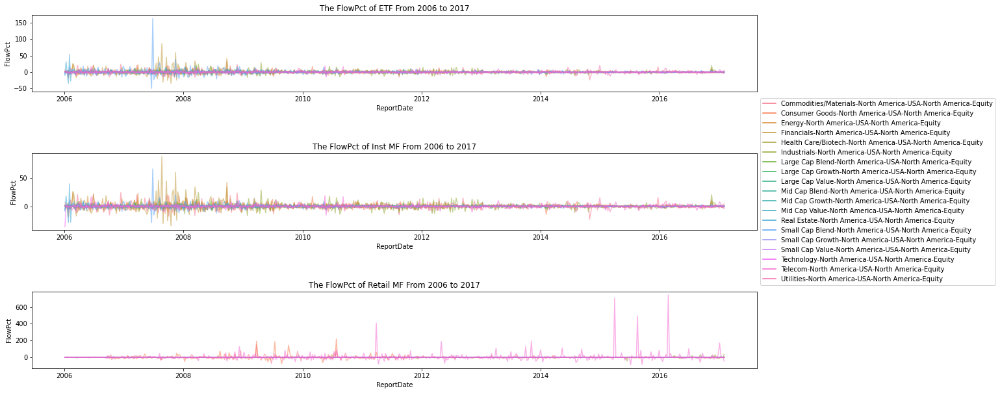

In [ ]:
# The trend of FlowPct for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='ReportDate',y='FlowPct', data=etf, hue='AssetClass',alpha=0.5)
axes[0].set_title('The FlowPct of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='ReportDate',y='FlowPct', data=inst, hue='AssetClass',alpha=0.5)
axes[1].set_title('The FlowPct of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='ReportDate',y='FlowPct', data=retail, hue='AssetClass',alpha=0.5)
axes[2].set_title('The FlowPct of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

For the trend of FlowPct:

* The upper two plots also show similar trend over time and significant different from that in the lower plot. 
* The number of asset class with large fluctuation of flowpct in retail mf is less than that in two institutional fund holdings. But the maximum of flowpct in retail fund holdings is larger than the other two and basically appeared around 2016.

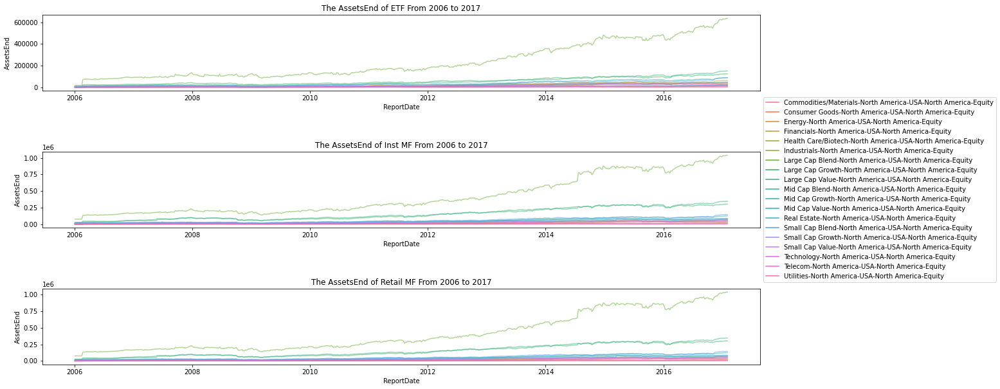

In [ ]:
# The trend of AssetsEnd for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='ReportDate',y='AssetsEnd', data=etf, hue='AssetClass',alpha=0.5)
axes[0].set_title('The AssetsEnd of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='ReportDate',y='AssetsEnd', data=inst, hue='AssetClass',alpha=0.5)
axes[1].set_title('The AssetsEnd of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='ReportDate',y='AssetsEnd', data=inst, hue='AssetClass',alpha=0.5)
axes[2].set_title('The AssetsEnd of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

For the trend of AssetsEnd:

* The AssetsEnd change in the upper two plots also show similar trend and there is a significant increase of one class over time, in other classes it increase relatively slower. The growth rate accelerated after 2014.
* But in the retail data, the overall growth rate is relatively slow.

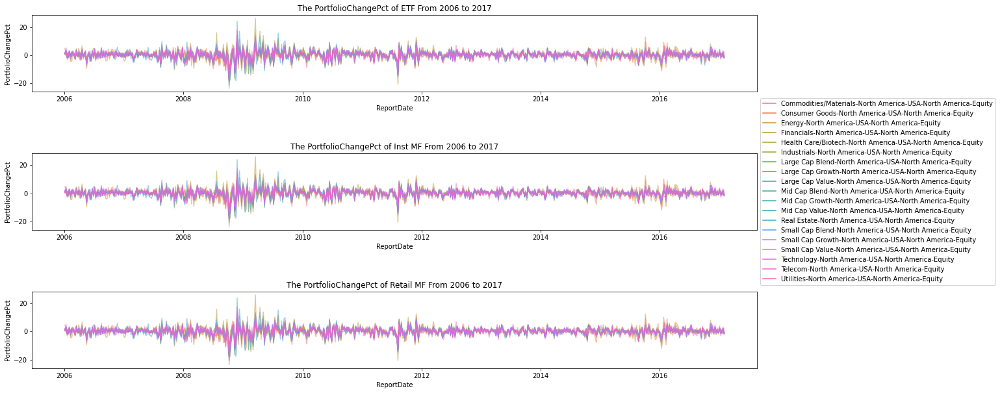

In [ ]:
# The trend of PortfolioChangePct for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='ReportDate',y='PortfolioChangePct', data=etf, hue='AssetClass',alpha=0.5)
axes[0].set_title('The PortfolioChangePct of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='ReportDate',y='PortfolioChangePct', data=inst, hue='AssetClass',alpha=0.5)
axes[1].set_title('The PortfolioChangePct of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='ReportDate',y='PortfolioChangePct', data=inst, hue='AssetClass',alpha=0.5)
axes[2].set_title('The PortfolioChangePct of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

For the trend of portfolio change percent:

* The three technologies have similar trend, for both range and asset class. This is make sense since portfolio change percent reflect changes in the entire stock market.

## Plots of Mean Value

The different colors in the following plots represent 20 different Asset classes in each fund market. The mean value of each variable would show a more clearly yearly trend compared to weekly trend showed in last part.

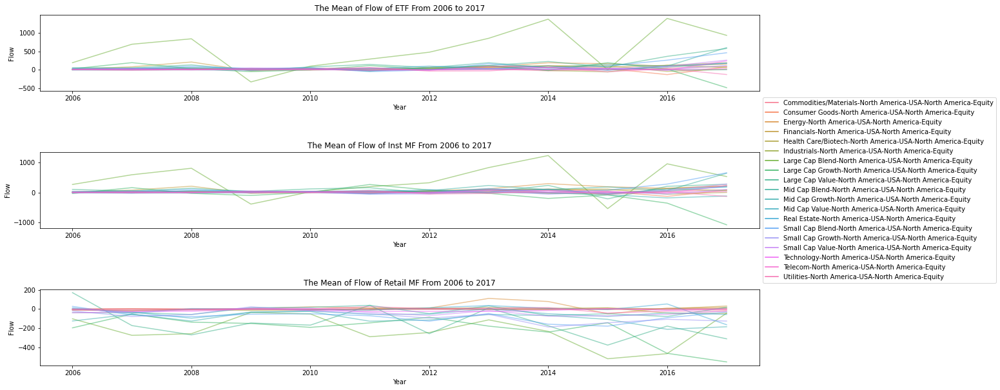

In [ ]:
# The mean of Flow for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='Year',y='Flow', data=etf_mean, hue='AssetClass',alpha=0.5)
axes[0].set_title('The Mean of Flow of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='Year',y='Flow', data=inst_mean, hue='AssetClass',alpha=0.5)
axes[1].set_title('The Mean of Flow of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='Year',y='Flow', data=retail_mean, hue='AssetClass',alpha=0.5)
axes[2].set_title('The Mean of Flow of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

For the mean of Flow in three markets, the overall trend and range for ETF and Institutional MF are closely realted to each other. The range of fluctuation for Retail MF is much smaller.

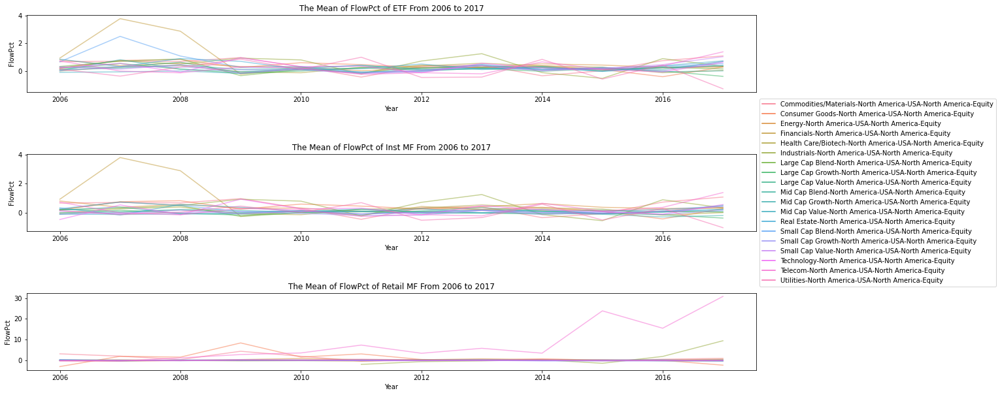

In [ ]:
# The mean of FlowPct for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='Year',y='FlowPct', data=etf_mean, hue='AssetClass',alpha=0.5)
axes[0].set_title('The Mean of FlowPct of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='Year',y='FlowPct', data=inst_mean, hue='AssetClass',alpha=0.5)
axes[1].set_title('The Mean of FlowPct of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='Year',y='FlowPct', data=retail_mean, hue='AssetClass',alpha=0.5)
axes[2].set_title('The Mean of FlowPct of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

For the mean of FlowPct in three markets, the overall trend and range for ETF and Institutional MF are closely related to each other. Especially in 2006-2009, the FlowPct of the finance sector fluctuated widely, probably resulting from the worldwide financial crisis. Other than the mean FlowPct of telecom sector in retail market increased a lot over time, the other sectors are relatively steady.

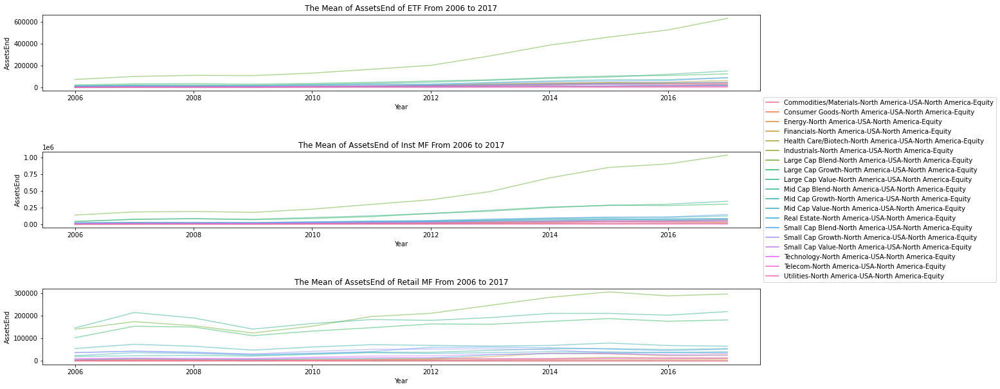

In [ ]:
# The mean of AssetsEnd for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='Year',y='AssetsEnd', data=etf_mean, hue='AssetClass',alpha=0.5)
axes[0].set_title('The Mean of AssetsEnd of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='Year',y='AssetsEnd', data=inst_mean, hue='AssetClass',alpha=0.5)
axes[1].set_title('The Mean of AssetsEnd of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='Year',y='AssetsEnd', data=retail_mean, hue='AssetClass',alpha=0.5)
axes[2].set_title('The Mean of AssetsEnd of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

The AssetsEnd in three markets all increased over time. The large cap blend sector increased quickly in all three markets. 

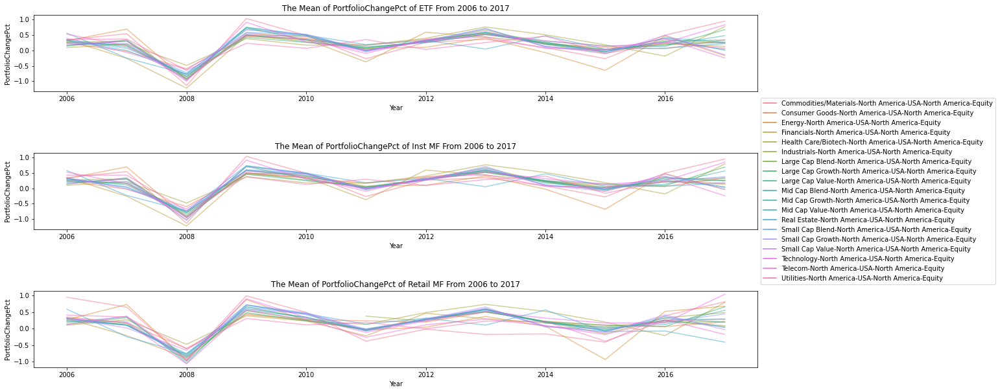

In [ ]:
# The mean of PortfolioChangePct for Each Fund Type From 2006 to 2017
fig, axes = plt.subplots(3, 1, figsize=(20, 10))

ax1 = sns.lineplot(ax=axes[0], x='Year',y='PortfolioChangePct', data=etf_mean, hue='AssetClass',alpha=0.5)
axes[0].set_title('The Mean of PortfolioChangePct of ETF From 2006 to 2017')

ax2 = sns.lineplot(ax=axes[1], x='Year',y='PortfolioChangePct', data=inst_mean, hue='AssetClass',alpha=0.5)
axes[1].set_title('The Mean of PortfolioChangePct of Inst MF From 2006 to 2017')

ax3 = sns.lineplot(ax=axes[2], x='Year',y='PortfolioChangePct', data=retail_mean, hue='AssetClass',alpha=0.5)
axes[2].set_title('The Mean of PortfolioChangePct of Retail MF From 2006 to 2017')

ax1.get_legend().remove()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax3.get_legend().remove()

plt.subplots_adjust(hspace = 0.8)
plt.show()

For the mean PortfolioChangePct in three markets, all sectors showed a huge decrease in 2007-2008 probably result from the worldwide financial crisis which caused almost all mutual funds were sold.

# VAR model 1-1: Within one market - ETF

%Portfolio_etf(t) = a + b1* %Flow_etf(t-1) + b2* %Portfolio_etf(t-1)

## Functions

### Preprocessing dataset

In [ ]:
# define a function for preprocessing dataset
def preprocessing(df): 
  # trim AssetClass names
  df['AssetClass'] = df['AssetClass'].str.replace('-North America-USA-North America-Equity', '')

  # convert ReportDate to datetime 
  df['ReportDate'] = pd.to_datetime(df["ReportDate"])
  
  # extract year
  df['year'] = df['ReportDate'].dt.year

  # set ReportDate as index
  df.sort_values("ReportDate", inplace=True)
  df.set_index('ReportDate', inplace=True)
  return df

In [ ]:
# Spliting each sector by names
etf = preprocessing(etf)
grouped = etf.groupby(etf['AssetClass'])

com_model1 = grouped.get_group('Commodities/Materials')
con_model1 = grouped.get_group('Consumer Goods')
ene_model1 = grouped.get_group('Energy')
fin_model1 = grouped.get_group('Financials')
hea_model1 = grouped.get_group('Health Care/Biotech')
ind_model1 = grouped.get_group('Industrials')
lcb_model1 = grouped.get_group('Large Cap Blend')
lcg_model1 = grouped.get_group('Large Cap Growth')
lcv_model1 = grouped.get_group('Large Cap Value')
mcb_model1 = grouped.get_group('Mid Cap Blend')
mcg_model1 = grouped.get_group('Mid Cap Growth')
mcv_model1 = grouped.get_group('Mid Cap Value')
rea_model1 = grouped.get_group('Real Estate')
scb_model1 = grouped.get_group('Small Cap Blend')
scg_model1 = grouped.get_group('Small Cap Growth')
scv_model1 = grouped.get_group('Small Cap Value')
tec_model1 = grouped.get_group('Technology')
tel_model1 = grouped.get_group('Telecom')
uti_model1 = grouped.get_group('Utilities')

#### Replacing outliers by clipping

In [ ]:
# imports
from scipy.stats.mstats import winsorize
from datetime import datetime as dt

In [ ]:
# replacing outliers which exceeded 1st and 99th quantile by 1st and 99th quantile value
def clip(df, lower, upper):
  print('Before cliping:')
  print(df["FlowPct"].agg([min, max]))
  print(df["PortfolioChangePct"].agg([min, max]))
  df['FlowPct'].clip(lower=df['FlowPct'].quantile(lower), upper=df['FlowPct'].quantile(upper), inplace=True)
  df['PortfolioChangePct'].clip(lower=df['PortfolioChangePct'].quantile(lower),\
                                upper=df['PortfolioChangePct'].quantile(upper), inplace=True)
  print('\nAfter cliping:')
  print(df["FlowPct"].agg([min, max]))
  print(df["PortfolioChangePct"].agg([min, max]))


In [ ]:
# drop the columns that we will not need in the following steps of model construction
com_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
con_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
ene_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
fin_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
hea_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
ind_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
lcb_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
lcg_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
lcv_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
mcb_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
mcg_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
mcv_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
rea_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
scb_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
scg_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
scv_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
tec_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
tel_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
uti_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### Causation using Granger’s Causality Test

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
  """Check Granger Causality of all possible combinations of the Time series.
  The rows are the response variable, columns are predictors. The values in the table 
  are the P-Values. P-Values lesser than the significance level (0.05), implies 
  the Null Hypothesis that the coefficients of the corresponding past values is 
  zero, that is, the X does not cause Y can be rejected.

  data      : pandas dataframe containing the time series variables
  variables : list containing names of the time series variables.
  """
  df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
  for c in df.columns:
    for r in df.index:
      test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
      p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
      if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
      min_p_value = np.min(p_values)
      df.loc[r, c] = min_p_value
  df.columns = [var + '_x' for var in variables]
  df.index = [var + '_y' for var in variables]
  return df

If a given p-value is < significance level (0.05), then, the corresponding X series (column) causes the Y (row).


So, we can reject the null hypothesis and conclude `PortfolioChangePct_x` causes `FlowPct_y`.

### ADF test
Since the VAR model requires the time series you want to forecast to be stationary, it is customary to check all the time series in the system for stationarity.

If a series is found to be non-stationary, you can make it stationary by differencing the series once and repeat the test again until it becomes stationary.

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
def adf_test(df):
  adf1 = adfuller(df['FlowPct'], 12)
  print("Statistics analysis of FlowPct\n")
  print("Statistic Test:", adf1[0])
  print("p-value:", adf1[1])
  # print("n_lags:", adf[2])
  # print("Number of observation:", adf[3])
  # for key,value in adf[4].items():
  #     print(f" Critical value {key}: {value}")
  p_value = adf1[1]
  if p_value <= 0.05:
    print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
    print(f" => Series is Stationary.\n")
  else:
    print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
    print(f" => Series is Non-Stationary.\n")

  adf2 = adfuller(df['PortfolioChangePct'], 12)
  print("Statistics analysis of PortfolioChangePct\n")
  print("Statistic Test:", adf2[0])
  print("p-value:", adf2[1])
  p_value = adf2[1]
  if p_value <= 0.05:
    print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
    print(f" => Series is Stationary.")
  else:
    print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
    print(f" => Series is Non-Stationary.")

#### Split()

Split dataset to training and test sets(last 10 data points).

In [ ]:
# carry-out the train-test split of the data and keep the last 10-weeks as test data.
def split(df, observations=10):
  global train
  global test
  train = df.iloc[:-observations,:]
  test = df.iloc[-observations:,:]
  # return train, test

### Durbin Watson Statistic

If there is any correlation left in the residuals, then, 
there is some pattern in the time series that is still left to be explained by the model. 
In that case, the typical course of action is to either increase the order of the model 
or induce more predictors into the system or look for a different algorithm to model the time series.

The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
and the closer it is to 4 implies negative serial correlation.

In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
from statsmodels.stats.stattools import durbin_watson

def dw_statistic(df):
  out = durbin_watson(results.resid)
  global sample
  sample = df[['FlowPct', 'PortfolioChangePct']]
  print('Durbin Watson Statistic:')
  for col, val in zip(sample.columns, out):
      print(col, ':', round(val, 2))

###  Forecast Accuracy 

In [ ]:
# evaluate the forecasts
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
  rmse = np.mean((forecast - actual)**2)**.5  # RMSE
  corr = np.corrcoef(forecast, actual)[0,1]   # corr
  mins = np.amin(np.hstack([forecast[:,None], 
                            actual[:,None]]), axis=1)
  maxs = np.amax(np.hstack([forecast[:,None], 
                            actual[:,None]]), axis=1)
  minmax = 1 - np.mean(mins/maxs)             # minmax
  return({'rmse':rmse, 'corr':corr})

def print_forecast_accuracy(test):
  print('Forecast Accuracy of: FlowPct:')
  accuracy_prod = forecast_accuracy(test['FlowPct_forecast'], test['FlowPct'])
  for k, v in accuracy_prod.items():
    print(k, ': ', round(v,4))

  print('\nForecast Accuracy of: PortfolioPct')
  accuracy_prod = forecast_accuracy(test['PortfolioChangePct_forecast'], test['PortfolioChangePct'])
  for k, v in accuracy_prod.items():
    print(k, ': ', round(v,4))

In [ ]:
# evaluate the direction of forecasts
from sklearn.metrics import accuracy_score
def direc_accuracy(direc):
  print(f"The accuracy score for FlowPct is", accuracy_score(direc["F_e"], direc["F_e_forecast"]))
  print(f"The accuracy score for PortfolioChangePct is", accuracy_score(direc["P_e"], direc["P_e_forecast"]))
  # print(f"The accuracy score for FlowPct_e is", accuracy_score(direc["F_e"], direc["F_e_forecast"]))
  # print(f"The accuracy score for PortfolioChangePct_e is", accuracy_score(direc["P_e"], direc["P_e_forecast"]))

### change_binary()
To better understanding the directional patterns of the forecasts, we change actual values to binary number to detect direction.

In [ ]:
# if FlowPct_i(t) is 0.1 lower than FlowPct_i(t-1): convert value to -1
# elif FlowPct_i(t) is 0.1 higher than FlowPct_i(t-1): convert value to 1
# else: 0

def change_binary(direc, test_len=9, threshold=0.1):
  for i in range(test_len):
    if direc["FlowPct"][i+1] < (direc["FlowPct"][i]-threshold):
      direc["F_e"][i+1] = -1
    elif direc["FlowPct"][i+1] > (direc["FlowPct"][i]+threshold):
      direc["F_e"][i+1] = 1
    else:
      direc["F_e"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct"][i+1] < (direc["PortfolioChangePct"][i]-threshold):
      direc["P_e"][i+1] = -1
    elif direc["PortfolioChangePct"][i+1] > (direc["PortfolioChangePct"][i]+threshold):
      direc["P_e"][i+1] = 1
    else:
      direc["P_e"][i+1] = 0

  # for i in range(test_len):
  #   if direc["FlowPct_e"][i+1] < (direc["FlowPct_e"][i]-threshold):
  #     direc["F_e"][i+1] = -1
  #   elif direc["FlowPct_e"][i+1] > (direc["FlowPct_e"][i]+threshold):
  #     direc["F_e"][i+1] = 1
  #   else:
  #     direc["F_e"][i+1] = 0

  # for i in range(test_len):
  #   if direc["PortfolioChangePct_e"][i+1] < (direc["PortfolioChangePct_e"][i]-threshold):
  #     direc["P_e"][i+1] = -1
  #   elif direc["PortfolioChangePct_e"][i+1] > (direc["PortfolioChangePct_e"][i]+threshold):
  #     direc["P_e"][i+1] = 1
  #   else:
  #     direc["P_e"][i+1] = 0 

  for i in range(test_len):
    if direc["FlowPct_forecast"][i+1] < (direc["FlowPct_forecast"][i]-threshold):
      direc["F_e_forecast"][i+1] = -1
    elif direc["FlowPct_forecast"][i+1] > (direc["FlowPct_forecast"][i]+threshold):
      direc["F_e_forecast"][i+1] = 1
    else:
      direc["F_e_forecast"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct_forecast"][i+1] < (direc["PortfolioChangePct_forecast"][i]-threshold):
      direc["P_e_forecast"][i+1] = -1
    elif direc["PortfolioChangePct_forecast"][i+1] > (direc["PortfolioChangePct_forecast"][i]+threshold):
      direc["P_e_forecast"][i+1] = 1
    else:
      direc["P_e_forecast"][i+1] = 0

  # for i in range(test_len):
  #   if direc["FlowPct_e_forecast"][i+1] < (direc["FlowPct_e_forecast"][i]-threshold):
  #     direc["F_e_forecast"][i+1] = -1
  #   elif direc["FlowPct_e_forecast"][i+1] > (direc["FlowPct_e_forecast"][i]+threshold):
  #     direc["F_e_forecast"][i+1] = 1
  #   else:
  #     direc["F_e_forecast"][i+1] = 0

  # for i in range(test_len):
  #   if direc["PortfolioChangePct_e_forecast"][i+1] < (direc["PortfolioChangePct_e_forecast"][i]-threshold):
  #     direc["P_e_forecast"][i+1] = -1
  #   elif direc["PortfolioChangePct_e_forecast"][i+1] > (direc["PortfolioChangePct_e_forecast"][i]+threshold):
  #     direc["P_e_forecast"][i+1] = 1
  #   else:
  #     direc["P_e_forecast"][i+1] = 0

## tec, Technology

In [ ]:
clip(tec_model1, 0.01, 0.99)

Before cliping:
min    -6.7875
max    11.4324
Name: FlowPct, dtype: float64
min   -15.3008
max    10.7991
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.330036
max    4.633334
Name: FlowPct, dtype: float64
min   -6.828954
max    5.966820
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(tec_model1, variables = tec_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.000,0.0
PortfolioChangePct_y,0.101,1.0


In [ ]:
adf_test(tec_model1)

Statistics analysis of FlowPct

Statistic Test: -8.562636954967532
p-value: 8.612599912366354e-14
 => P-Value = 8.612599912366354e-14. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.8973525716272
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(tec_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(tec_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.0903,-0.9629,0.577314,0.144187
2016-12-07,-0.3500,1.3446,0.399613,0.233701
2016-12-14,1.1905,1.0698,0.348778,0.150926
2016-12-21,0.4327,0.3322,0.625205,0.818517
2016-12-28,0.7225,-0.6621,0.209660,-0.293519
2017-01-04,0.2704,0.5422,0.416402,0.088374
2017-01-11,1.1511,1.7914,0.160661,0.325685
2017-01-18,-0.5387,-0.0887,0.309298,0.010823
2017-01-25,1.9491,2.5034,0.205123,0.341062


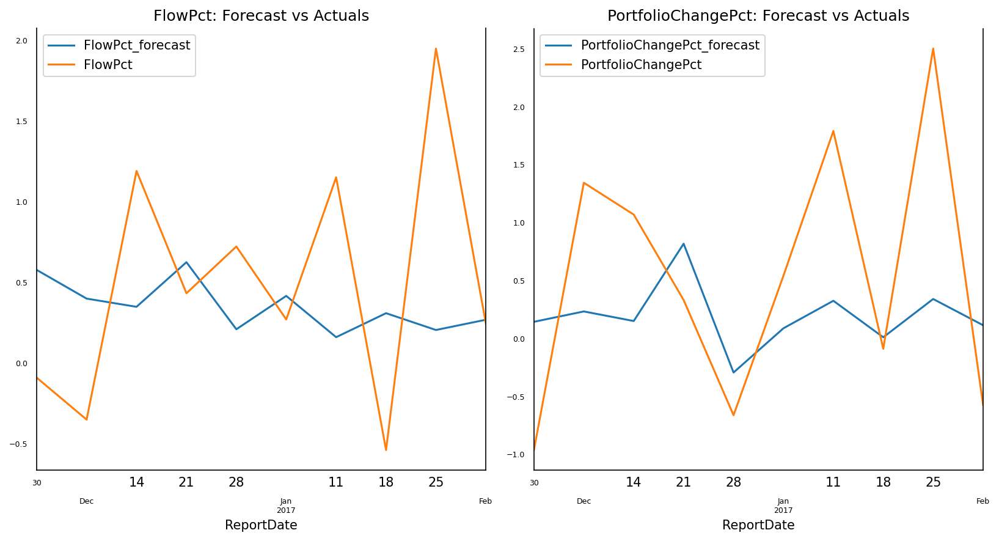

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tec_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.8234
corr :  -0.4746

Forecast Accuracy of: PortfolioPct
rmse :  1.0578
corr :  0.4108


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

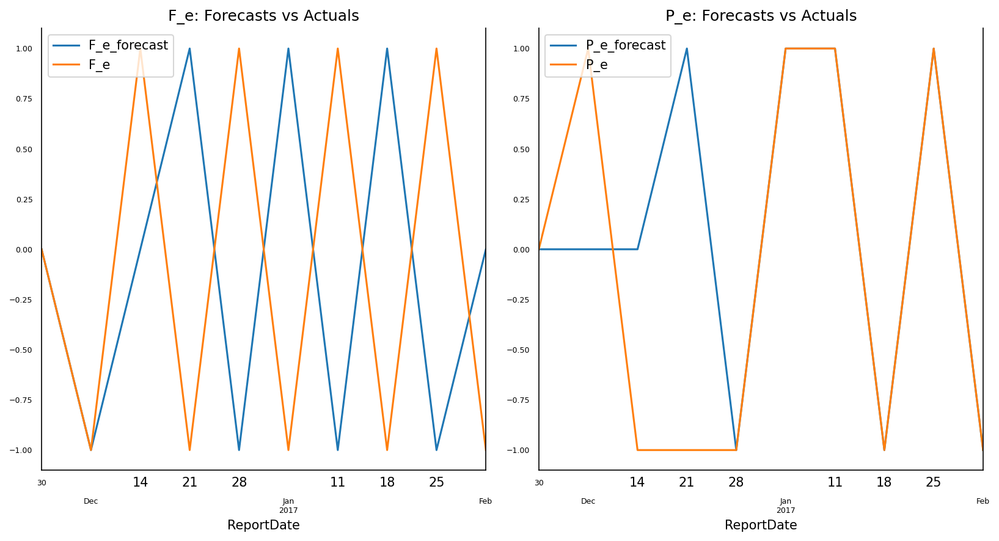

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.2
The accuracy score for PortfolioChangePct is 0.7


## com, Commodites

In [ ]:
clip(com_model1, 0.01, 0.99)

Before cliping:
min   -23.4348
max    24.1811
Name: FlowPct, dtype: float64
min   -16.2342
max    14.8178
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -12.163258
max    19.431848
Name: FlowPct, dtype: float64
min   -9.95508
max    9.13669
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(com_model1, variables = com_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0033
PortfolioChangePct_y,0.6564,1.0000


In [ ]:
adf_test(com_model1)

Statistics analysis of FlowPct

Statistic Test: -15.186311356394338
p-value: 6.097695100660422e-28
 => P-Value = 6.097695100660422e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -7.046521718749919
p-value: 5.668199723083446e-10
 => P-Value = 5.668199723083446e-10. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(com_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(com_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,1.8666,0.7372,-1.608482,0.261344
2016-12-07,3.1674,3.1492,0.488038,-1.034812
2016-12-14,2.8129,-1.9103,0.335756,0.682811
2016-12-21,0.4329,-0.3272,-0.165672,0.716290
2016-12-28,-1.2311,-0.7106,1.850511,0.097697
2017-01-04,-3.2393,2.0278,-0.129629,0.634658
2017-01-11,2.1729,0.6521,0.118320,0.107060
2017-01-18,-1.1630,0.0477,0.639356,0.698318
2017-01-25,3.1760,3.2382,0.161246,0.730377


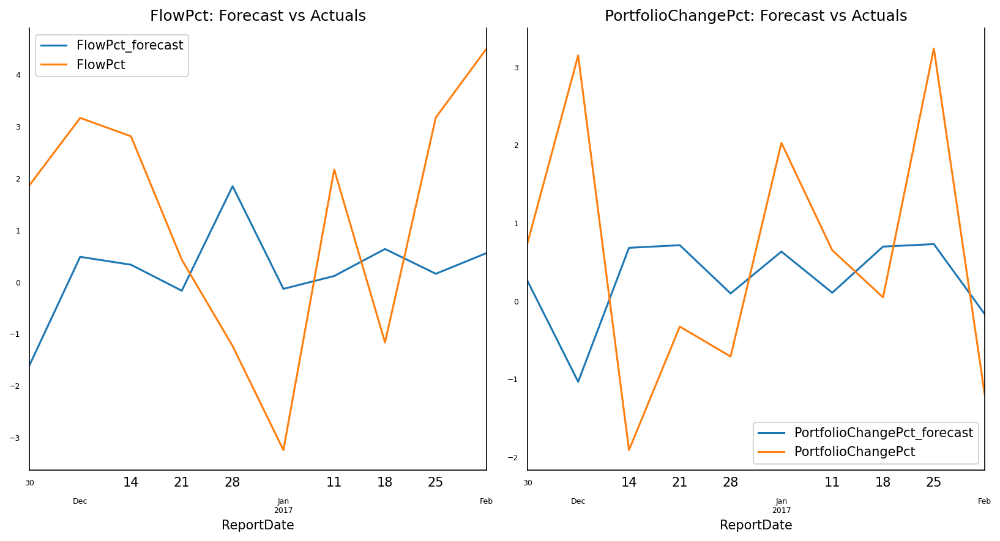

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    com_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  2.7755
corr :  -0.1417

Forecast Accuracy of: PortfolioPct
rmse :  1.9028
corr :  -0.2555


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,-1
2016-12-14,-1,-1,-1,1
2016-12-21,-1,1,-1,0
2016-12-28,-1,-1,1,-1
2017-01-04,-1,1,-1,1
2017-01-11,1,-1,1,-1
2017-01-18,-1,-1,1,1
2017-01-25,1,1,-1,0


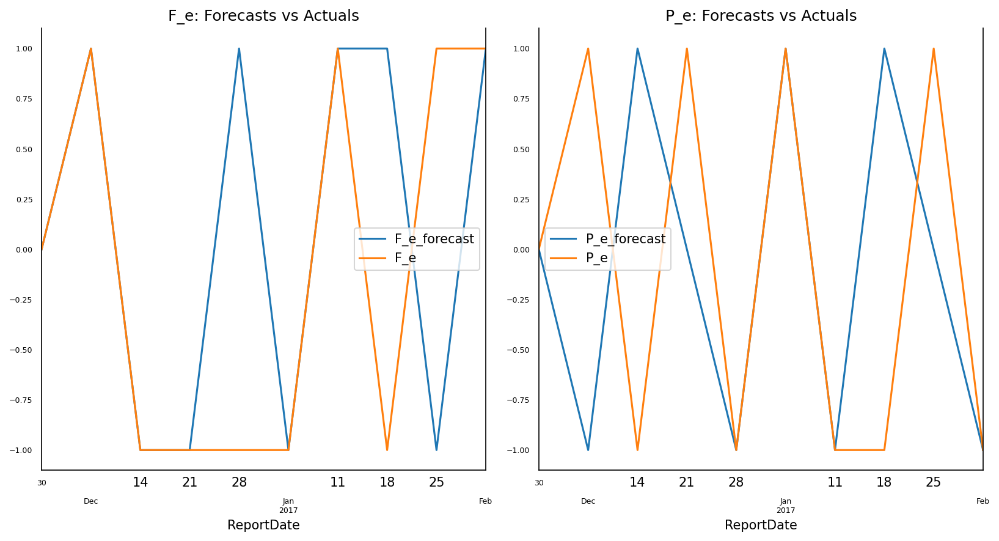

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.7
The accuracy score for PortfolioChangePct is 0.5


## con, Consumer Goods

In [ ]:
clip(con_model1, 0.01, 0.99)

Before cliping:
min   -18.1069
max    18.2202
Name: FlowPct, dtype: float64
min   -13.7816
max     9.5154
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -8.928864
max    9.347064
Name: FlowPct, dtype: float64
min   -6.080418
max    4.808350
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(con_model1, variables = tec_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0256
PortfolioChangePct_y,0.0758,1.0000


In [ ]:
adf_test(con_model1)

Statistics analysis of FlowPct

Statistic Test: -20.17970617091141
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -27.301373896861097
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(con_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(con_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-2.3960,-1.0488,0.644346,0.065626
2016-12-07,0.7215,2.5776,0.256063,0.239446
2016-12-14,-0.1786,-0.0974,0.110080,0.352673
2016-12-21,0.2317,0.2013,0.532966,0.311604
2016-12-28,-1.0204,-1.2451,-0.050331,-0.048119
2017-01-04,1.4222,0.8027,0.466369,0.334323
2017-01-11,1.2306,-0.1227,0.117893,0.246731
2017-01-18,-2.2893,0.8026,0.491606,0.177424
2017-01-25,-0.0724,1.3596,0.291840,0.214352


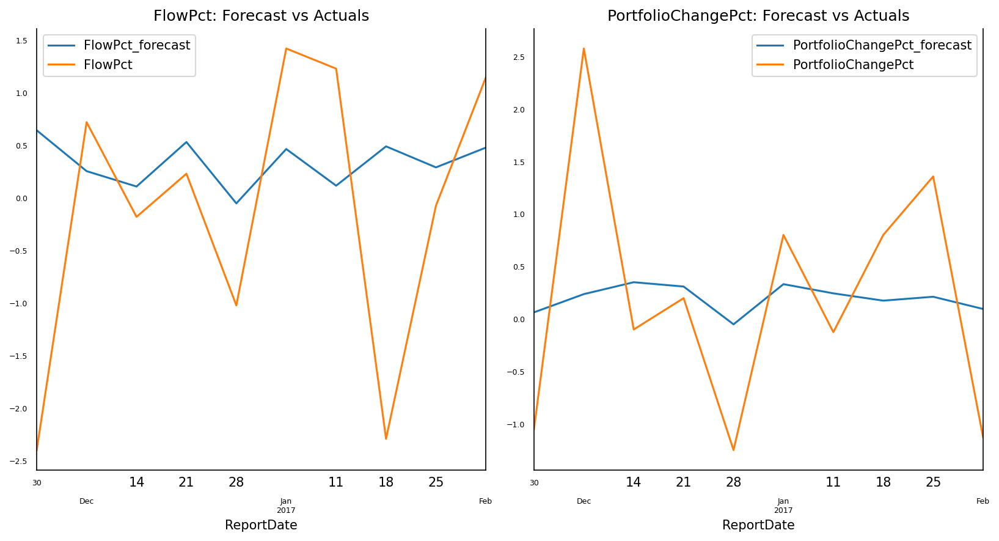

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    con_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.4505
corr :  -0.2106

Forecast Accuracy of: PortfolioPct
rmse :  1.0912
corr :  0.5542


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,1
2016-12-14,-1,-1,-1,1
2016-12-21,1,1,1,0
2016-12-28,-1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,-1,0
2017-01-18,-1,1,1,0
2017-01-25,1,1,-1,0


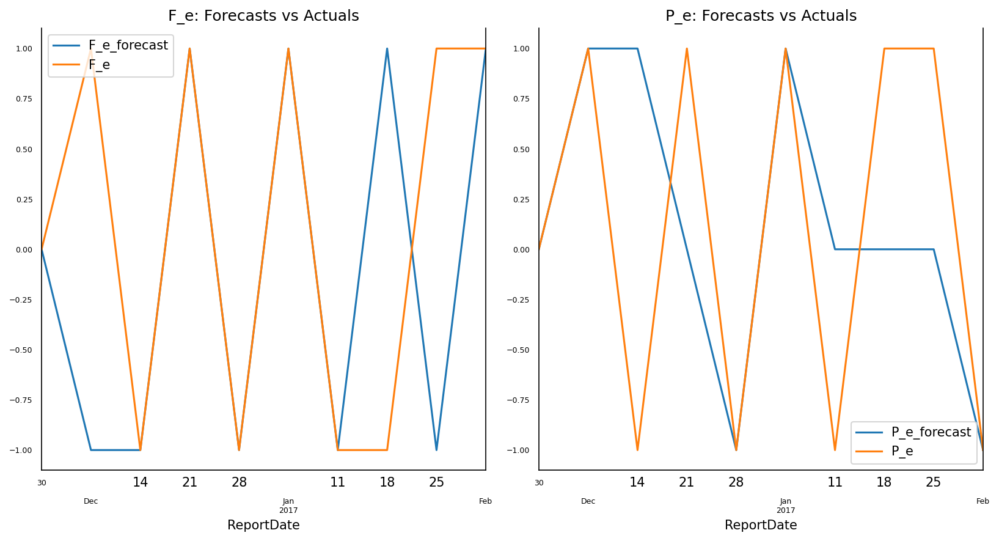

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.7
The accuracy score for PortfolioChangePct is 0.5


## ene, Energy

In [ ]:
clip(ene_model1, 0.01, 0.99)

Before cliping:
min   -12.5125
max    41.7749
Name: FlowPct, dtype: float64
min   -18.5475
max    13.3104
Name: PortfolioChangePct, dtype: float64

After cliping:
min    -8.423200
max    12.821116
Name: FlowPct, dtype: float64
min   -9.265556
max    8.974300
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(ene_model1, variables = ene_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0713
PortfolioChangePct_y,0.1475,1.0000


In [ ]:
adf_test(ene_model1)

Statistics analysis of FlowPct

Statistic Test: -11.42554424215172
p-value: 6.709588128361054e-21
 => P-Value = 6.709588128361054e-21. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -8.095257831483973
p-value: 1.3444309342318594e-12
 => P-Value = 1.3444309342318594e-12. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(ene_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(ene_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.8408,0.9536,0.040669,0.200947
2016-12-07,2.4100,1.2989,-0.038369,-0.408994
2016-12-14,0.9282,-0.0779,0.119196,0.250951
2016-12-21,1.0391,1.1911,0.813025,0.413886
2016-12-28,0.1179,0.1269,0.289263,-0.398098
2017-01-04,0.7958,0.8478,0.399372,0.439846
2017-01-11,-0.5855,-0.9192,-0.138126,0.240381
2017-01-18,0.4934,-0.2861,0.359552,0.326373
2017-01-25,0.5019,1.3951,0.390893,0.199654


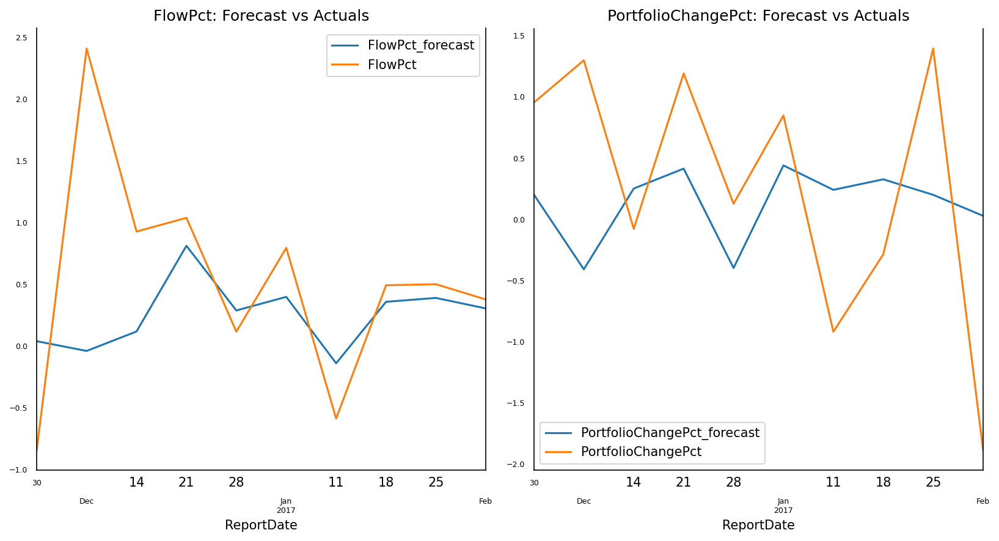

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ene_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.8888
corr :  0.1892

Forecast Accuracy of: PortfolioPct
rmse :  1.07
corr :  0.0086


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,0,-1
2016-12-14,-1,-1,1,1
2016-12-21,1,1,1,1
2016-12-28,-1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,-1,-1
2017-01-18,1,1,1,0
2017-01-25,0,1,0,-1


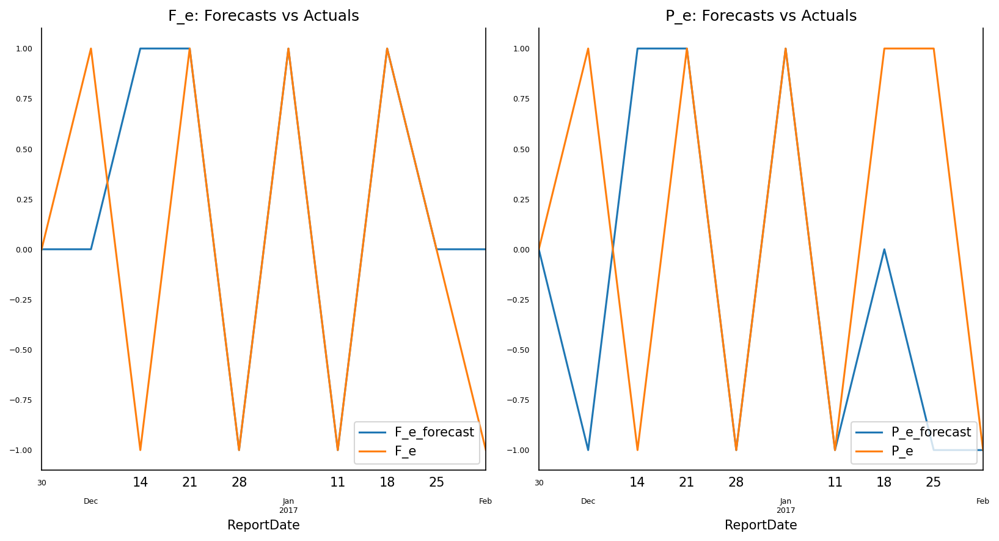

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.7
The accuracy score for PortfolioChangePct is 0.6


## fin, Financials

In [ ]:
clip(fin_model1, 0.01, 0.99)

Before cliping:
min   -33.9052
max    86.7209
Name: FlowPct, dtype: float64
min   -23.5057
max    25.9750
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -15.700446
max    30.041262
Name: FlowPct, dtype: float64
min   -13.116644
max    11.851662
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(fin_model1, variables = tec_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.2507,1.0


In [ ]:
adf_test(fin_model1)

Statistics analysis of FlowPct

Statistic Test: -5.286028986165403
p-value: 5.852573002843533e-06
 => P-Value = 5.852573002843533e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -28.98326055481591
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(fin_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(fin_model1)

Durbin Watson Statistic:
FlowPct : 1.98
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.5068,0.0898,-0.334169,-0.595227
2016-12-07,1.4953,3.0108,0.681429,0.324535
2016-12-14,-0.0880,-0.4981,-0.217810,0.037300
2016-12-21,0.0359,1.2372,0.266060,0.310175
2016-12-28,0.7249,-0.7348,1.794026,-0.045854
2017-01-04,0.9039,1.7019,1.794002,-0.063288
2017-01-11,0.7279,-0.2172,0.969811,-0.137100
2017-01-18,-0.8253,-1.3596,1.105406,-0.000064
2017-01-25,-0.8272,1.4456,0.593848,-0.233364


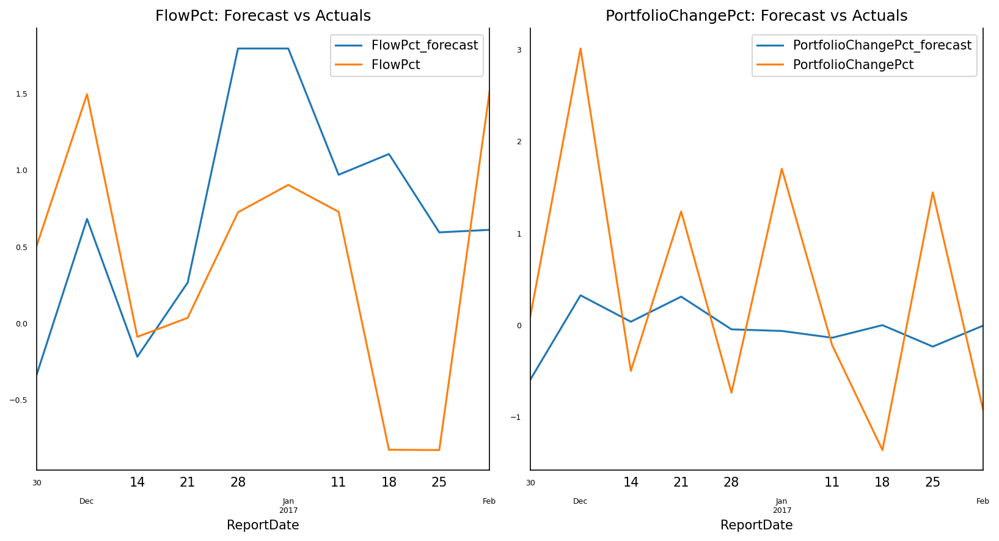

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    fin_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.9998
corr :  0.1829

Forecast Accuracy of: PortfolioPct
rmse :  1.3391
corr :  0.3217


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,1
2016-12-14,-1,-1,-1,-1
2016-12-21,1,1,1,1
2016-12-28,1,-1,1,-1
2017-01-04,1,1,0,0
2017-01-11,-1,-1,-1,0
2017-01-18,-1,-1,1,1
2017-01-25,0,1,-1,-1


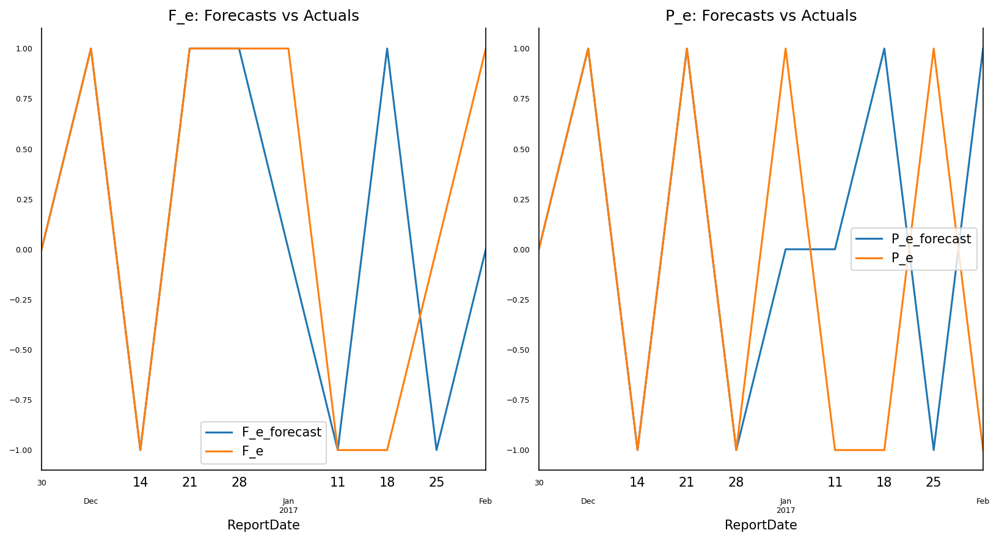

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.6
The accuracy score for PortfolioChangePct is 0.5


## hea, Health

In [ ]:
clip(hea_model1, 0.01, 0.99)

Before cliping:
min    -8.2786
max    10.5918
Name: FlowPct, dtype: float64
min   -12.3360
max     9.3791
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.631296
max    7.077042
Name: FlowPct, dtype: float64
min   -6.549290
max    5.979792
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(hea_model1, variables = hea_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0175,1.0


In [ ]:
adf_test(hea_model1)

Statistics analysis of FlowPct

Statistic Test: -25.314177205304514
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.002012162666432
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(hea_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(hea_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.2329,-1.9607,-0.030420,-0.845447
2016-12-07,-1.1335,-1.5622,-0.572204,-0.966576
2016-12-14,-1.1893,1.5313,0.138641,-0.042780
2016-12-21,0.4557,-0.5638,0.013516,0.357074
2016-12-28,0.3326,0.1316,0.013133,0.018615
2017-01-04,-0.1149,2.6237,0.700867,0.315107
2017-01-11,1.4079,0.5128,0.128901,-0.127812
2017-01-18,-0.6582,-0.2202,0.576707,-0.346835
2017-01-25,-1.5861,-1.3357,-0.062606,0.117794


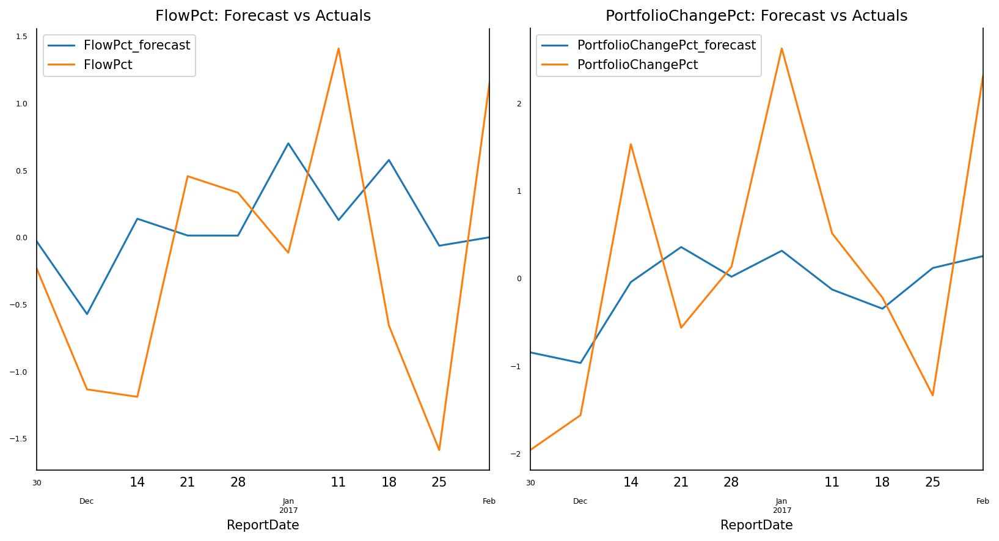

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    hea_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.9947
corr :  0.1461

Forecast Accuracy of: PortfolioPct
rmse :  1.3054
corr :  0.6524


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,-1
2016-12-14,0,1,1,1
2016-12-21,1,-1,-1,1
2016-12-28,-1,1,0,-1
2017-01-04,-1,1,1,1
2017-01-11,1,-1,-1,-1
2017-01-18,-1,-1,1,-1
2017-01-25,-1,-1,-1,1


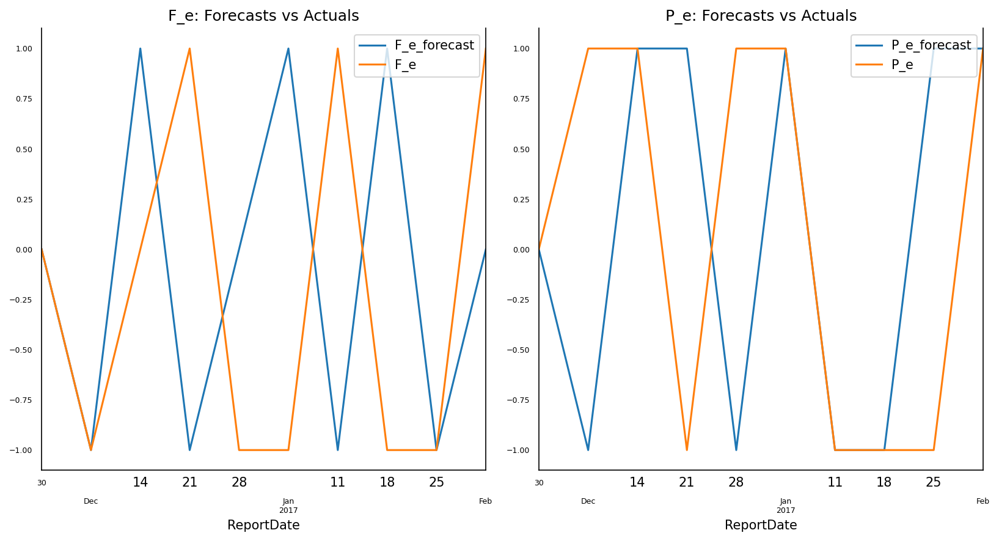

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.6


## Ind, Industrials

In [ ]:
clip(ind_model1, 0.01, 0.99)

Before cliping:
min   -16.1672
max    28.3710
Name: FlowPct, dtype: float64
min   -14.4854
max    10.7326
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -12.165120
max    14.648882
Name: FlowPct, dtype: float64
min   -7.790434
max    6.705066
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(ind_model1, variables = ind_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0948
PortfolioChangePct_y,0.5526,1.0000


In [ ]:
adf_test(ind_model1)

Statistics analysis of FlowPct

Statistic Test: -15.261648778980566
p-value: 4.851516319500406e-28
 => P-Value = 4.851516319500406e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -24.79761893512901
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(ind_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(ind_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,6.9235,-0.0274,-1.497001,0.097829
2016-12-07,5.4389,2.8380,-2.379795,-0.242797
2016-12-14,0.2535,-1.8550,-0.188631,0.505253
2016-12-21,-0.8577,0.3464,0.922631,0.677117
2016-12-28,0.5649,-0.9703,1.153519,0.257779
2017-01-04,0.1110,1.0017,1.825804,0.419705
2017-01-11,2.2952,0.1745,-0.384003,-0.340523
2017-01-18,-1.7869,-0.5015,0.444834,0.020300
2017-01-25,1.1878,2.1932,0.533749,0.226690


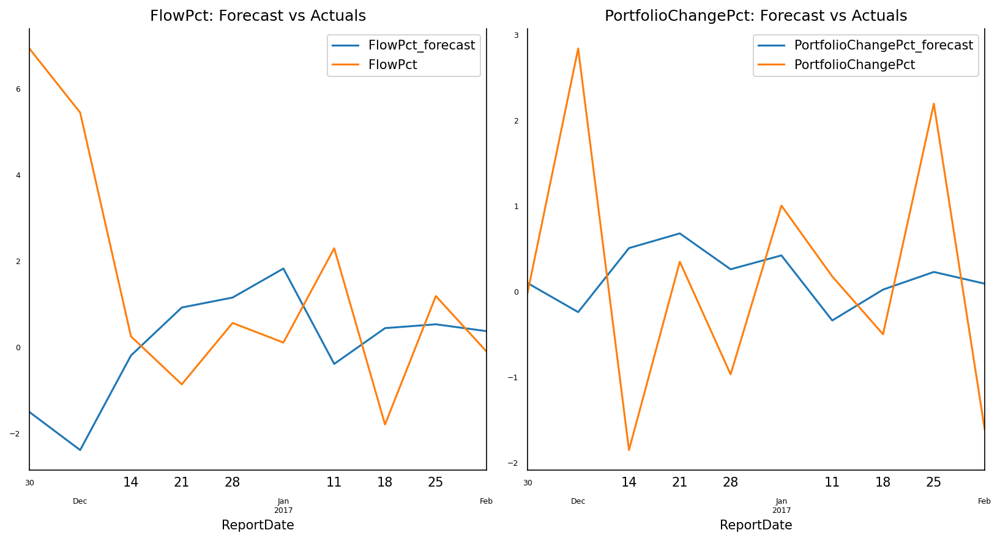

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ind_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  3.8923
corr :  -0.8168

Forecast Accuracy of: PortfolioPct
rmse :  1.5599
corr :  -0.2778


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,-1
2016-12-14,-1,-1,1,1
2016-12-21,-1,1,1,1
2016-12-28,1,-1,1,-1
2017-01-04,-1,1,1,1
2017-01-11,1,-1,-1,-1
2017-01-18,-1,-1,1,1
2017-01-25,1,1,0,1


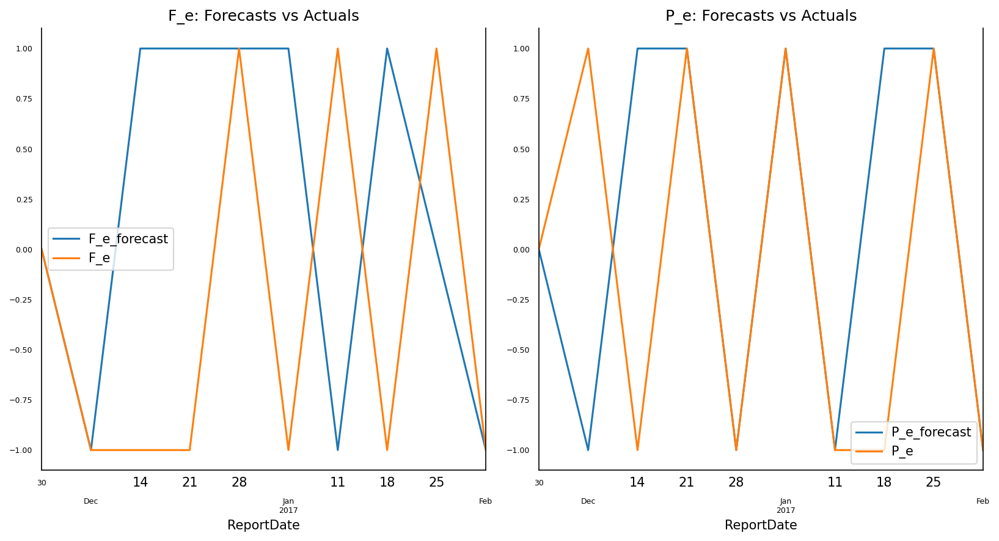

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.7


## lcb, Large Capital Blend

In [ ]:
clip(lcb_model1, 0.01, 0.99)

Before cliping:
min   -11.2136
max    21.8692
Name: FlowPct, dtype: float64
min   -15.1554
max    10.0611
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.644712
max    8.464516
Name: FlowPct, dtype: float64
min   -6.690584
max    5.653494
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(lcb_model1, variables = lcb_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.3083
PortfolioChangePct_y,0.0064,1.0000


In [ ]:
adf_test(lcb_model1)

Statistics analysis of FlowPct

Statistic Test: -6.033110874257526
p-value: 1.4025817519371785e-07
 => P-Value = 1.4025817519371785e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.32812488820114
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcb_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(lcb_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.1877,-0.2158,-0.100284,-0.002338
2016-12-07,1.0026,1.9549,0.172032,0.078258
2016-12-14,1.7608,0.4868,0.127618,0.016987
2016-12-21,-0.1069,0.4034,0.345094,0.427451
2016-12-28,0.1094,-0.6656,-0.037740,-0.273478
2017-01-04,0.7078,0.9643,0.239142,0.288961
2017-01-11,-0.5008,0.1717,0.097791,0.259441
2017-01-18,0.0061,-0.1196,0.178441,-0.046881
2017-01-25,-0.1512,1.1463,0.032807,0.151698


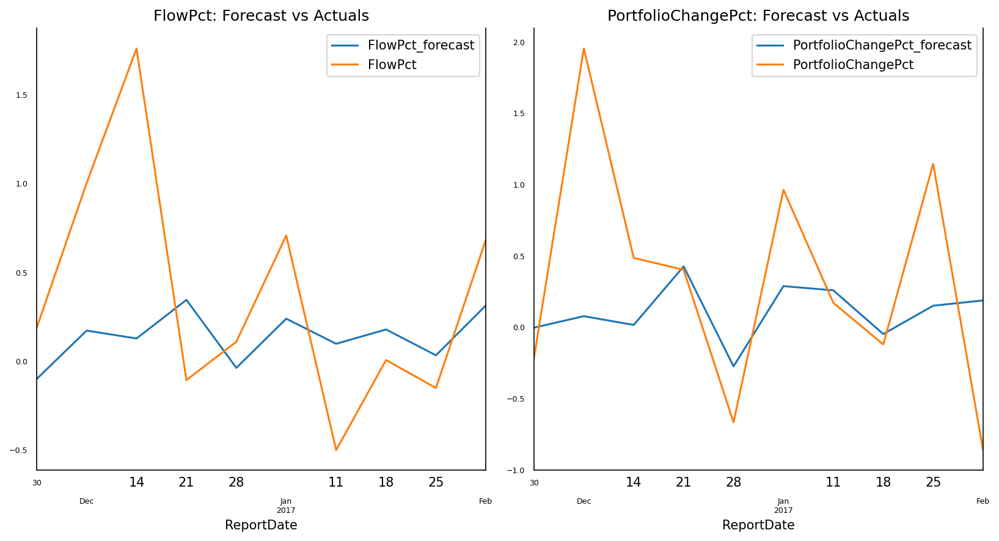

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcb_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.6667
corr :  0.1863

Forecast Accuracy of: PortfolioPct
rmse :  0.8063
corr :  0.3248


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,0
2016-12-14,1,-1,0,0
2016-12-21,-1,0,1,1
2016-12-28,1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,-1,0
2017-01-18,1,-1,0,-1
2017-01-25,-1,1,-1,1


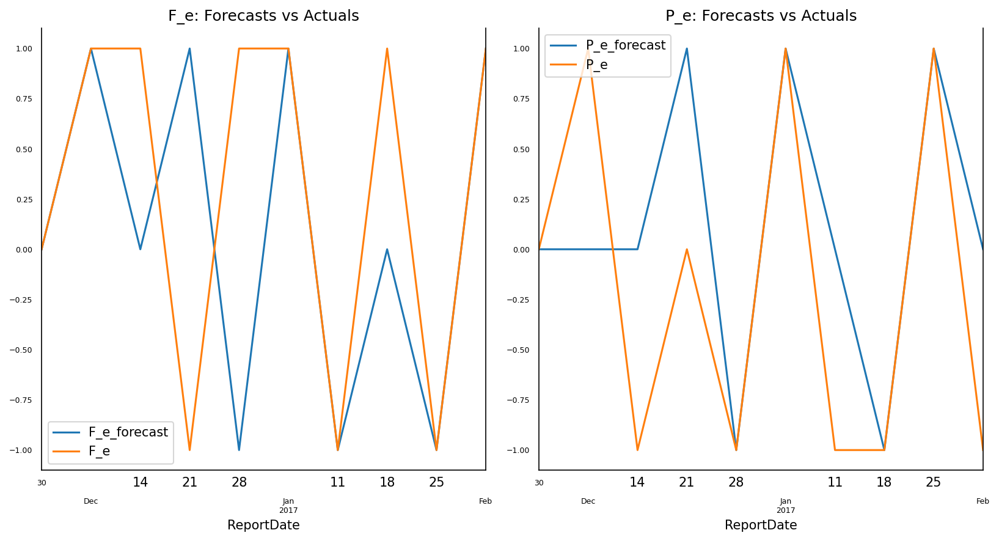

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.6
The accuracy score for PortfolioChangePct is 0.5


## lcg, Large Capital Growth

In [ ]:
clip(lcg_model1, 0.01, 0.99)

Before cliping:
min   -6.5109
max    6.6138
Name: FlowPct, dtype: float64
min   -14.7200
max     9.5671
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -3.250674
max    4.395944
Name: FlowPct, dtype: float64
min   -6.341728
max    5.681964
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(lcg_model1, variables = lcg_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0096,1.0


In [ ]:
adf_test(lcg_model1)

Statistics analysis of FlowPct

Statistic Test: -6.401918076770359
p-value: 1.9858399648099623e-08
 => P-Value = 1.9858399648099623e-08. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.91838673707608
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcg_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(lcg_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.5848,-0.7664,0.467626,-0.193374
2016-12-07,-1.6339,1.2043,0.014820,0.061593
2016-12-14,2.3615,0.9275,0.079585,0.014924
2016-12-21,0.8457,0.4607,0.023806,0.154181
2016-12-28,0.3159,-0.5839,-0.178433,-0.568983
2017-01-04,-0.5118,0.7395,-0.032639,0.402433
2017-01-11,-0.0468,1.3175,0.165656,0.400807
2017-01-18,-0.0982,0.1952,0.314532,-0.091563
2017-01-25,-1.3694,1.4661,-0.039105,0.108298


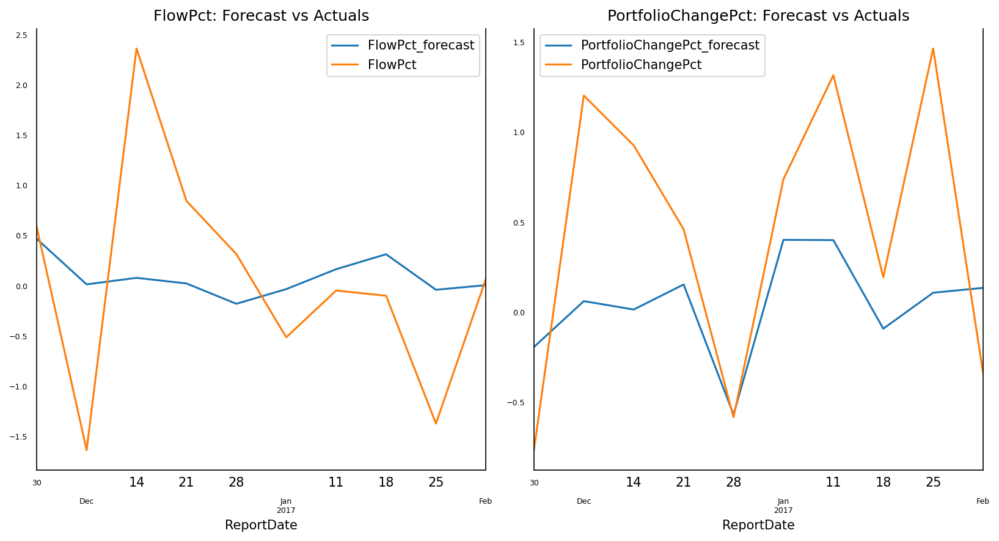

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcg_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.0525
corr :  0.2037

Forecast Accuracy of: PortfolioPct
rmse :  0.7527
corr :  0.6566


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,1
2016-12-14,1,-1,0,0
2016-12-21,-1,-1,0,1
2016-12-28,-1,-1,-1,-1
2017-01-04,-1,1,1,1
2017-01-11,1,1,1,0
2017-01-18,0,-1,1,-1
2017-01-25,-1,1,-1,1


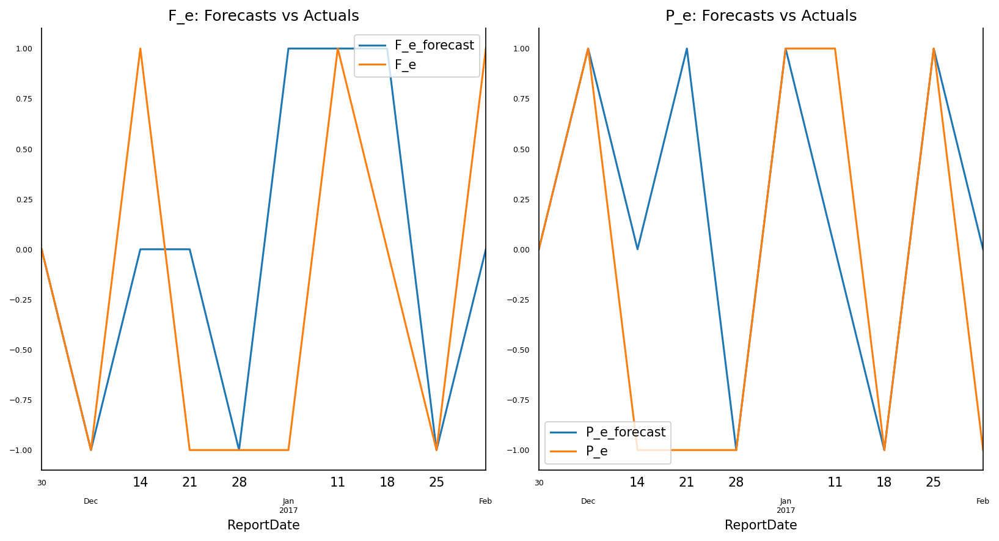

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.5
The accuracy score for PortfolioChangePct is 0.6


## lcv, Large Capital Value

In [ ]:
clip(lcv_model1, 0.01, 0.99)

Before cliping:
min    -6.4165
max    11.6349
Name: FlowPct, dtype: float64
min   -15.4760
max    10.9447
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -4.593902
max    6.710748
Name: FlowPct, dtype: float64
min   -6.70739
max    5.53821
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(lcv_model1, variables = lcv_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.000,0.1348
PortfolioChangePct_y,0.187,1.0000


In [ ]:
adf_test(lcv_model1)

Statistics analysis of FlowPct

Statistic Test: -5.982258901031189
p-value: 1.8267107301178512e-07
 => P-Value = 1.8267107301178512e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.03549432525816
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcv_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(lcv_model1)

Durbin Watson Statistic:
FlowPct : 2.01
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.4642,0.1789,0.139701,-0.153233
2016-12-07,0.6454,2.4630,0.247054,-0.019475
2016-12-14,1.3856,0.2503,0.139271,0.098836
2016-12-21,0.3287,0.6158,0.410915,0.323068
2016-12-28,0.1792,-0.6935,-0.000429,-0.283482
2017-01-04,0.5133,1.0564,0.327205,0.293591
2017-01-11,-0.0474,-0.4785,0.234800,0.287698
2017-01-18,0.3910,-0.3435,0.241986,-0.089346
2017-01-25,0.5271,1.1360,0.222898,0.008465


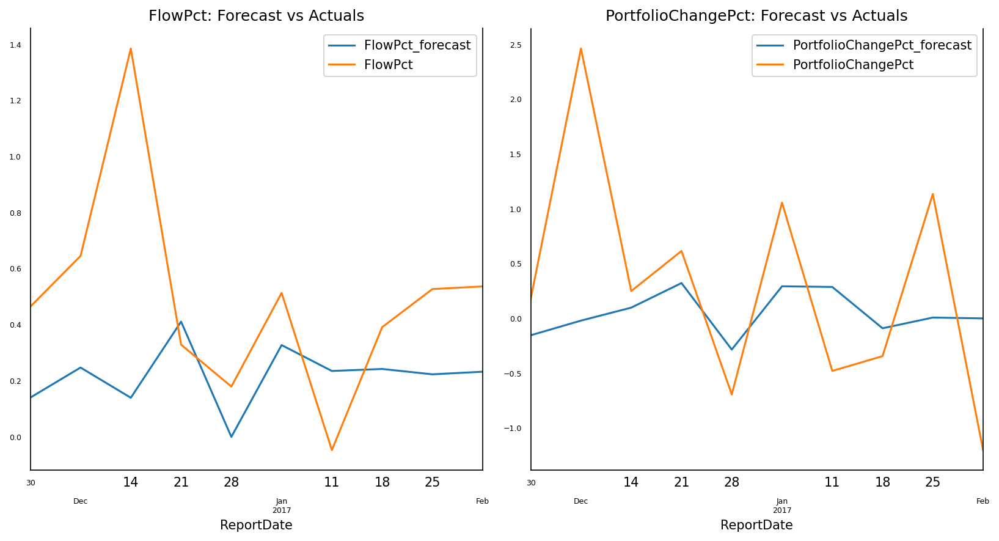

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcv_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.4667
corr :  -0.0945

Forecast Accuracy of: PortfolioPct
rmse :  1.0246
corr :  0.2125


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,1
2016-12-14,1,-1,-1,1
2016-12-21,-1,1,1,1
2016-12-28,-1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,0,0
2017-01-18,1,1,0,-1
2017-01-25,1,1,0,0


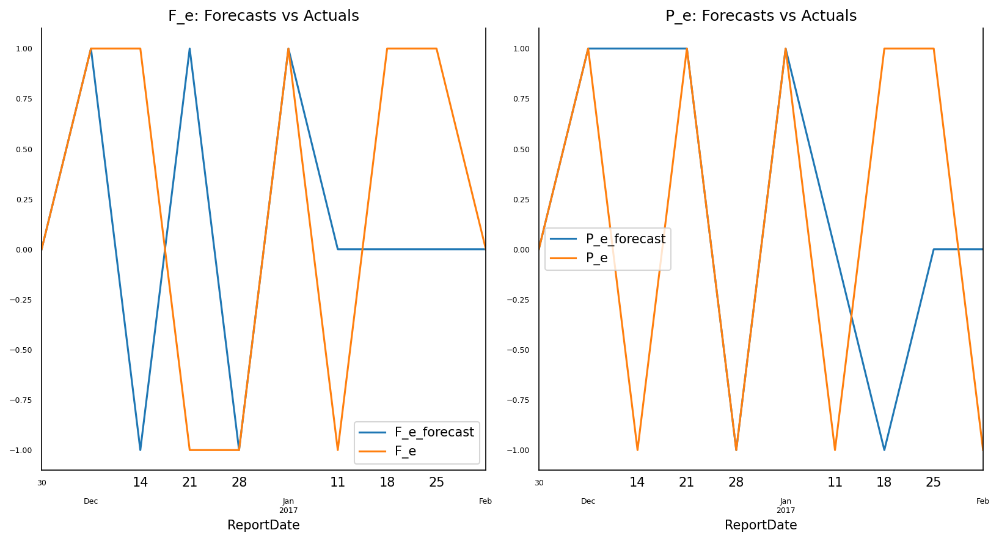

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.5
The accuracy score for PortfolioChangePct is 0.5


## mcb, Mid Capital Blend

In [ ]:
clip(mcb_model1, 0.01, 0.99)

Before cliping:
min   -6.3626
max    6.3364
Name: FlowPct, dtype: float64
min   -17.6734
max    12.6040
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -4.413346
max    4.735288
Name: FlowPct, dtype: float64
min   -6.818028
max    6.205422
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(mcb_model1, variables = mcb_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0003
PortfolioChangePct_y,0.0038,1.0000


In [ ]:
adf_test(mcb_model1)

Statistics analysis of FlowPct

Statistic Test: -5.801837759360699
p-value: 4.611681034097057e-07
 => P-Value = 4.611681034097057e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.23856410626371
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcb_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(mcb_model1)

Durbin Watson Statistic:
FlowPct : 2.01
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.1370,-0.4279,0.306739,0.131135
2016-12-07,1.2066,2.8373,0.365503,-0.071975
2016-12-14,2.0767,-0.7521,0.183099,0.017587
2016-12-21,-1.0446,0.7168,0.082681,0.124099
2016-12-28,0.1877,-0.9918,-0.116934,-0.301012
2017-01-04,0.8726,1.9829,0.014924,0.403131
2017-01-11,1.2192,-0.3935,0.164095,0.548473
2017-01-18,0.0371,-0.2077,-0.033949,0.082748
2017-01-25,0.5834,1.7038,0.268919,0.039211


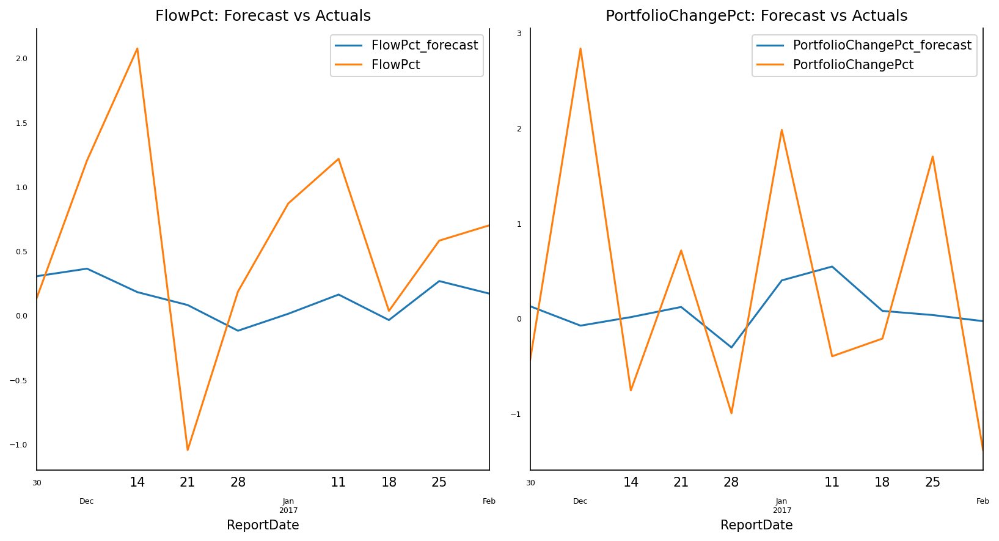

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcb_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.89
corr :  0.344

Forecast Accuracy of: PortfolioPct
rmse :  1.3515
corr :  0.1598


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,0,-1
2016-12-14,1,-1,-1,0
2016-12-21,-1,1,-1,1
2016-12-28,1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,1,-1,1,1
2017-01-18,-1,1,-1,-1
2017-01-25,1,1,1,0


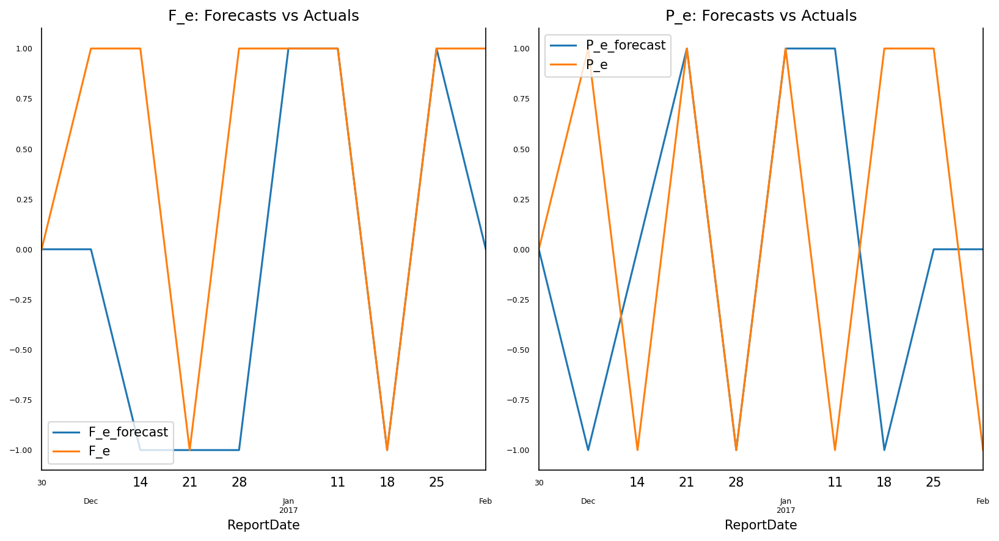

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.6
The accuracy score for PortfolioChangePct is 0.4


## mcg, Mid Capital Growth

In [ ]:
clip(mcg_model1, 0.01, 0.99)

Before cliping:
min   -6.9194
max    7.6319
Name: FlowPct, dtype: float64
min   -17.5816
max    12.7949
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -3.035652
max    3.350528
Name: FlowPct, dtype: float64
min   -6.960820
max    6.166906
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(mcg_model1, variables = mcg_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0388,1.0


In [ ]:
adf_test(mcg_model1)

Statistics analysis of FlowPct

Statistic Test: -10.882797215661217
p-value: 1.2821021933214342e-19
 => P-Value = 1.2821021933214342e-19. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.319180294231515
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcg_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(mcg_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.5917,-0.9071,0.433066,0.205941
2016-12-07,0.4550,2.0010,0.204979,0.052328
2016-12-14,1.9225,-0.4242,0.062240,0.147811
2016-12-21,-1.4160,0.6445,0.073132,0.327157
2016-12-28,-0.0055,-0.9174,0.015743,-0.252792
2017-01-04,-0.2204,1.7197,0.103535,0.487554
2017-01-11,-0.1529,0.1543,0.145662,0.587740
2017-01-18,0.2154,0.0753,0.258552,0.423537
2017-01-25,-0.0785,1.6550,0.222662,0.244233


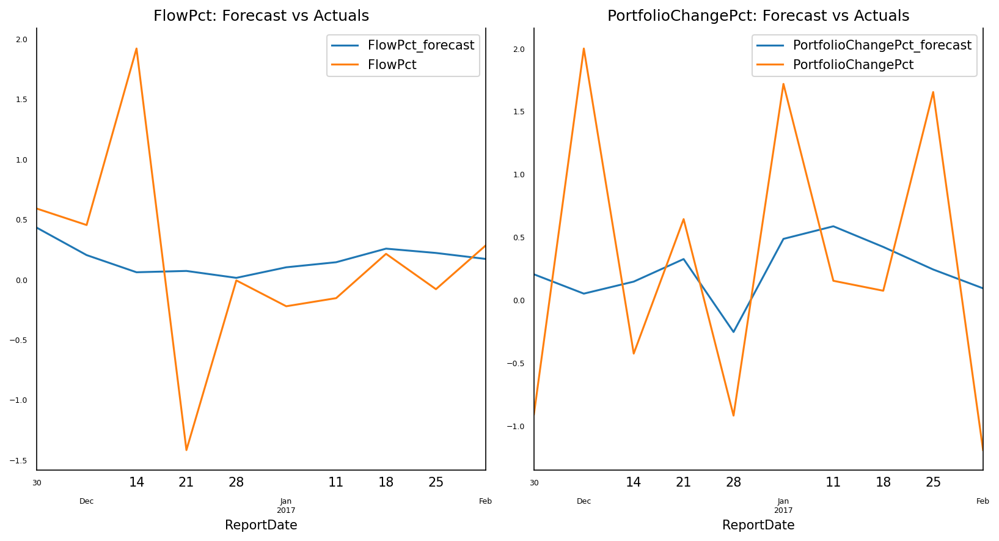

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcg_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.7788
corr :  0.1528

Forecast Accuracy of: PortfolioPct
rmse :  1.0666
corr :  0.3472


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,-1
2016-12-14,1,-1,-1,0
2016-12-21,-1,1,0,1
2016-12-28,1,-1,0,-1
2017-01-04,-1,1,0,1
2017-01-11,0,-1,0,1
2017-01-18,1,0,1,-1
2017-01-25,-1,1,0,-1


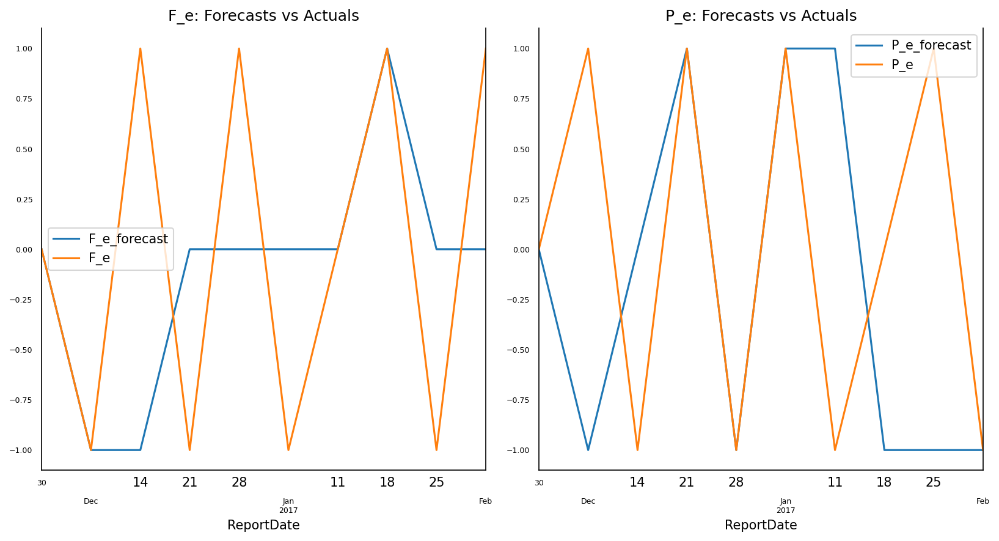

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.5


## mcv, Mid Capital Value

In [ ]:
clip(mcv_model1, 0.01, 0.99)

Before cliping:
min   -6.1319
max    5.3792
Name: FlowPct, dtype: float64
min   -17.3174
max    12.6578
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -3.329850
max    2.873358
Name: FlowPct, dtype: float64
min   -7.495636
max    6.508620
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(mcv_model1, variables = mcv_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.1269,1.0


In [ ]:
adf_test(mcv_model1)

Statistics analysis of FlowPct

Statistic Test: -9.191303422992345
p-value: 2.1197099453951664e-15
 => P-Value = 2.1197099453951664e-15. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.21928346522833
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcv_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(mcv_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.7027,-0.0304,0.507879,-0.173689
2016-12-07,1.0196,3.1566,0.416913,-0.217823
2016-12-14,2.4524,-0.9575,0.362138,0.202442
2016-12-21,-0.7162,0.6557,0.288555,0.675977
2016-12-28,0.1701,-1.0405,0.267081,-0.474750
2017-01-04,1.3619,2.0331,0.219711,0.355053
2017-01-11,1.1708,-0.6669,0.322688,0.596531
2017-01-18,0.4787,-0.2160,0.155395,-0.105628
2017-01-25,-0.0081,1.5660,0.145268,-0.050748


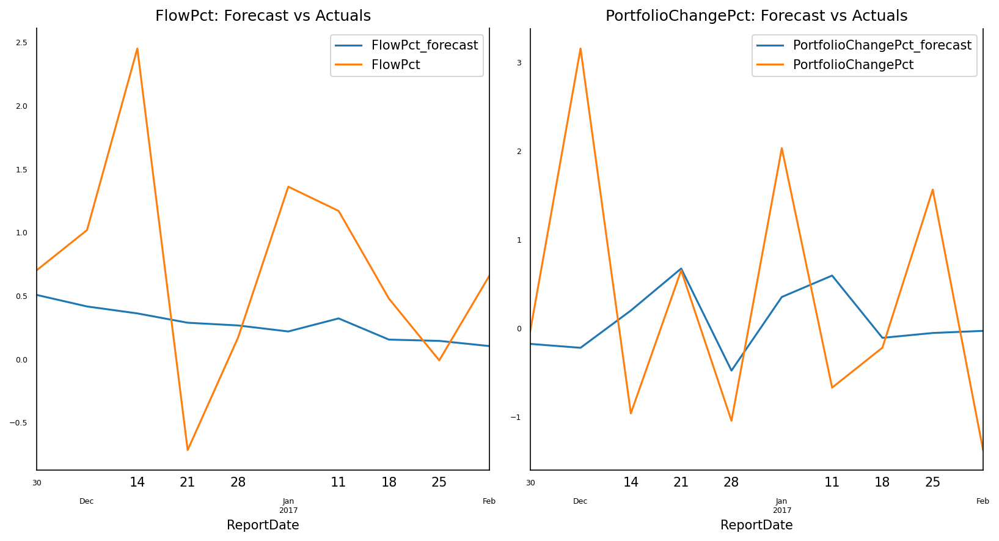

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcv_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.9084
corr :  0.2955

Forecast Accuracy of: PortfolioPct
rmse :  1.4804
corr :  0.0242


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,0,0
2016-12-14,1,-1,0,1
2016-12-21,-1,1,0,1
2016-12-28,1,-1,0,-1
2017-01-04,1,1,0,1
2017-01-11,-1,-1,1,1
2017-01-18,-1,1,-1,-1
2017-01-25,-1,1,0,0


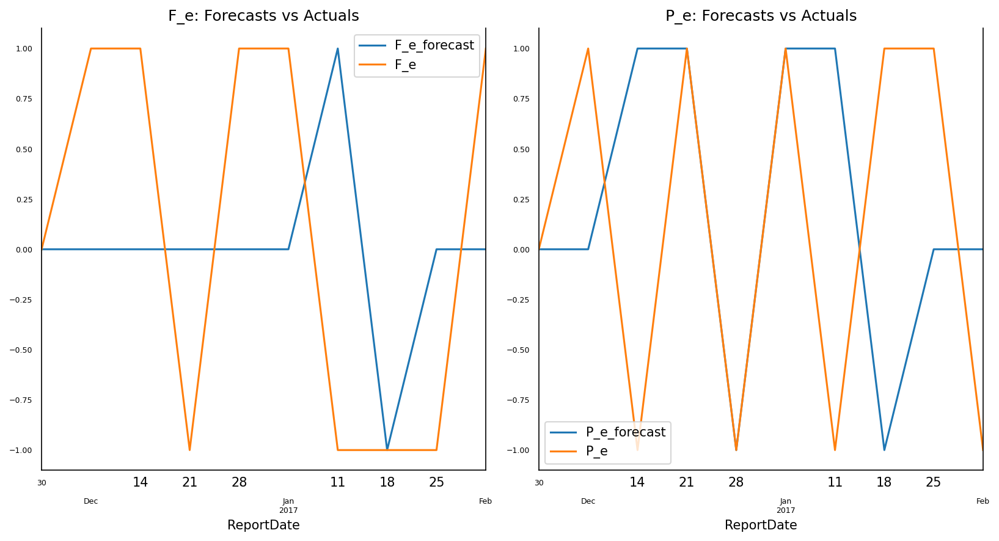

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.2
The accuracy score for PortfolioChangePct is 0.4


## rea, Real Estate

In [ ]:
clip(rea_model1, 0.01, 0.99)

Before cliping:
min   -33.9144
max    53.0500
Name: FlowPct, dtype: float64
min   -21.5066
max    24.0975
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -8.827358
max    9.838448
Name: FlowPct, dtype: float64
min   -12.809324
max     9.678944
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(rea_model1, variables = rea_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.678
PortfolioChangePct_y,0.0236,1.000


In [ ]:
adf_test(rea_model1)

Statistics analysis of FlowPct

Statistic Test: -6.457869606697965
p-value: 1.4680226080339415e-08
 => P-Value = 1.4680226080339415e-08. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -13.510281904946828
p-value: 2.862198858493724e-25
 => P-Value = 2.862198858493724e-25. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(rea_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(rea_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.4447,0.5676,1.478406,0.132386
2016-12-07,0.1799,2.9145,0.294179,0.371274
2016-12-14,-1.6858,-1.0934,-0.106065,1.067609
2016-12-21,0.6839,0.6073,0.383828,-0.167557
2016-12-28,-1.0660,-0.3434,0.736347,0.099277
2017-01-04,1.1081,4.2708,0.320780,0.632060
2017-01-11,0.8012,-2.0144,0.147971,0.501465
2017-01-18,0.2537,1.2074,0.362582,0.230788
2017-01-25,0.0360,-0.1190,0.203716,0.037203


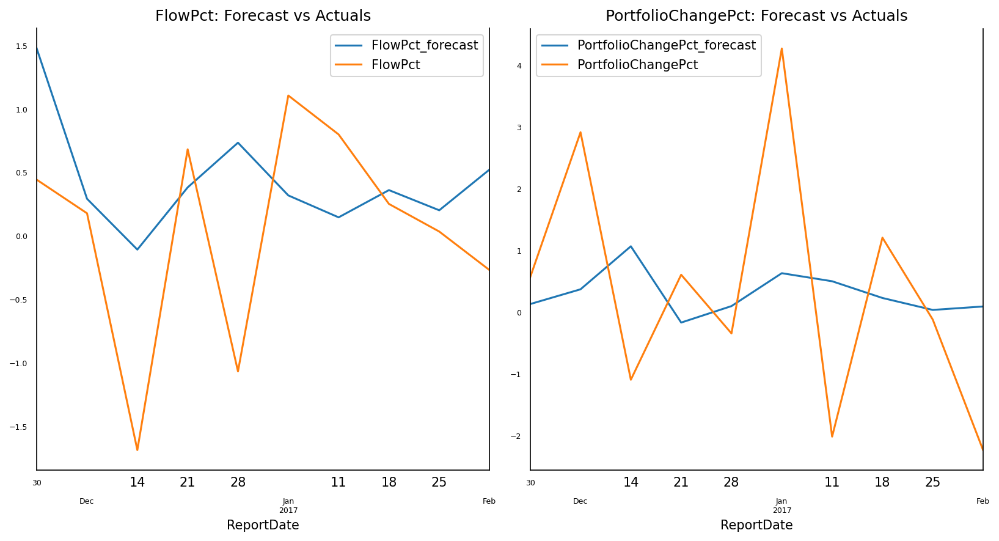

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    rea_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.929
corr :  0.1768

Forecast Accuracy of: PortfolioPct
rmse :  1.9514
corr :  0.0731


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,1
2016-12-14,-1,-1,-1,1
2016-12-21,1,1,1,-1
2016-12-28,-1,-1,1,1
2017-01-04,1,1,-1,1
2017-01-11,-1,-1,-1,-1
2017-01-18,-1,1,1,-1
2017-01-25,-1,-1,-1,-1


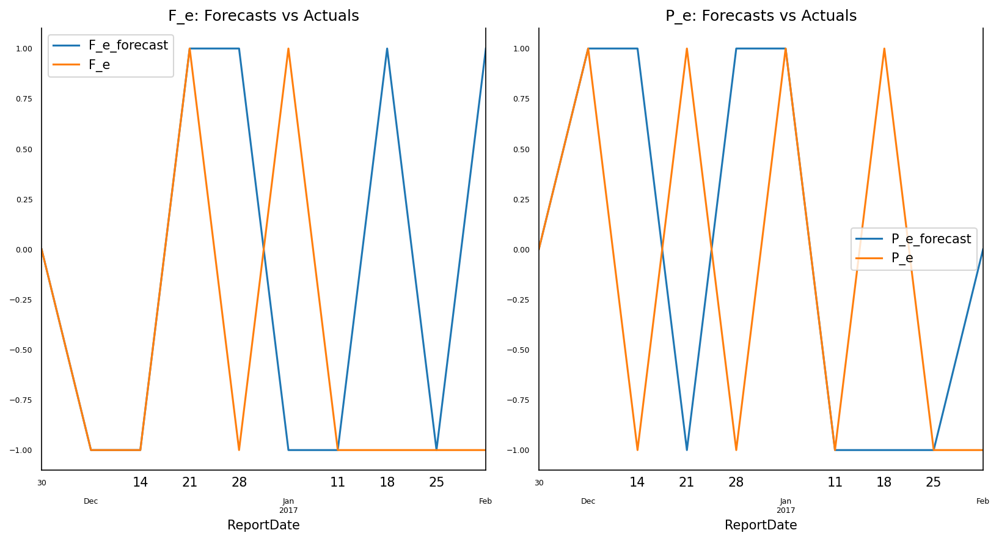

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.6
The accuracy score for PortfolioChangePct is 0.5


## scb, Small Capital Blend

In [ ]:
clip(scb_model1, 0.01, 0.99)

Before cliping:
min    -49.1668
max    162.4913
Name: FlowPct, dtype: float64
min   -18.3501
max    13.8065
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -16.068838
max    18.435456
Name: FlowPct, dtype: float64
min   -7.686616
max    7.035530
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(scb_model1, variables = scb_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0426
PortfolioChangePct_y,0.0558,1.0000


In [ ]:
adf_test(scb_model1)

Statistics analysis of FlowPct

Statistic Test: -8.410255614861441
p-value: 2.113258381429984e-13
 => P-Value = 2.113258381429984e-13. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.64074221327638
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scb_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(scb_model1)

Durbin Watson Statistic:
FlowPct : 1.95
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.9577,-1.1203,-2.657249,-0.071068
2016-12-07,0.6744,3.3767,-0.738326,-0.215061
2016-12-14,1.6434,-0.5912,0.532911,-0.353542
2016-12-21,-0.1434,1.3806,1.105973,-0.067354
2016-12-28,1.2066,-1.0314,0.591487,-0.512367
2017-01-04,1.0046,2.1032,-0.567987,0.389432
2017-01-11,0.7194,-1.1753,-1.150265,0.543543
2017-01-18,0.1087,-1.0495,-0.222877,-0.150073
2017-01-25,-0.3086,1.7592,0.320544,-0.255264


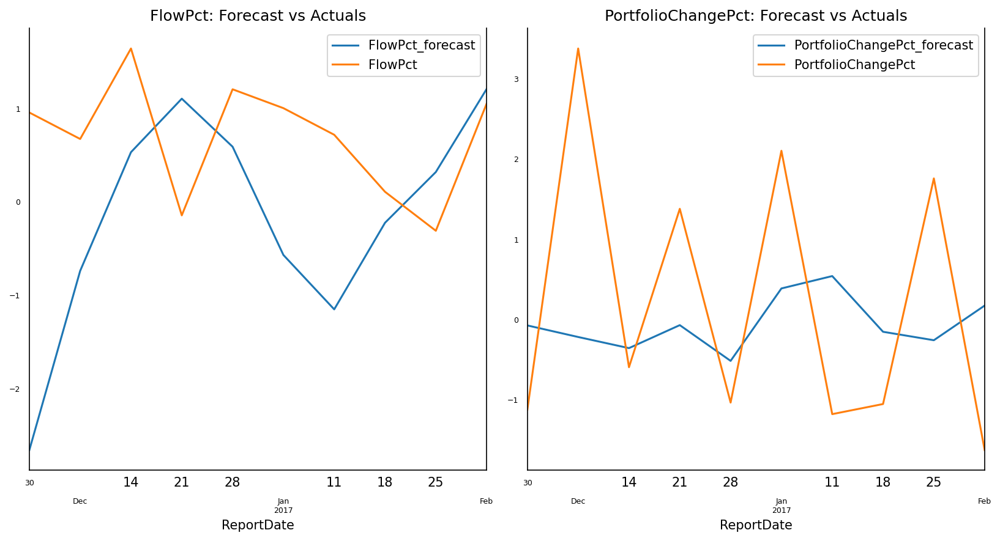

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scb_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.5727
corr :  -0.1163

Forecast Accuracy of: PortfolioPct
rmse :  1.7441
corr :  -0.056


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,1,-1
2016-12-14,1,-1,1,-1
2016-12-21,-1,1,1,1
2016-12-28,1,-1,-1,-1
2017-01-04,-1,1,-1,1
2017-01-11,-1,-1,-1,1
2017-01-18,-1,1,1,-1
2017-01-25,-1,1,1,-1


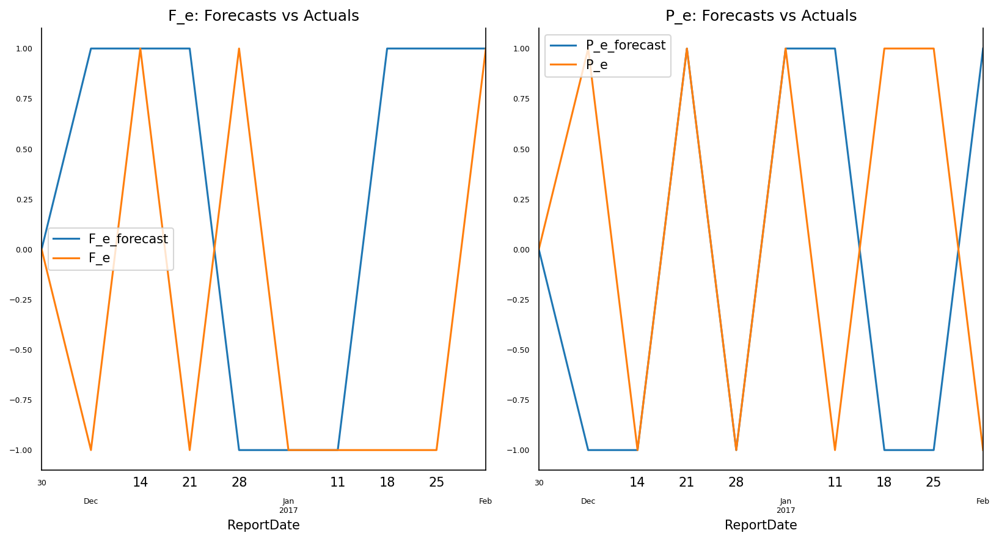

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.5
The accuracy score for PortfolioChangePct is 0.5


## scg, Small Capital Growth

In [ ]:
clip(scg_model1, 0.01, 0.99)

Before cliping:
min   -7.3614
max    9.5345
Name: FlowPct, dtype: float64
min   -18.5484
max    12.7790
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -4.764716
max    5.750318
Name: FlowPct, dtype: float64
min   -7.563574
max    6.561288
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(scg_model1, variables = scg_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0083,1.0


In [ ]:
adf_test(scg_model1)

Statistics analysis of FlowPct

Statistic Test: -27.215550923602745
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.586117960007265
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scg_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(scg_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.4546,-1.3768,0.625693,-0.249120
2016-12-07,1.9642,2.5406,0.521595,-0.217385
2016-12-14,1.9221,-0.5916,0.358515,-0.391827
2016-12-21,-0.3986,1.0062,0.141099,0.155864
2016-12-28,-0.5296,-1.0008,0.190492,-0.402687
2017-01-04,0.4129,2.0604,0.382854,0.628467
2017-01-11,1.2242,-0.6219,0.229325,0.795176
2017-01-18,0.4114,-0.6889,0.130195,0.126783
2017-01-25,1.0842,1.7091,0.151173,0.004175


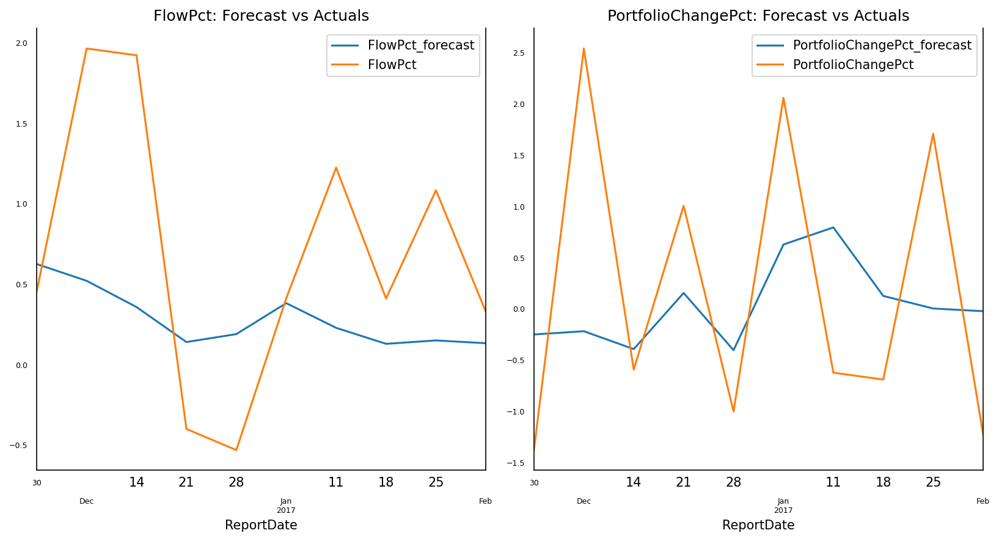

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scg_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.8569
corr :  0.4176

Forecast Accuracy of: PortfolioPct
rmse :  1.3808
corr :  0.2311


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,0
2016-12-14,0,-1,-1,-1
2016-12-21,-1,1,-1,1
2016-12-28,-1,-1,0,-1
2017-01-04,1,1,1,1
2017-01-11,1,-1,-1,1
2017-01-18,-1,0,0,-1
2017-01-25,1,1,0,-1


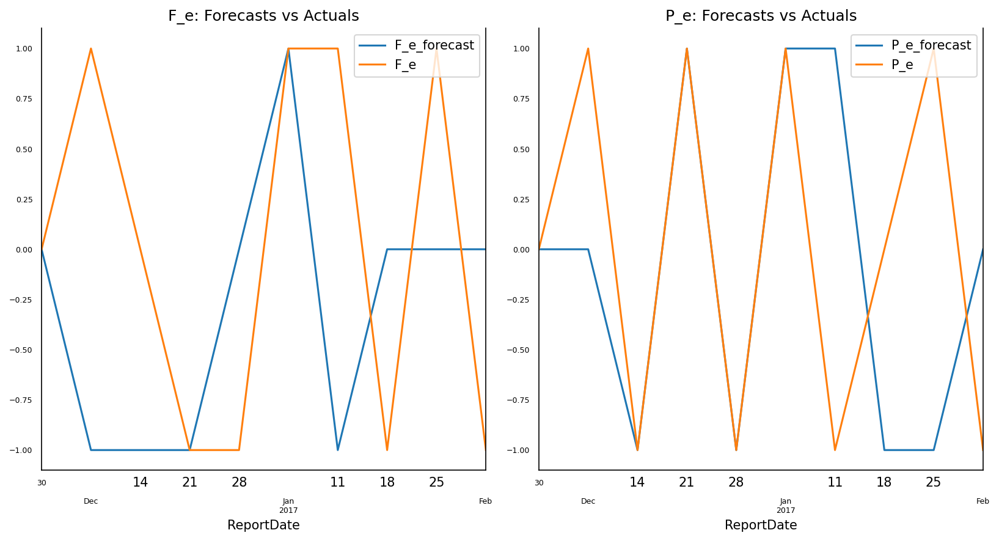

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.5


## scv, Small Capital Value

In [ ]:
clip(scv_model1, 0.01, 0.99)

Before cliping:
min   -7.2675
max    9.5751
Name: FlowPct, dtype: float64
min   -17.9685
max    15.4937
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.102546
max    5.799026
Name: FlowPct, dtype: float64
min   -7.741234
max    6.745820
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(scv_model1, variables = scv_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0003
PortfolioChangePct_y,0.0706,1.0000


In [ ]:
adf_test(scv_model1)

Statistics analysis of FlowPct

Statistic Test: -26.82851730692473
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.34717589399685
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scv_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(scv_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.8530,-0.5056,0.352928,0.148503
2016-12-07,1.7730,3.8110,0.446666,-0.110141
2016-12-14,3.7147,-0.6743,0.313285,-0.127184
2016-12-21,-0.9542,1.5402,0.237421,0.452290
2016-12-28,0.2089,-1.0252,0.107006,-0.669984
2017-01-04,0.2019,2.0966,0.243588,-0.038159
2017-01-11,2.0099,-1.4658,0.520998,0.411397
2017-01-18,1.3362,-1.0970,0.381760,-0.492250
2017-01-25,1.1595,1.6748,0.063984,-0.579551


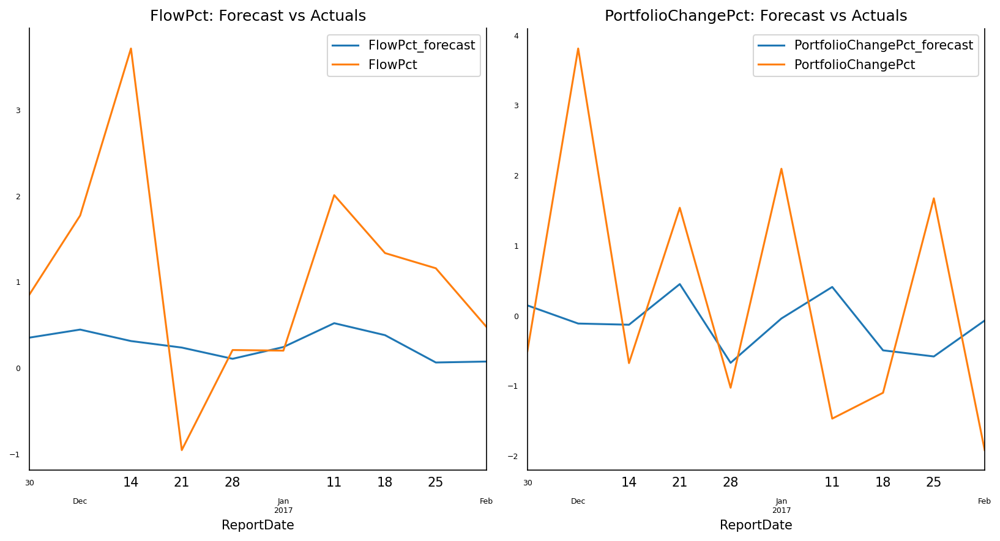

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scv_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.3964
corr :  0.4518

Forecast Accuracy of: PortfolioPct
rmse :  1.8534
corr :  0.0383


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,0,-1
2016-12-14,1,-1,-1,0
2016-12-21,-1,1,0,1
2016-12-28,1,-1,-1,-1
2017-01-04,0,1,1,1
2017-01-11,1,-1,1,1
2017-01-18,-1,1,-1,-1
2017-01-25,-1,1,-1,0


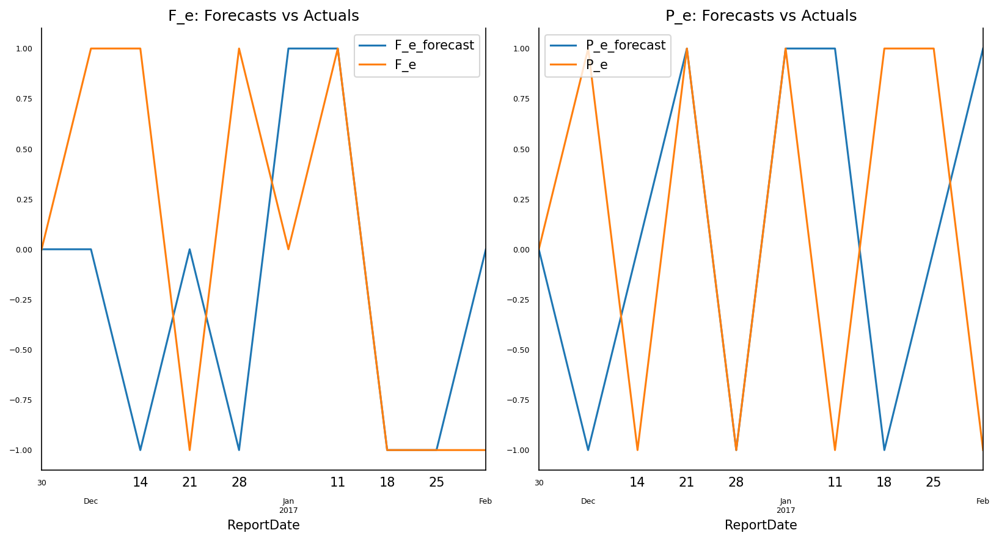

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.4


## tel, Telecom

In [ ]:
clip(tel_model1, 0.01, 0.99)

Before cliping:
min   -15.2367
max    18.8269
Name: FlowPct, dtype: float64
min   -17.4834
max    17.5016
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -7.374104
max    8.995028
Name: FlowPct, dtype: float64
min   -6.592470
max    6.426036
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(tel_model1, variables = tel_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.3124,1.0


In [ ]:
adf_test(tel_model1)

Statistics analysis of FlowPct

Statistic Test: -10.55142321745212
p-value: 8.157290356125866e-19
 => P-Value = 8.157290356125866e-19. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.39924821308145
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(tel_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(tel_model1)

Durbin Watson Statistic:
FlowPct : 1.97
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.6675,-0.8973,0.349507,0.092294
2016-12-07,1.9919,4.6463,0.047119,-0.529684
2016-12-14,0.5663,-0.5926,0.802701,0.646970
2016-12-21,1.4593,2.5637,0.348506,0.317573
2016-12-28,2.0766,0.8746,0.498412,-0.915357
2017-01-04,7.9112,3.9538,0.099895,0.302406
2017-01-11,4.4253,-2.8787,0.012668,0.277552
2017-01-18,0.9345,-0.3992,-0.123118,0.055861
2017-01-25,-2.6467,-0.4705,-0.070649,0.366575


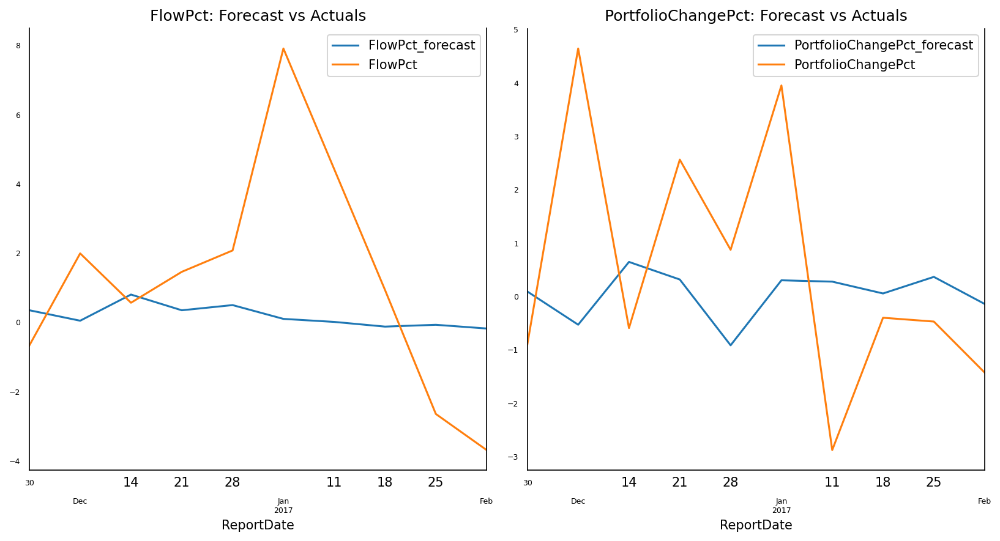

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tel_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  3.3041
corr :  0.1307

Forecast Accuracy of: PortfolioPct
rmse :  2.5182
corr :  -0.2707


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,-1
2016-12-14,-1,-1,1,1
2016-12-21,1,1,-1,-1
2016-12-28,1,-1,1,-1
2017-01-04,1,1,-1,1
2017-01-11,-1,-1,0,0
2017-01-18,-1,1,-1,-1
2017-01-25,-1,0,0,1


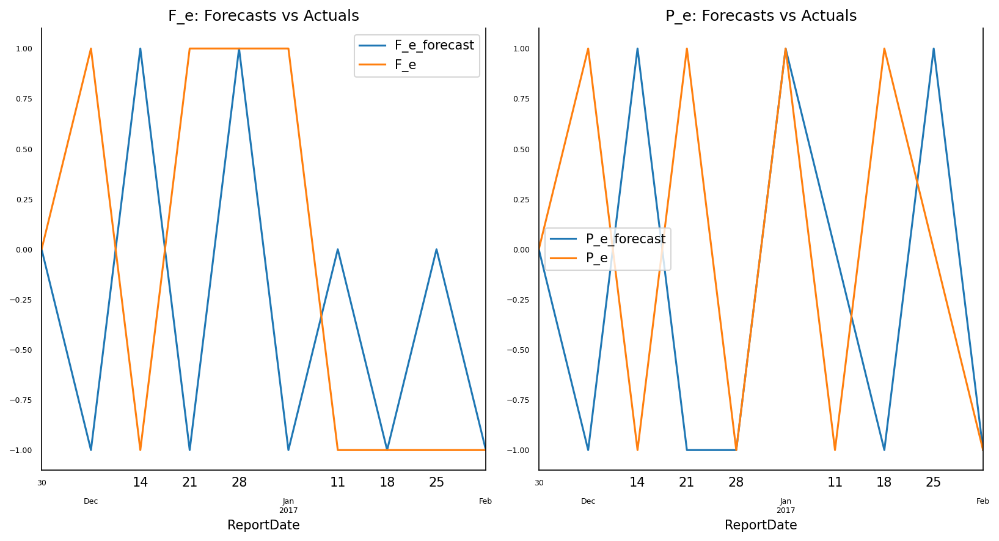

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.4


## uti, Utilities

In [ ]:
clip(uti_model1, 0.01, 0.99)

Before cliping:
min   -15.1506
max    20.5602
Name: FlowPct, dtype: float64
min   -13.8072
max    10.6158
Name: PortfolioChangePct, dtype: float64

After cliping:
min    -8.287778
max    11.515092
Name: FlowPct, dtype: float64
min   -6.676102
max    5.617168
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(uti_model1, variables = uti_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0008
PortfolioChangePct_y,0.7328,1.0000


In [ ]:
adf_test(uti_model1)

Statistics analysis of FlowPct

Statistic Test: -22.68816338797214
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -18.75558353221203
p-value: 2.0270350514297686e-30
 => P-Value = 2.0270350514297686e-30. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(uti_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(uti_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.0501,0.1720,-0.713804,0.060912
2016-12-07,-1.2196,1.5076,0.646124,-0.162286
2016-12-14,-0.4208,0.9859,0.549300,0.127255
2016-12-21,1.0607,1.3206,0.225532,0.292255
2016-12-28,-0.7130,-0.5018,0.205844,0.253306
2017-01-04,0.2600,0.9664,0.245515,0.332103
2017-01-11,-0.6172,-0.2831,0.462971,-0.067288
2017-01-18,-1.2142,0.8966,0.406570,0.157499
2017-01-25,-1.9929,-1.1167,0.256253,0.156648


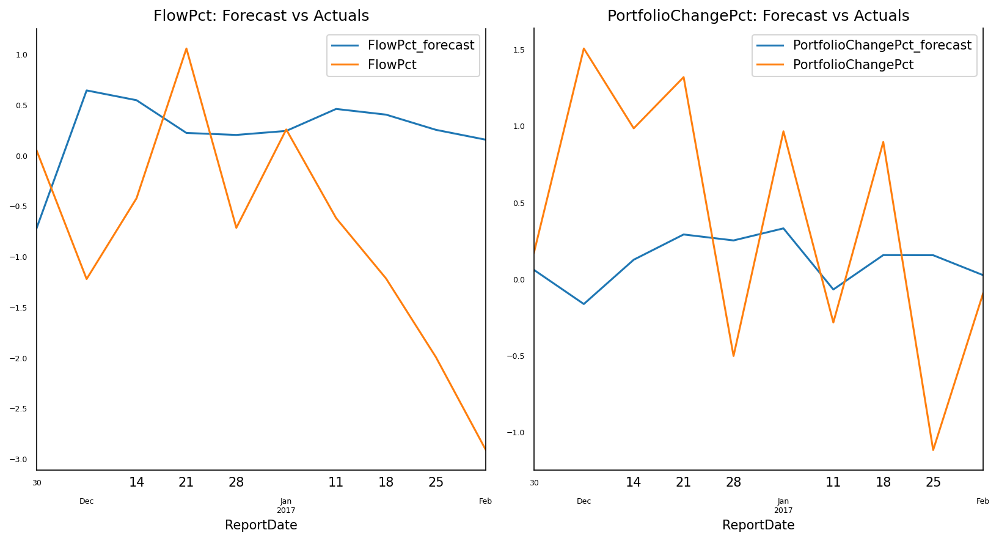

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    uti_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.5755
corr :  -0.1994

Forecast Accuracy of: PortfolioPct
rmse :  0.883
corr :  0.0002


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_e"] = 0
direc["P_e"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_e,P_e,F_e_forecast,P_e_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,1,-1
2016-12-14,1,-1,0,1
2016-12-21,1,1,-1,1
2016-12-28,-1,-1,0,0
2017-01-04,1,1,0,0
2017-01-11,-1,-1,1,-1
2017-01-18,-1,1,0,1
2017-01-25,-1,-1,-1,0


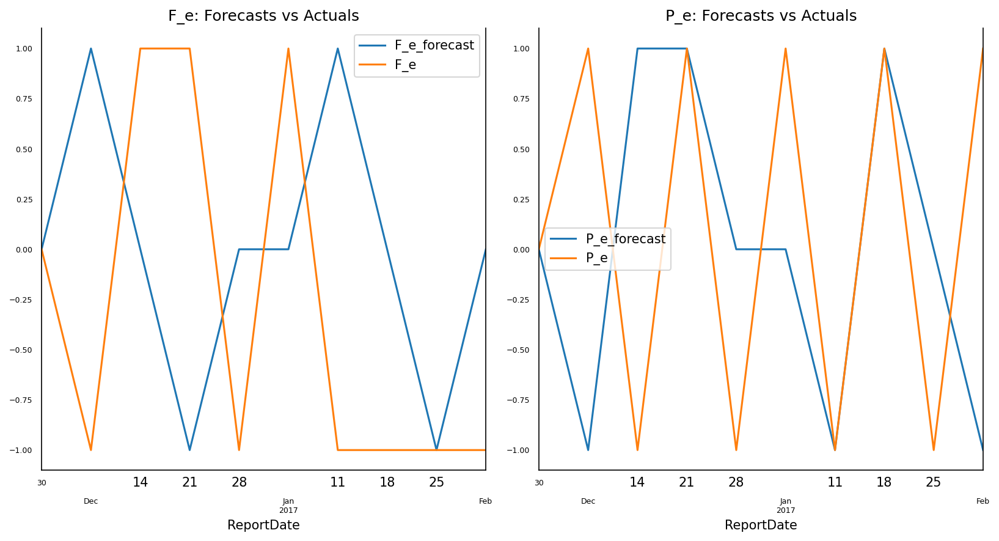

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.2
The accuracy score for PortfolioChangePct is 0.4


# VAR mode1 1-2: Within one market - Inst
%Portfolio_inst(t) = a + b1* %Flow_inst(t-1) + b2* %Portfolio_inst(t-1)

## Functions

### Preprocessing dataset

In [ ]:
# Spliting each sector by names
inst = preprocessing(inst)
grouped = inst.groupby(inst['AssetClass'])

com_model1 = grouped.get_group('Commodities/Materials')
con_model1 = grouped.get_group('Consumer Goods')
ene_model1 = grouped.get_group('Energy')
fin_model1 = grouped.get_group('Financials')
hea_model1 = grouped.get_group('Health Care/Biotech')
ind_model1 = grouped.get_group('Industrials')
lcb_model1 = grouped.get_group('Large Cap Blend')
lcg_model1 = grouped.get_group('Large Cap Growth')
lcv_model1 = grouped.get_group('Large Cap Value')
mcb_model1 = grouped.get_group('Mid Cap Blend')
mcg_model1 = grouped.get_group('Mid Cap Growth')
mcv_model1 = grouped.get_group('Mid Cap Value')
rea_model1 = grouped.get_group('Real Estate')
scb_model1 = grouped.get_group('Small Cap Blend')
scg_model1 = grouped.get_group('Small Cap Growth')
scv_model1 = grouped.get_group('Small Cap Value')
tec_model1 = grouped.get_group('Technology')
tel_model1 = grouped.get_group('Telecom')
uti_model1 = grouped.get_group('Utilities')

In [ ]:
# drop the columns that we will not need in the following steps of model construction
com_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
con_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
ene_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
fin_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
hea_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
ind_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
lcb_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
lcg_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
lcv_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
mcb_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
mcg_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
mcv_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
rea_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
scb_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
scg_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
scv_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
tec_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
tel_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)
uti_model1.drop(['AssetClass','year','Flow','AssetsEnd'],axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### Forecast Accuracy

In [ ]:
# evaluate the direction of forecasts
from sklearn.metrics import accuracy_score
def direc_accuracy(direc):
  print(f"The accuracy score for FlowPct is", accuracy_score(direc["F_i"], direc["F_i_forecast"]))
  print(f"The accuracy score for PortfolioChangePct is", accuracy_score(direc["P_i"], direc["P_i_forecast"]))
  # print(f"The accuracy score for FlowPct_e is", accuracy_score(direc["F_e"], direc["F_e_forecast"]))
  # print(f"The accuracy score for PortfolioChangePct_e is", accuracy_score(direc["P_e"], direc["P_e_forecast"]))

### change_binary()
To better understanding the directional patterns of the forecasts, we change actual values to binary number to detect direction.

In [ ]:
# if FlowPct_i(t) is 0.1 lower than FlowPct_i(t-1): convert value to -1
# elif FlowPct_i(t) is 0.1 higher than FlowPct_i(t-1): convert value to 1
# else: 0

def change_binary(direc, test_len=9, threshold=0.1):
  for i in range(test_len):
    if direc["FlowPct"][i+1] < (direc["FlowPct"][i]-threshold):
      direc["F_i"][i+1] = -1
    elif direc["FlowPct"][i+1] > (direc["FlowPct"][i]+threshold):
      direc["F_i"][i+1] = 1
    else:
      direc["F_i"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct"][i+1] < (direc["PortfolioChangePct"][i]-threshold):
      direc["P_i"][i+1] = -1
    elif direc["PortfolioChangePct"][i+1] > (direc["PortfolioChangePct"][i]+threshold):
      direc["P_i"][i+1] = 1
    else:
      direc["P_i"][i+1] = 0

  # for i in range(test_len):
  #   if direc["FlowPct_e"][i+1] < (direc["FlowPct_e"][i]-threshold):
  #     direc["F_e"][i+1] = -1
  #   elif direc["FlowPct_e"][i+1] > (direc["FlowPct_e"][i]+threshold):
  #     direc["F_e"][i+1] = 1
  #   else:
  #     direc["F_e"][i+1] = 0

  # for i in range(test_len):
  #   if direc["PortfolioChangePct_e"][i+1] < (direc["PortfolioChangePct_e"][i]-threshold):
  #     direc["P_e"][i+1] = -1
  #   elif direc["PortfolioChangePct_e"][i+1] > (direc["PortfolioChangePct_e"][i]+threshold):
  #     direc["P_e"][i+1] = 1
  #   else:
  #     direc["P_e"][i+1] = 0 

  for i in range(test_len):
    if direc["FlowPct_forecast"][i+1] < (direc["FlowPct_forecast"][i]-threshold):
      direc["F_i_forecast"][i+1] = -1
    elif direc["FlowPct_forecast"][i+1] > (direc["FlowPct_forecast"][i]+threshold):
      direc["F_i_forecast"][i+1] = 1
    else:
      direc["F_i_forecast"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct_forecast"][i+1] < (direc["PortfolioChangePct_forecast"][i]-threshold):
      direc["P_i_forecast"][i+1] = -1
    elif direc["PortfolioChangePct_forecast"][i+1] > (direc["PortfolioChangePct_forecast"][i]+threshold):
      direc["P_i_forecast"][i+1] = 1
    else:
      direc["P_i_forecast"][i+1] = 0

  # for i in range(test_len):
  #   if direc["FlowPct_e_forecast"][i+1] < (direc["FlowPct_e_forecast"][i]-threshold):
  #     direc["F_e_forecast"][i+1] = -1
  #   elif direc["FlowPct_e_forecast"][i+1] > (direc["FlowPct_e_forecast"][i]+threshold):
  #     direc["F_e_forecast"][i+1] = 1
  #   else:
  #     direc["F_e_forecast"][i+1] = 0

  # for i in range(test_len):
  #   if direc["PortfolioChangePct_e_forecast"][i+1] < (direc["PortfolioChangePct_e_forecast"][i]-threshold):
  #     direc["P_e_forecast"][i+1] = -1
  #   elif direc["PortfolioChangePct_e_forecast"][i+1] > (direc["PortfolioChangePct_e_forecast"][i]+threshold):
  #     direc["P_e_forecast"][i+1] = 1
  #   else:
  #     direc["P_e_forecast"][i+1] = 0

## tec, Technology

In [ ]:
clip(tec_model1, 0.01, 0.99)

Before cliping:
min   -35.0908
max    10.7894
Name: FlowPct, dtype: float64
min   -15.1796
max    10.6722
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.337884
max    4.269766
Name: FlowPct, dtype: float64
min   -6.787892
max    5.943578
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(tec_model1, variables = tec_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.000,0.0
PortfolioChangePct_y,0.204,1.0


In [ ]:
adf_test(tec_model1)

Statistics analysis of FlowPct

Statistic Test: -11.43200431918033
p-value: 6.482434200379294e-21
 => P-Value = 6.482434200379294e-21. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.89452041378322
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(tec_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(tec_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.0941,-0.9769,0.550318,0.138558
2016-12-07,-0.3496,1.3108,0.376369,0.272404
2016-12-14,1.1237,1.0353,0.294165,0.130351
2016-12-21,0.3998,0.3329,0.569136,0.792020
2016-12-28,0.6732,-0.6553,0.191858,-0.316152
2017-01-04,0.2265,0.5442,0.378323,0.122087
2017-01-11,1.0584,1.8225,0.118309,0.340512
2017-01-18,-0.5184,-0.0803,0.280019,0.026762
2017-01-25,1.8389,2.5251,0.191086,0.335680


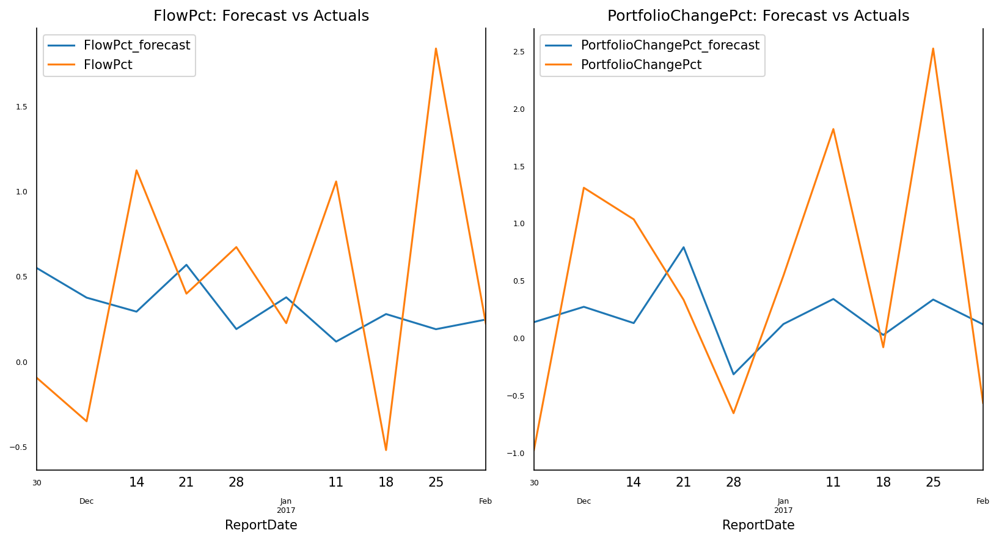

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tec_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.7843
corr :  -0.4963

Forecast Accuracy of: PortfolioPct
rmse :  1.0543
corr :  0.4329


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

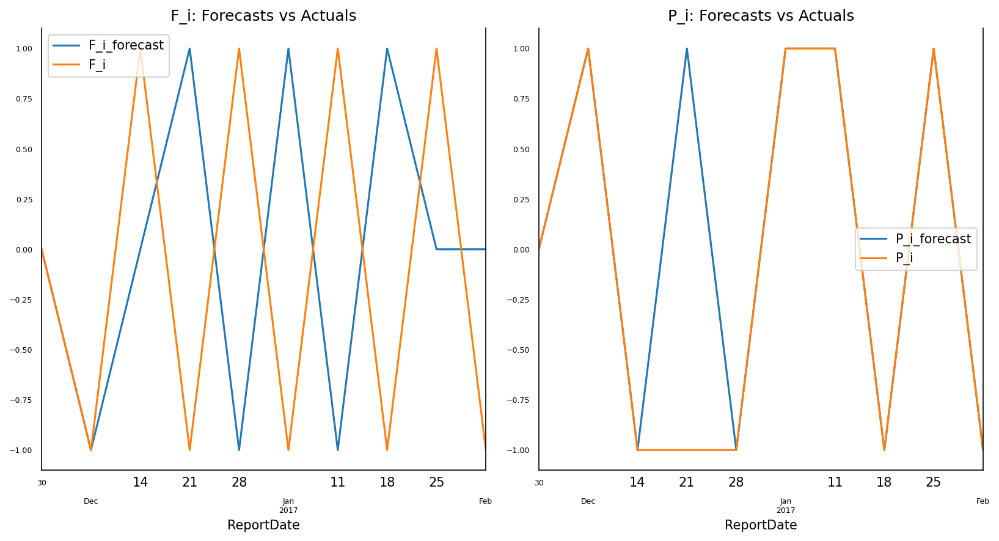

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.2
The accuracy score for PortfolioChangePct is 0.9


## com, Commodites

In [ ]:
clip(com_model1, 0.01, 0.99)

Before cliping:
min   -22.4984
max    24.1811
Name: FlowPct, dtype: float64
min   -16.2342
max    14.8178
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -11.973354
max    19.431848
Name: FlowPct, dtype: float64
min   -9.955080
max    9.102766
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(com_model1, variables = com_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0054
PortfolioChangePct_y,0.5488,1.0000


In [ ]:
adf_test(com_model1)

Statistics analysis of FlowPct

Statistic Test: -15.223749679745945
p-value: 5.439878753338274e-28
 => P-Value = 5.439878753338274e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -7.026436480227178
p-value: 6.346761469077402e-10
 => P-Value = 6.346761469077402e-10. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(com_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(com_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,1.8585,0.7350,-1.542369,0.266026
2016-12-07,3.1644,3.1410,0.462903,-1.063245
2016-12-14,2.8955,-1.8991,0.295870,0.660609
2016-12-21,0.4325,-0.3366,-0.162812,0.714322
2016-12-28,-1.2072,-0.6899,1.810025,0.105476
2017-01-04,-3.2109,2.0244,-0.203935,0.633978
2017-01-11,2.1498,0.6575,0.083674,0.119677
2017-01-18,-1.1418,0.0539,0.658436,0.727433
2017-01-25,3.1371,3.2144,0.161161,0.762230


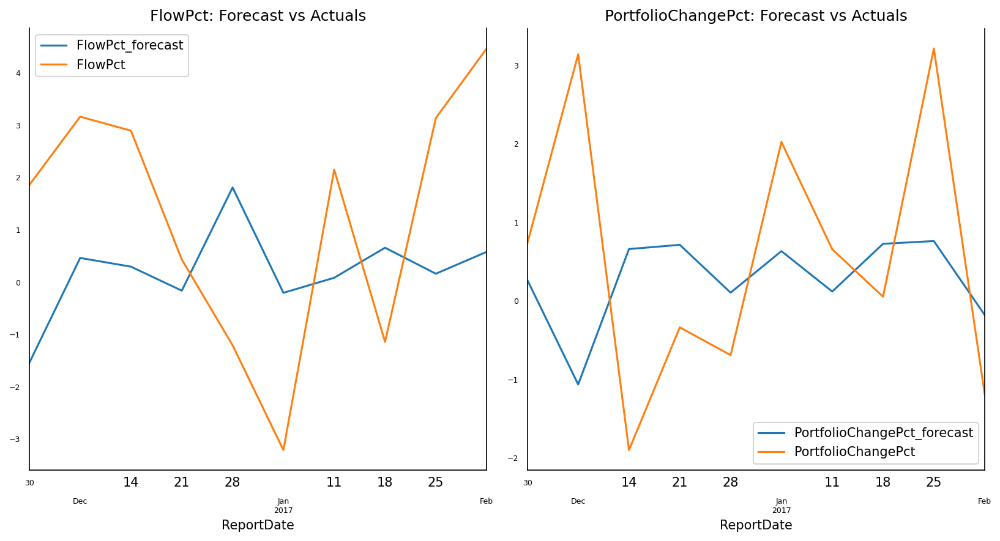

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    com_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  2.7497
corr :  -0.125

Forecast Accuracy of: PortfolioPct
rmse :  1.8944
corr :  -0.2455


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,-1
2016-12-14,-1,-1,-1,1
2016-12-21,-1,1,-1,0
2016-12-28,-1,-1,1,-1
2017-01-04,-1,1,-1,1
2017-01-11,1,-1,1,-1
2017-01-18,-1,-1,1,1
2017-01-25,1,1,-1,0


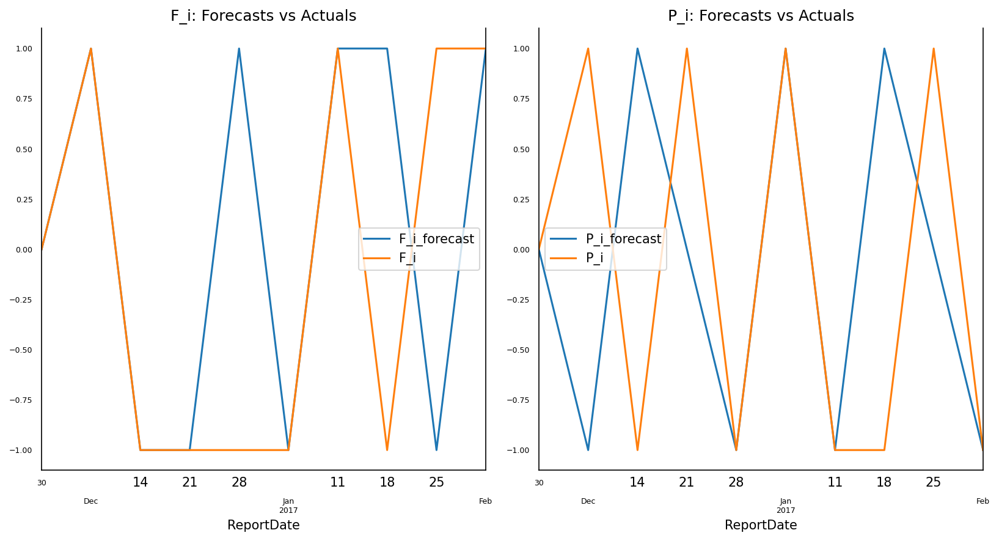

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.7
The accuracy score for PortfolioChangePct is 0.5


## con, Consumer Goods

In [ ]:
clip(con_model1, 0.01, 0.99)

Before cliping:
min   -18.1069
max    18.2202
Name: FlowPct, dtype: float64
min   -13.7816
max     9.5154
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -8.928864
max    9.347064
Name: FlowPct, dtype: float64
min   -6.080418
max    4.808350
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(con_model1, variables = tec_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0256
PortfolioChangePct_y,0.0758,1.0000


In [ ]:
adf_test(con_model1)

Statistics analysis of FlowPct

Statistic Test: -20.17970617091141
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -27.301373896861097
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(con_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(con_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-2.3960,-1.0488,0.644346,0.065626
2016-12-07,0.7215,2.5776,0.256063,0.239446
2016-12-14,-0.1786,-0.0974,0.110080,0.352673
2016-12-21,0.2317,0.2013,0.532966,0.311604
2016-12-28,-1.0204,-1.2451,-0.050331,-0.048119
2017-01-04,1.4222,0.8027,0.466369,0.334323
2017-01-11,1.2306,-0.1227,0.117893,0.246731
2017-01-18,-2.2893,0.8026,0.491606,0.177424
2017-01-25,-0.0724,1.3596,0.291840,0.214352


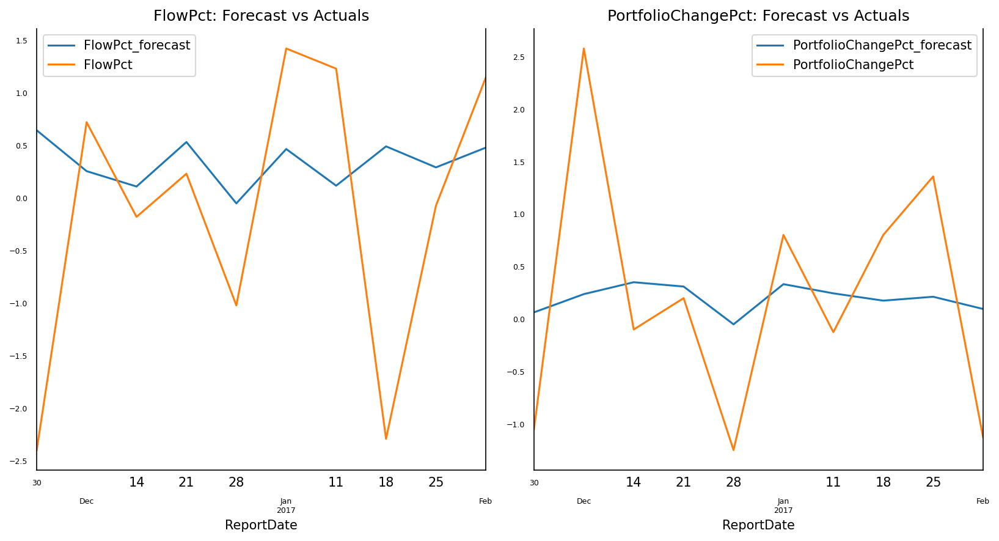

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    con_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.4505
corr :  -0.2106

Forecast Accuracy of: PortfolioPct
rmse :  1.0912
corr :  0.5542


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,1
2016-12-14,-1,-1,-1,1
2016-12-21,1,1,1,0
2016-12-28,-1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,-1,0
2017-01-18,-1,1,1,0
2017-01-25,1,1,-1,0


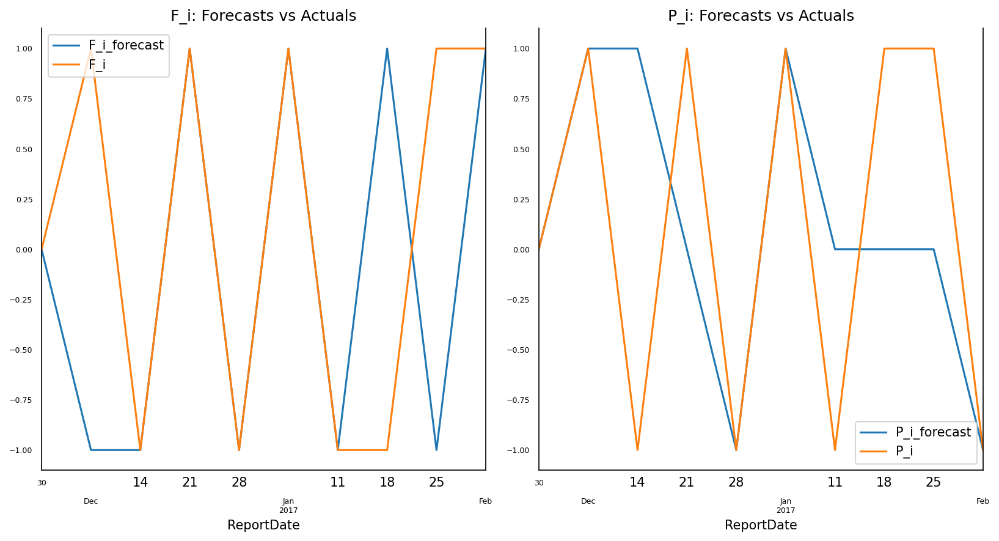

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.7
The accuracy score for PortfolioChangePct is 0.5


## ene, Energy

In [ ]:
clip(ene_model1, 0.01, 0.99)

Before cliping:
min   -12.4839
max    41.6693
Name: FlowPct, dtype: float64
min   -18.5562
max    13.3115
Name: PortfolioChangePct, dtype: float64

After cliping:
min    -8.402488
max    12.786628
Name: FlowPct, dtype: float64
min   -9.323514
max    9.084814
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(ene_model1, variables = ene_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0504
PortfolioChangePct_y,0.1343,1.0000


In [ ]:
adf_test(ene_model1)

Statistics analysis of FlowPct

Statistic Test: -11.507338739645444
p-value: 4.343616636562563e-21
 => P-Value = 4.343616636562563e-21. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -8.041118375418147
p-value: 1.8459243330592594e-12
 => P-Value = 1.8459243330592594e-12. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(ene_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(ene_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.5041,0.7055,0.152826,0.174253
2016-12-07,2.0172,1.0250,-0.017704,-0.460364
2016-12-14,0.8329,-0.2454,0.148888,0.256809
2016-12-21,0.9055,1.6620,0.821961,0.412141
2016-12-28,0.2067,0.2273,0.306615,-0.433647
2017-01-04,0.7093,0.9703,0.475476,0.427063
2017-01-11,-0.2905,-0.9163,-0.078792,0.192199
2017-01-18,0.4969,-0.1767,0.387213,0.341111
2017-01-25,0.5179,1.5542,0.404340,0.224328


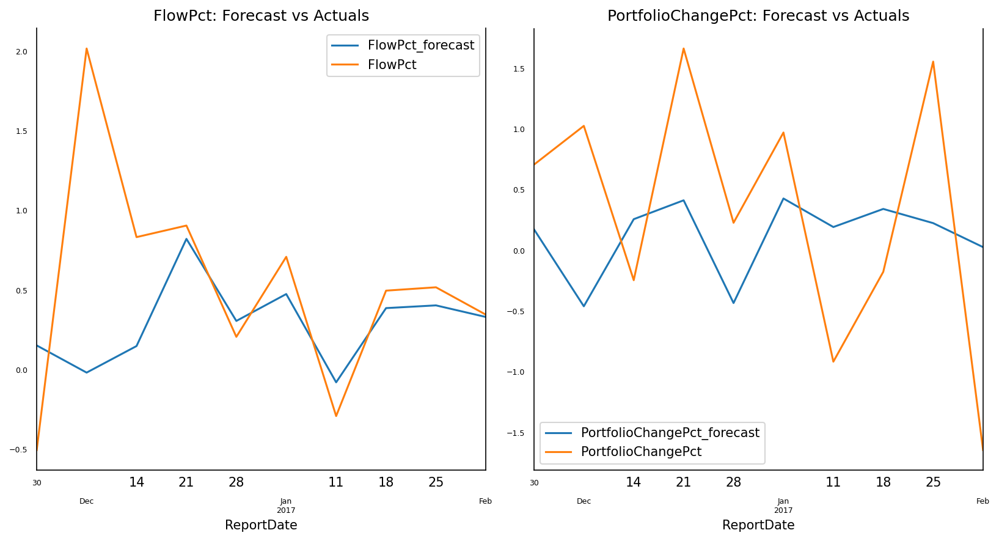

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ene_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.7199
corr :  0.0978

Forecast Accuracy of: PortfolioPct
rmse :  1.0532
corr :  0.0941


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,-1
2016-12-14,-1,-1,1,1
2016-12-21,0,1,1,1
2016-12-28,-1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,-1,-1
2017-01-18,1,1,1,1
2017-01-25,0,1,0,-1


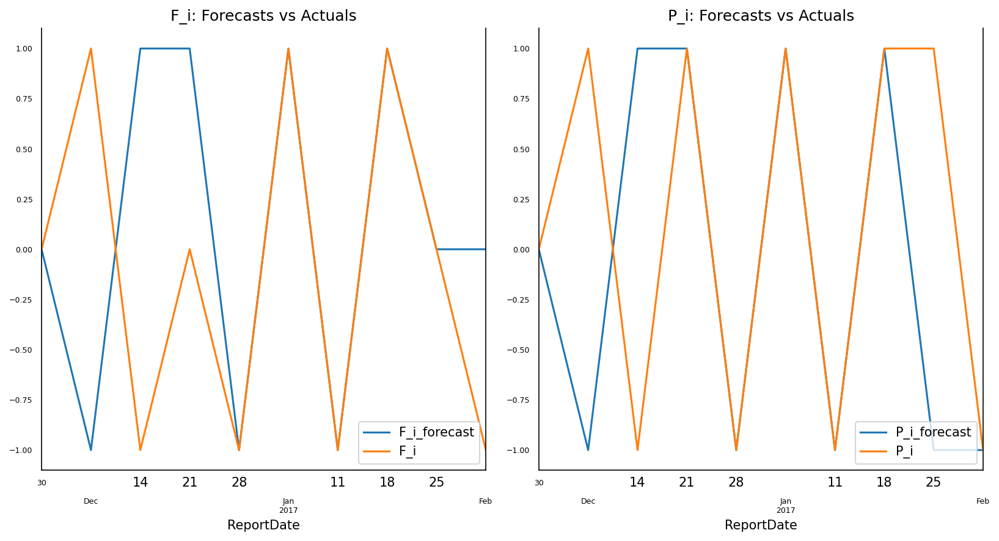

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.6
The accuracy score for PortfolioChangePct is 0.7


## fin, Financials

In [ ]:
clip(fin_model1, 0.01, 0.99)

Before cliping:
min   -33.8674
max    86.5919
Name: FlowPct, dtype: float64
min   -23.5056
max    25.9749
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -15.686952
max    30.030766
Name: FlowPct, dtype: float64
min   -13.116644
max    11.843258
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(fin_model1, variables = tec_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.2492,1.0


In [ ]:
adf_test(fin_model1)

Statistics analysis of FlowPct

Statistic Test: -5.280621622455963
p-value: 6.005112079610393e-06
 => P-Value = 6.005112079610393e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -28.996806391615095
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(fin_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(fin_model1)

Durbin Watson Statistic:
FlowPct : 1.98
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.4971,0.0901,-0.327658,-0.566708
2016-12-07,1.4340,2.9367,0.672858,0.311996
2016-12-14,-0.0307,-0.4731,-0.170802,0.043241
2016-12-21,0.0609,1.2134,0.273598,0.312890
2016-12-28,0.7122,-0.7083,1.736961,-0.044625
2017-01-04,0.8796,1.6554,1.734396,-0.054573
2017-01-11,0.7696,-0.2082,0.959856,-0.113482
2017-01-18,-0.7438,-1.3195,1.086500,0.004441
2017-01-25,-0.7309,1.4195,0.600903,-0.216995


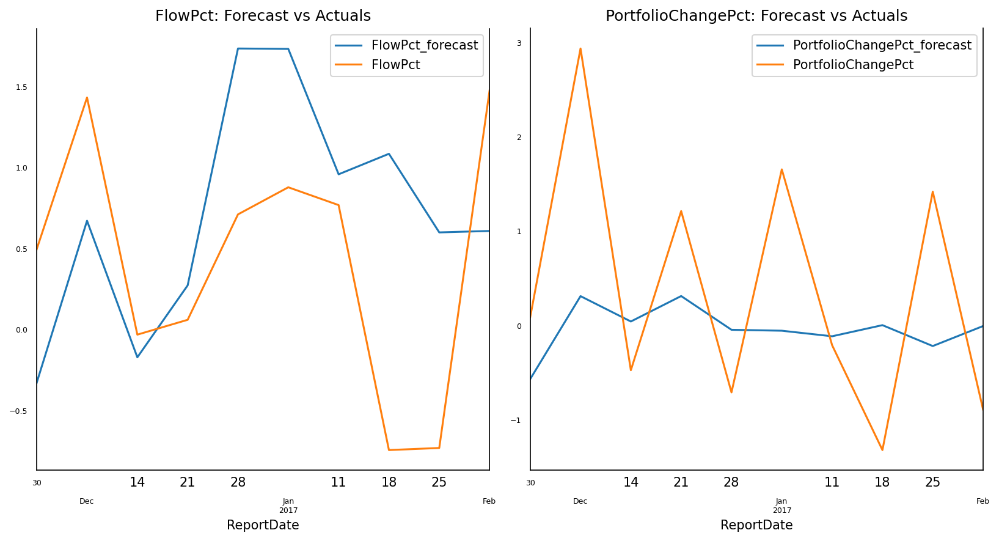

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    fin_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.9496
corr :  0.177

Forecast Accuracy of: PortfolioPct
rmse :  1.3033
corr :  0.3234


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,1
2016-12-14,-1,-1,-1,-1
2016-12-21,0,1,1,1
2016-12-28,1,-1,1,-1
2017-01-04,1,1,0,0
2017-01-11,-1,-1,-1,0
2017-01-18,-1,-1,1,1
2017-01-25,0,1,-1,-1


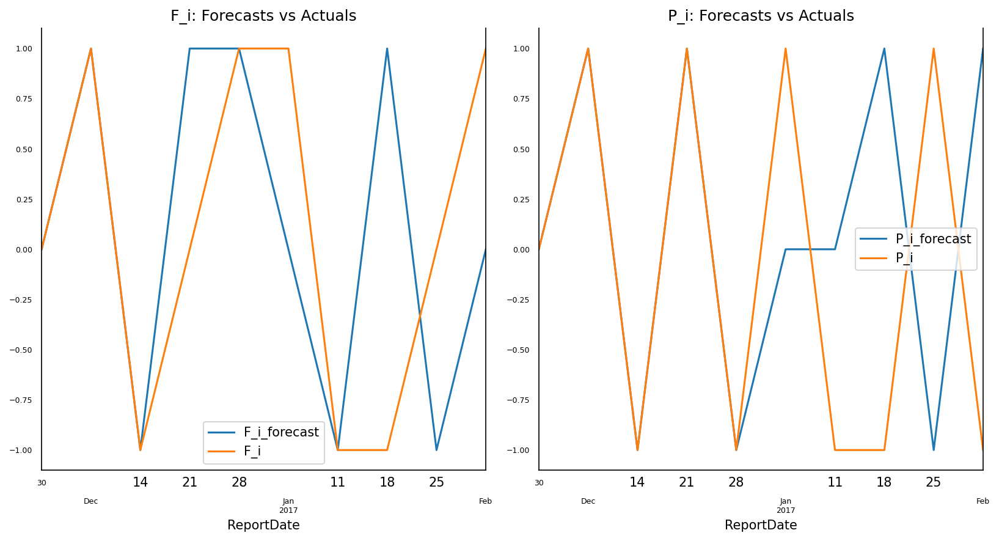

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.5
The accuracy score for PortfolioChangePct is 0.5


## hea, Health

In [ ]:
clip(hea_model1, 0.01, 0.99)

Before cliping:
min   -7.8219
max    9.6588
Name: FlowPct, dtype: float64
min   -12.3468
max     9.3282
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.440964
max    6.873212
Name: FlowPct, dtype: float64
min   -6.508442
max    5.893202
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(hea_model1, variables = hea_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0157,1.0


In [ ]:
adf_test(hea_model1)

Statistics analysis of FlowPct

Statistic Test: -25.032408845195164
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.039274057982592
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(hea_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(hea_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.2030,-1.9450,0.028016,-0.803821
2016-12-07,-1.0805,-1.5773,-0.546723,-0.961434
2016-12-14,-1.1472,1.4583,0.087511,-0.055580
2016-12-21,0.3522,-0.5120,-0.038123,0.346843
2016-12-28,0.2595,0.1388,0.002924,-0.003687
2017-01-04,-0.1318,2.5980,0.638608,0.327912
2017-01-11,1.2962,0.5878,0.094313,-0.143776
2017-01-18,-0.6482,-0.2124,0.574748,-0.331036
2017-01-25,-1.4825,-1.3108,-0.088196,0.109185


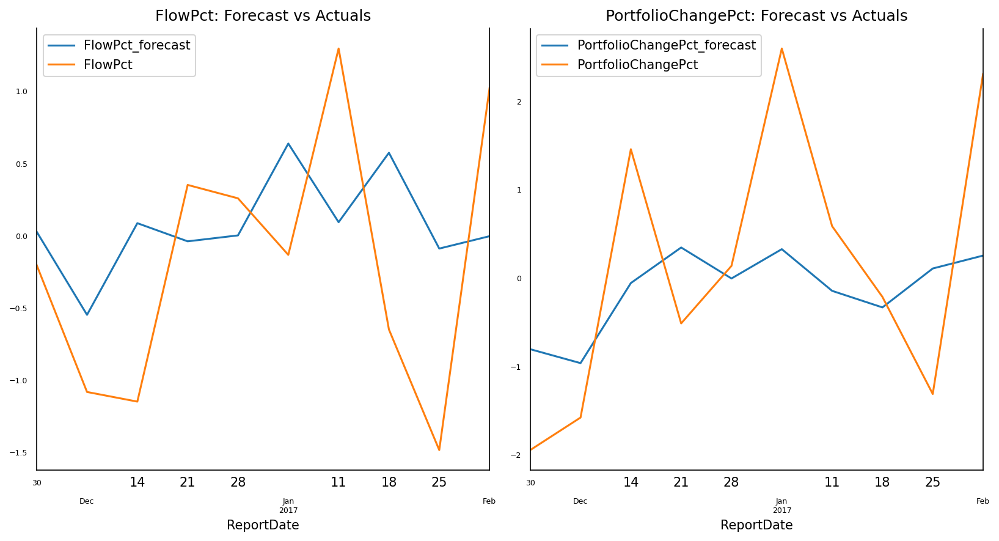

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    hea_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.9279
corr :  0.1423

Forecast Accuracy of: PortfolioPct
rmse :  1.2912
corr :  0.6642


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,-1
2016-12-14,0,1,1,1
2016-12-21,1,-1,-1,1
2016-12-28,0,1,0,-1
2017-01-04,-1,1,1,1
2017-01-11,1,-1,-1,-1
2017-01-18,-1,-1,1,-1
2017-01-25,-1,-1,-1,1


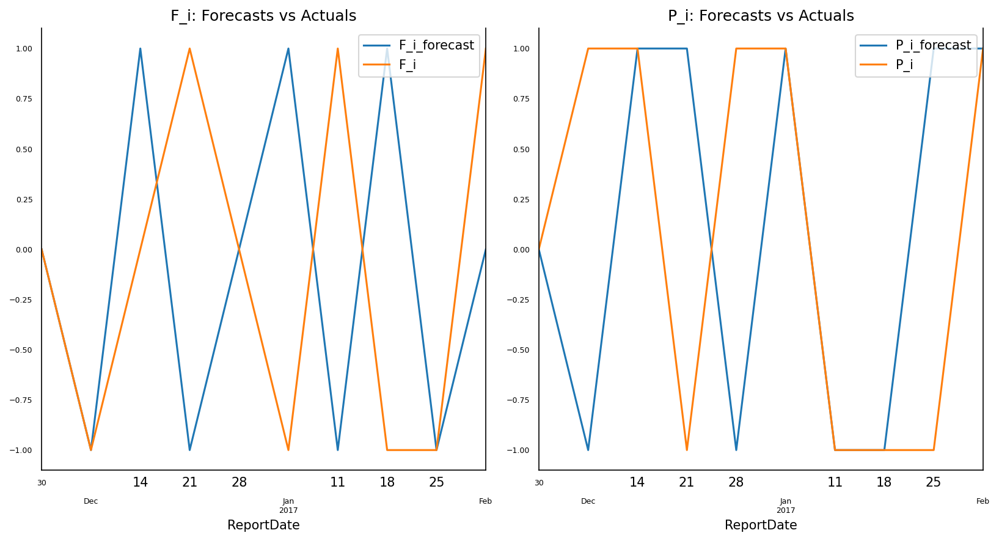

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.6


## Ind, Industrials

In [ ]:
clip(ind_model1, 0.01, 0.99)

Before cliping:
min   -16.1672
max    28.3710
Name: FlowPct, dtype: float64
min   -14.4854
max    10.7326
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -12.165120
max    14.648882
Name: FlowPct, dtype: float64
min   -7.790434
max    6.705066
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(ind_model1, variables = ind_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0948
PortfolioChangePct_y,0.5526,1.0000


In [ ]:
adf_test(ind_model1)

Statistics analysis of FlowPct

Statistic Test: -15.261648778980566
p-value: 4.851516319500406e-28
 => P-Value = 4.851516319500406e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -24.79761893512901
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(ind_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(ind_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,6.9235,-0.0274,-1.497001,0.097829
2016-12-07,5.4389,2.8380,-2.379795,-0.242797
2016-12-14,0.2535,-1.8550,-0.188631,0.505253
2016-12-21,-0.8577,0.3464,0.922631,0.677117
2016-12-28,0.5649,-0.9703,1.153519,0.257779
2017-01-04,0.1110,1.0017,1.825804,0.419705
2017-01-11,2.2952,0.1745,-0.384003,-0.340523
2017-01-18,-1.7869,-0.5015,0.444834,0.020300
2017-01-25,1.1878,2.1932,0.533749,0.226690


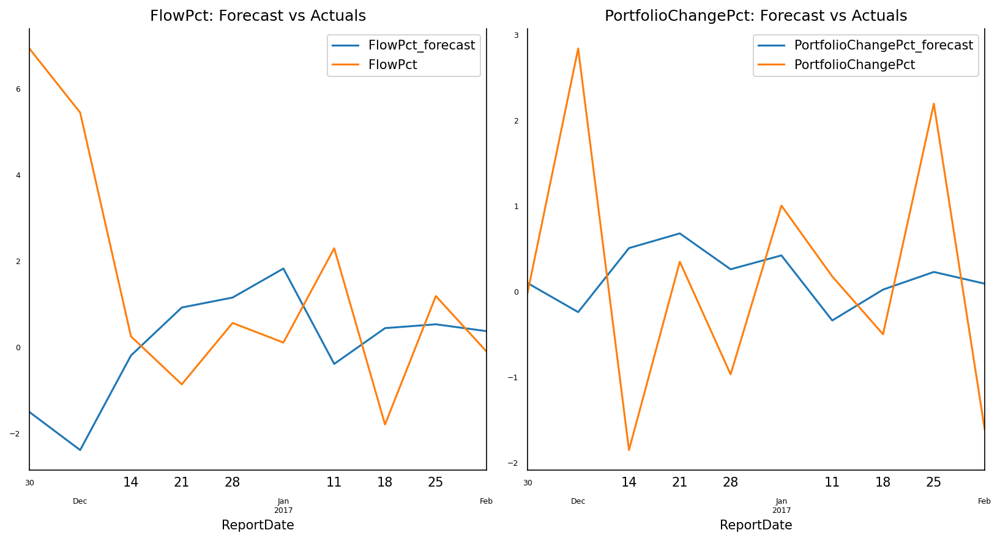

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ind_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  3.8923
corr :  -0.8168

Forecast Accuracy of: PortfolioPct
rmse :  1.5599
corr :  -0.2778


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,-1
2016-12-14,-1,-1,1,1
2016-12-21,-1,1,1,1
2016-12-28,1,-1,1,-1
2017-01-04,-1,1,1,1
2017-01-11,1,-1,-1,-1
2017-01-18,-1,-1,1,1
2017-01-25,1,1,0,1


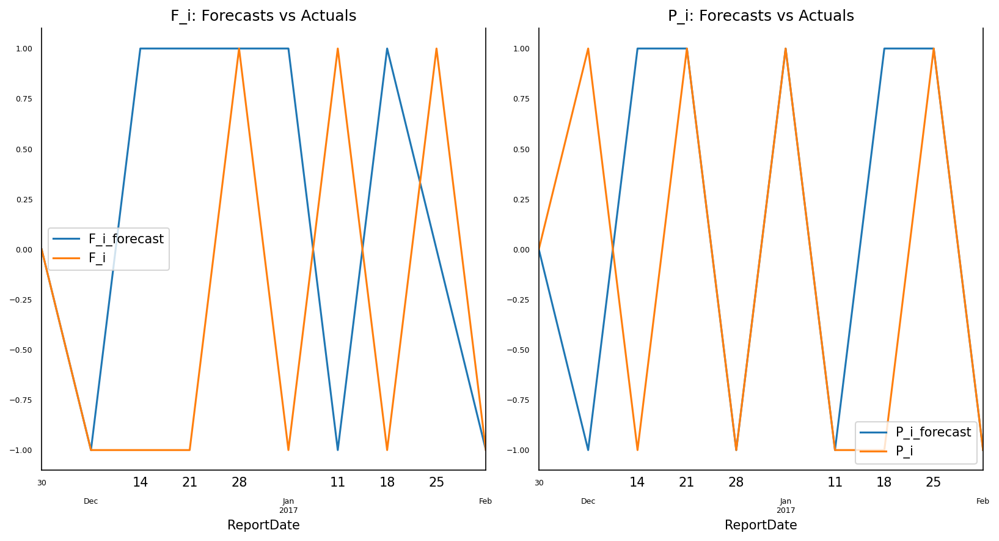

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.7


## lcb, Large Capital Blend

In [ ]:
clip(lcb_model1, 0.01, 0.99)

Before cliping:
min    -6.6146
max    11.6949
Name: FlowPct, dtype: float64
min   -14.9659
max     9.7148
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -3.240220
max    4.682524
Name: FlowPct, dtype: float64
min   -6.566160
max    5.563116
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(lcb_model1, variables = lcb_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.263
PortfolioChangePct_y,0.0063,1.000


In [ ]:
adf_test(lcb_model1)

Statistics analysis of FlowPct

Statistic Test: -5.934586740065984
p-value: 2.337185878321716e-07
 => P-Value = 2.337185878321716e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.157377991769597
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcb_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(lcb_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.0820,-0.2038,-0.079226,0.023058
2016-12-07,0.4466,1.8714,0.102188,0.101174
2016-12-14,1.1208,0.4623,0.046231,0.037020
2016-12-21,-0.1583,0.5070,0.156638,0.423948
2016-12-28,0.0363,-0.6020,-0.018860,-0.244657
2017-01-04,0.3798,0.9674,0.091310,0.248119
2017-01-11,-0.3522,0.2737,0.006495,0.258124
2017-01-18,-0.0308,-0.2107,0.064052,-0.048913
2017-01-25,-0.1299,1.1338,-0.020382,0.118934


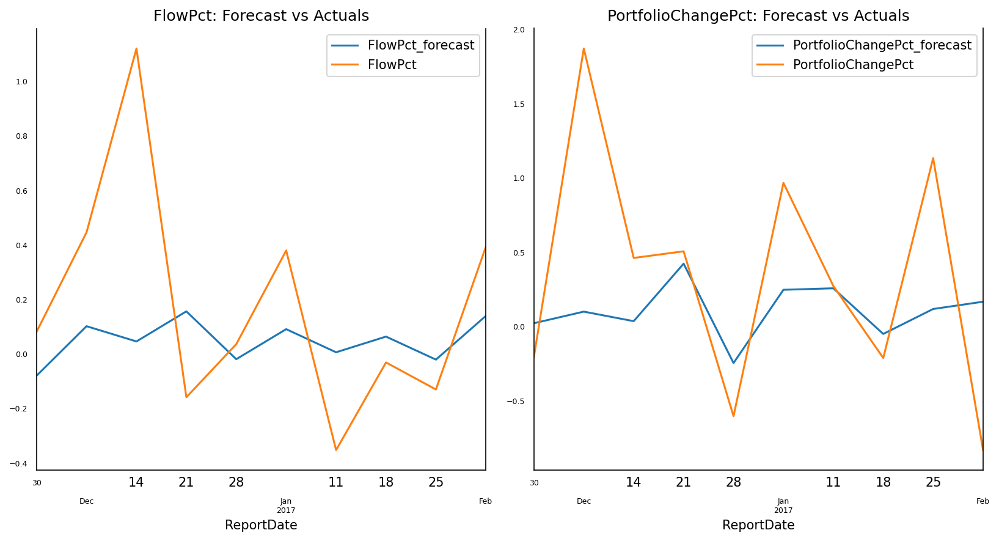

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcb_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.4121
corr :  0.2281

Forecast Accuracy of: PortfolioPct
rmse :  0.7791
corr :  0.3711


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,1,0
2016-12-14,1,-1,0,0
2016-12-21,-1,0,1,1
2016-12-28,1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,0,0
2017-01-18,1,-1,0,-1
2017-01-25,0,1,0,1


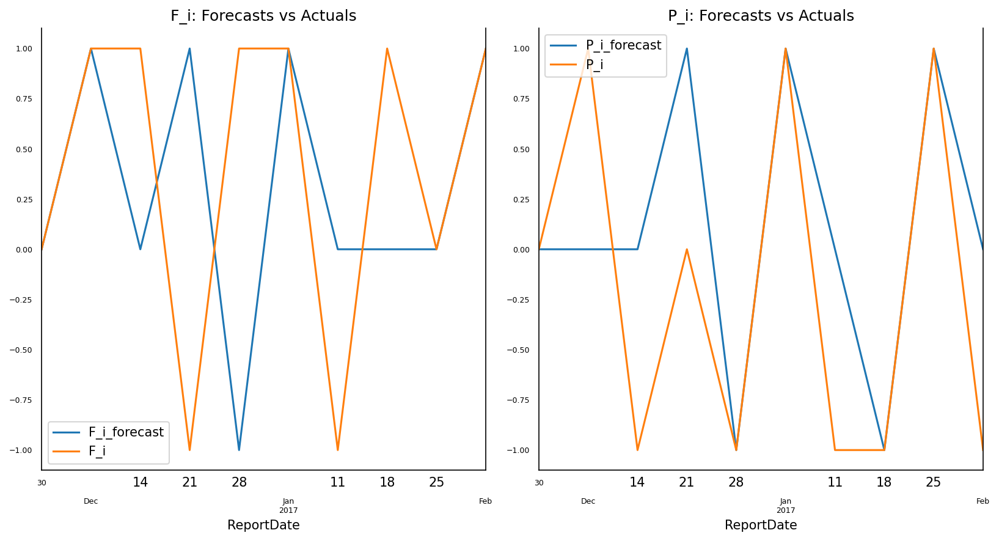

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.5
The accuracy score for PortfolioChangePct is 0.5


## lcg, Large Capital Growth

In [ ]:
clip(lcg_model1, 0.01, 0.99)

Before cliping:
min   -3.2736
max    2.7362
Name: FlowPct, dtype: float64
min   -15.2169
max     9.5312
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -2.001492
max    2.035358
Name: FlowPct, dtype: float64
min   -6.527226
max    5.727988
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(lcg_model1, variables = lcg_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0418,1.0


In [ ]:
adf_test(lcg_model1)

Statistics analysis of FlowPct

Statistic Test: -11.956434440195777
p-value: 4.199203659891901e-22
 => P-Value = 4.199203659891901e-22. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.026553300676404
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcg_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(lcg_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.0860,-0.8050,0.274667,0.147546
2016-12-07,-0.9995,1.0629,-0.041848,0.126973
2016-12-14,0.6979,0.6661,-0.055433,0.226697
2016-12-21,0.2704,0.2521,-0.073476,0.344378
2016-12-28,0.0612,-0.6077,-0.073545,-0.489583
2017-01-04,-0.3726,0.9456,-0.051431,0.465090
2017-01-11,-0.1713,1.3900,0.002309,0.591360
2017-01-18,-0.1898,0.1242,0.129872,0.070240
2017-01-25,-0.7937,1.4870,-0.007969,0.174440


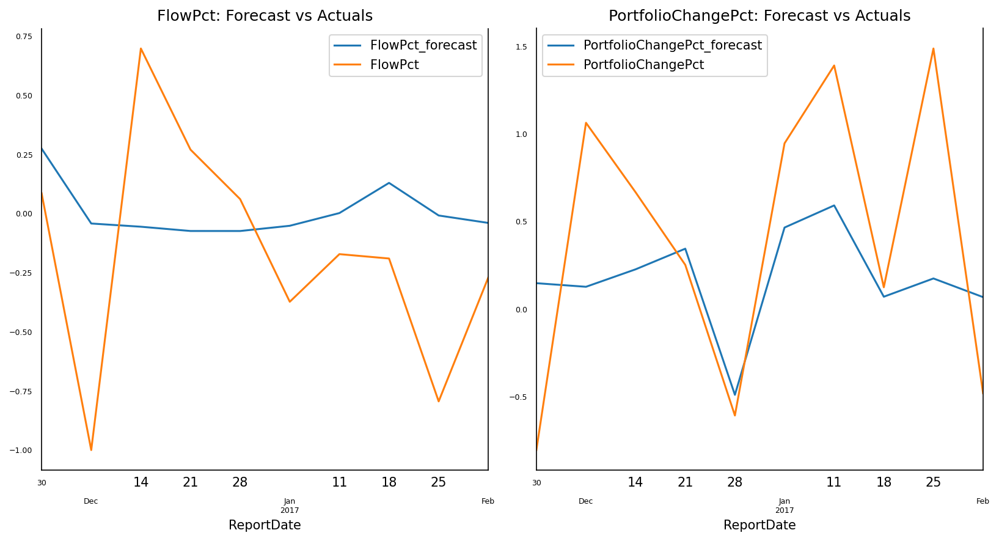

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcg_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.5062
corr :  0.0488

Forecast Accuracy of: PortfolioPct
rmse :  0.6996
corr :  0.6193


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,0
2016-12-14,1,-1,0,0
2016-12-21,-1,-1,0,1
2016-12-28,-1,-1,0,-1
2017-01-04,-1,1,0,1
2017-01-11,1,1,0,1
2017-01-18,0,-1,1,-1
2017-01-25,-1,1,-1,1


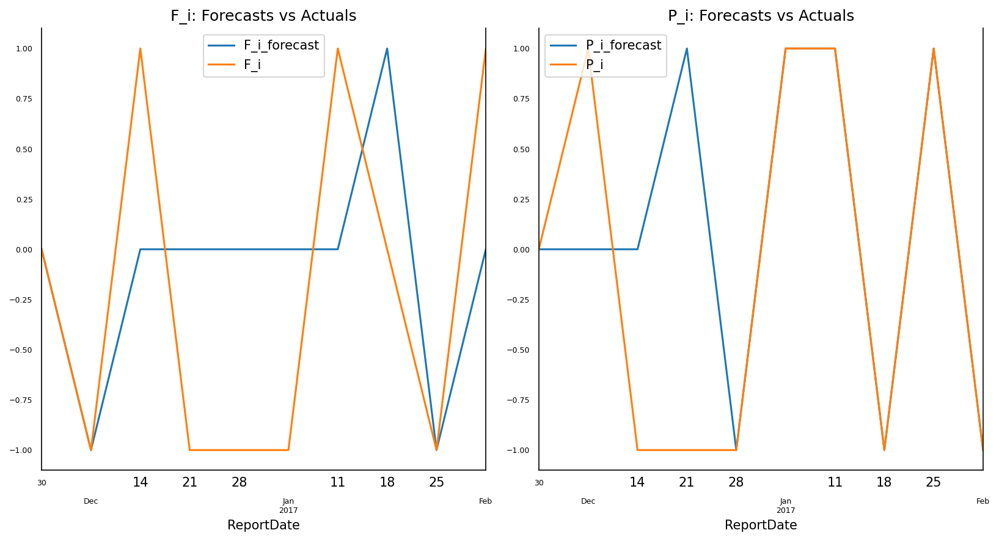

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.7


## lcv, Large Capital Value

In [ ]:
clip(lcv_model1, 0.01, 0.99)

Before cliping:
min   -2.5220
max    5.1332
Name: FlowPct, dtype: float64
min   -15.5671
max    10.4794
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -1.634352
max    2.144278
Name: FlowPct, dtype: float64
min   -6.765248
max    5.496758
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(lcv_model1, variables = lcv_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0297
PortfolioChangePct_y,0.1428,1.0000


In [ ]:
adf_test(lcv_model1)

Statistics analysis of FlowPct

Statistic Test: -4.922387988473893
p-value: 3.1538826417785145e-05
 => P-Value = 3.1538826417785145e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.945619218980283
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcv_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(lcv_model1)

Durbin Watson Statistic:
FlowPct : 2.02
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.1786,0.2084,0.086104,-0.034859
2016-12-07,-0.0382,2.3257,0.112703,-0.018897
2016-12-14,0.6098,0.2692,0.037445,0.164314
2016-12-21,0.1746,0.5929,0.159511,0.308669
2016-12-28,0.0429,-0.6783,0.014062,-0.195911
2017-01-04,0.0396,1.0899,0.130522,0.355009
2017-01-11,0.0162,-0.3356,0.051748,0.362307
2017-01-18,0.1650,-0.4385,0.065453,-0.146910
2017-01-25,0.0325,1.0558,0.063365,0.066876


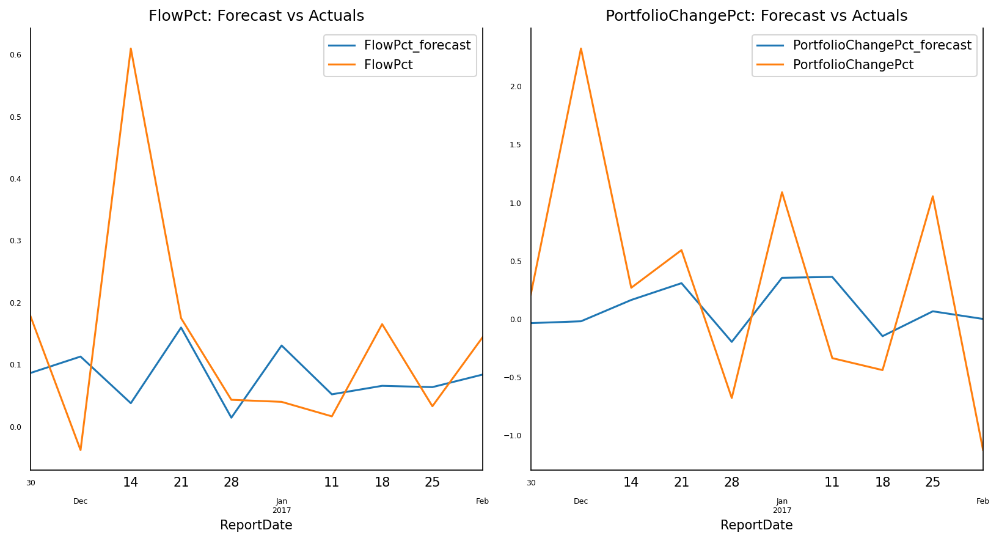

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcv_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.196
corr :  -0.228

Forecast Accuracy of: PortfolioPct
rmse :  0.9613
corr :  0.2431


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,0,0
2016-12-14,1,-1,0,1
2016-12-21,-1,1,1,1
2016-12-28,-1,-1,-1,-1
2017-01-04,0,1,1,1
2017-01-11,0,-1,0,0
2017-01-18,1,-1,0,-1
2017-01-25,-1,1,0,1


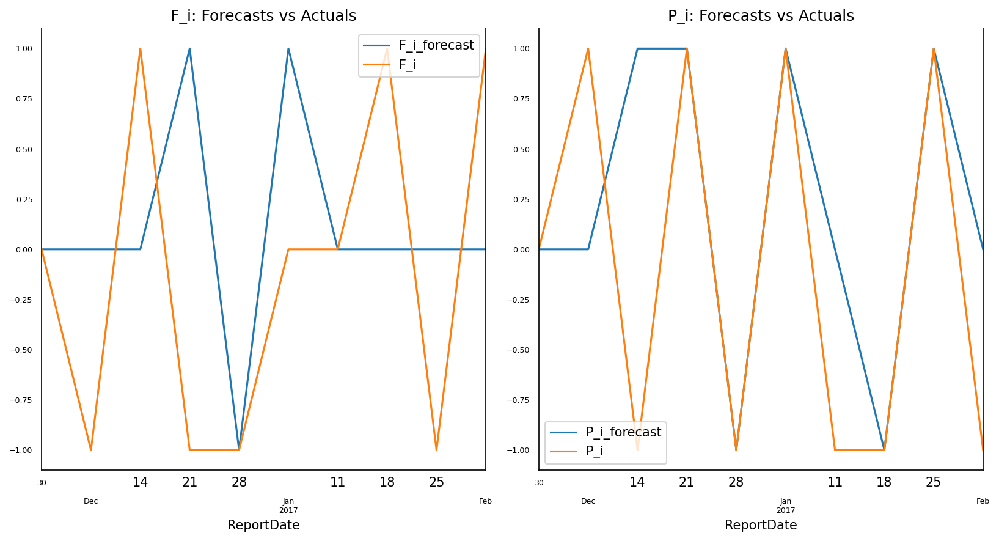

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.6


## mcb, Mid Capital Blend

In [ ]:
clip(mcb_model1, 0.01, 0.99)

Before cliping:
min   -4.3404
max    4.1101
Name: FlowPct, dtype: float64
min   -16.1133
max    10.8439
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -2.579738
max    3.011564
Name: FlowPct, dtype: float64
min   -6.458088
max    5.807360
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(mcb_model1, variables = mcb_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0115,1.0


In [ ]:
adf_test(mcb_model1)

Statistics analysis of FlowPct

Statistic Test: -26.656666634958214
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.144383192853205
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcb_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(mcb_model1)

Durbin Watson Statistic:
FlowPct : 2.01
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.1911,-0.4510,0.207970,0.039955
2016-12-07,0.8768,2.7077,0.241075,-0.137103
2016-12-14,1.4420,-0.7214,0.103659,-0.272545
2016-12-21,-0.5757,0.7614,0.073249,0.149555
2016-12-28,0.0944,-0.9701,-0.101542,-0.292675
2017-01-04,0.6505,1.8437,0.116151,0.297240
2017-01-11,0.8514,-0.2736,0.140611,0.429281
2017-01-18,0.0503,-0.2211,0.093277,0.033366
2017-01-25,0.4771,1.5824,0.205105,-0.000851


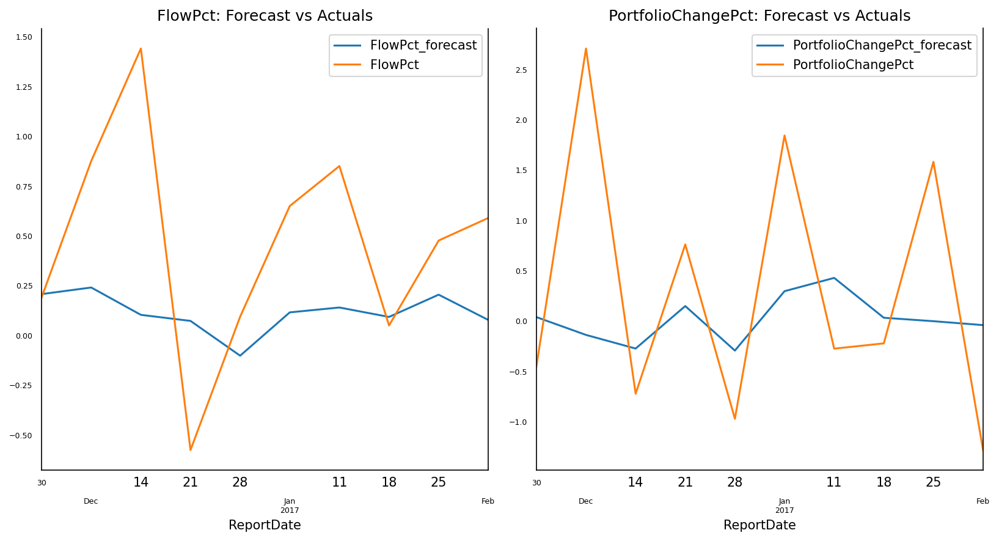

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcb_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.6152
corr :  0.3195

Forecast Accuracy of: PortfolioPct
rmse :  1.2793
corr :  0.2214


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,0,-1
2016-12-14,1,-1,-1,-1
2016-12-21,-1,1,0,1
2016-12-28,1,-1,-1,-1
2017-01-04,1,1,1,1
2017-01-11,1,-1,0,1
2017-01-18,-1,0,0,-1
2017-01-25,1,1,1,0


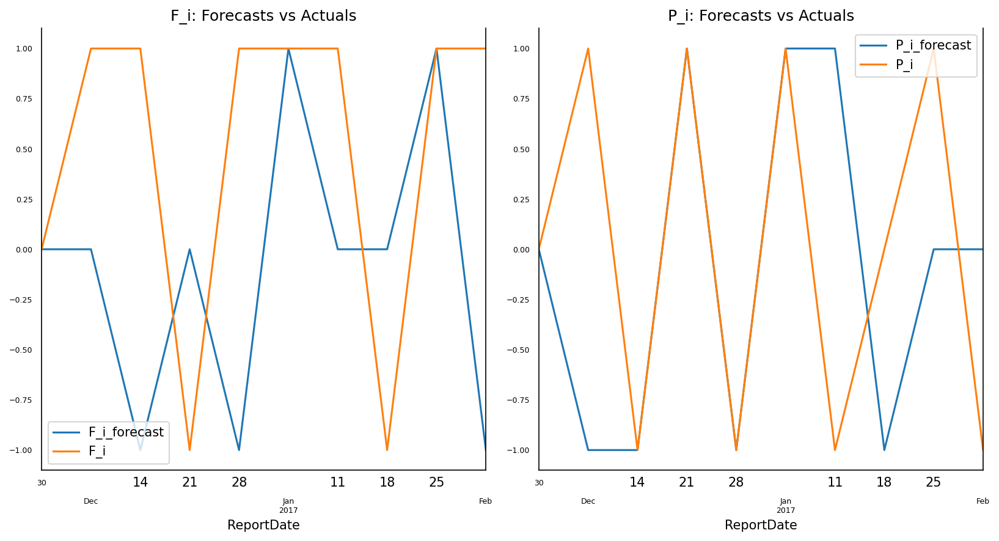

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.5


## mcg, Mid Capital Growth

In [ ]:
clip(mcg_model1, 0.01, 0.99)

Before cliping:
min   -2.2046
max    6.5005
Name: FlowPct, dtype: float64
min   -17.0927
max    11.8977
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -1.308802
max    1.391684
Name: FlowPct, dtype: float64
min   -6.96690
max    5.97288
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(mcg_model1, variables = mcg_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.0545,1.0


In [ ]:
adf_test(mcg_model1)

Statistics analysis of FlowPct

Statistic Test: -5.8163240306370945
p-value: 4.284080662336255e-07
 => P-Value = 4.284080662336255e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.38391395036039
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcg_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(mcg_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.0004,-0.9481,-0.018458,0.578090
2016-12-07,-0.2110,1.6674,-0.092623,0.340038
2016-12-14,0.1702,-0.5655,-0.142712,0.182301
2016-12-21,-1.0102,0.5742,-0.026530,0.448650
2016-12-28,-0.3797,-0.9942,-0.030796,-0.135659
2017-01-04,-0.1094,1.7528,-0.027952,0.515632
2017-01-11,-0.4904,0.3767,-0.034600,0.785345
2017-01-18,-0.0783,0.0536,-0.008092,0.422262
2017-01-25,-0.3432,1.4660,-0.002269,0.293510


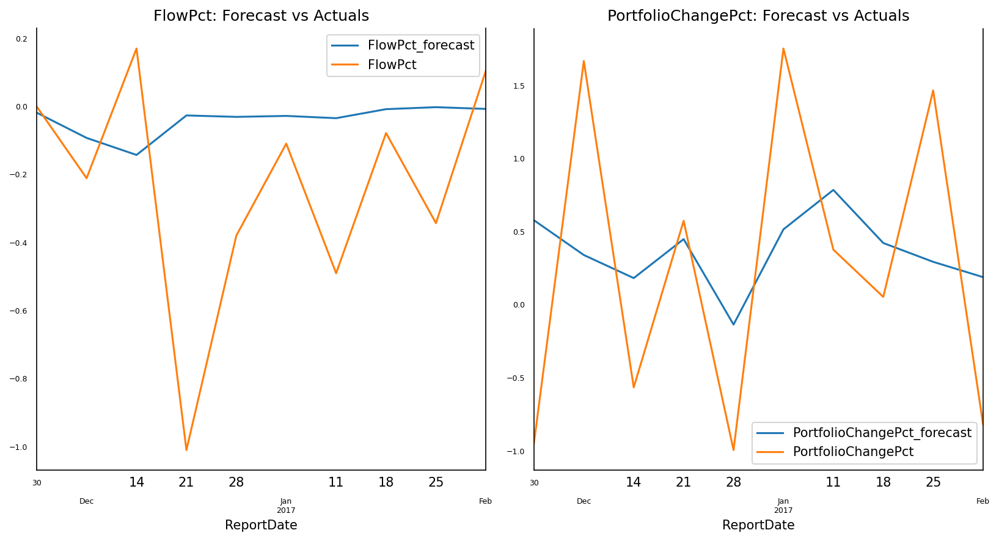

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcg_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.3937
corr :  -0.2715

Forecast Accuracy of: PortfolioPct
rmse :  0.9811
corr :  0.3539


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,0,-1
2016-12-14,1,-1,0,-1
2016-12-21,-1,1,1,1
2016-12-28,1,-1,0,-1
2017-01-04,1,1,0,1
2017-01-11,-1,-1,0,1
2017-01-18,1,-1,0,-1
2017-01-25,-1,1,0,-1


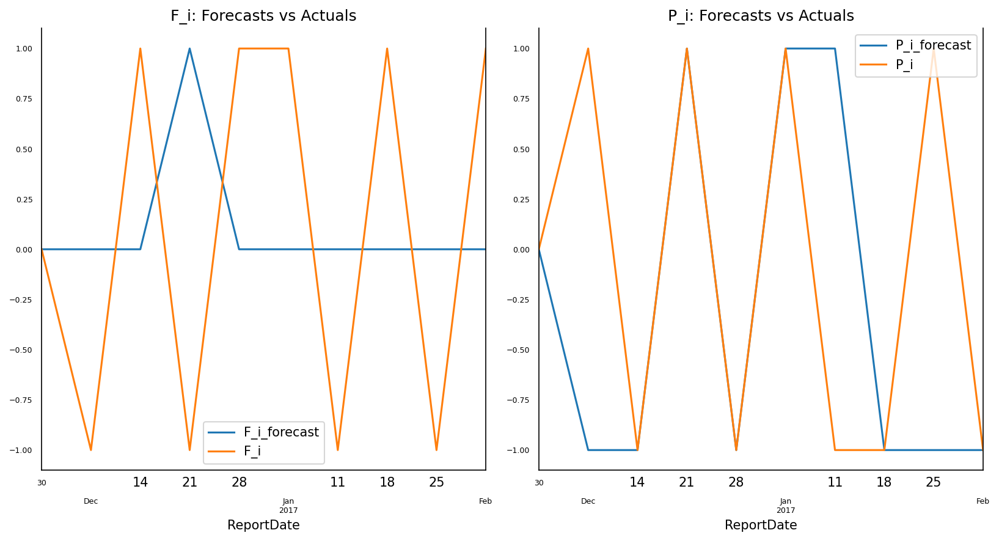

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.1
The accuracy score for PortfolioChangePct is 0.7


## mcv, Mid Capital Value

In [ ]:
clip(mcv_model1, 0.01, 0.99)

Before cliping:
min   -4.1371
max    3.3965
Name: FlowPct, dtype: float64
min   -17.1946
max    12.1099
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -1.593342
max    1.332046
Name: FlowPct, dtype: float64
min   -6.998208
max    6.172288
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(mcv_model1, variables = mcv_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0001
PortfolioChangePct_y,0.0038,1.0000


In [ ]:
adf_test(mcv_model1)

Statistics analysis of FlowPct

Statistic Test: -6.827223913672004
p-value: 1.934027011418529e-09
 => P-Value = 1.934027011418529e-09. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.185241751052065
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcv_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(mcv_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.3624,-0.0645,0.191316,0.215574
2016-12-07,0.2687,2.7471,0.156539,-0.242037
2016-12-14,-0.2111,-0.8441,0.151172,0.233020
2016-12-21,0.8452,0.7294,0.105801,0.688349
2016-12-28,0.0965,-0.9550,0.104262,-0.430054
2017-01-04,0.3604,1.7572,0.131291,0.392985
2017-01-11,0.4533,-0.5716,0.172400,0.661779
2017-01-18,0.1495,-0.2036,0.069610,-0.096189
2017-01-25,-0.0296,1.4905,0.059667,-0.007620


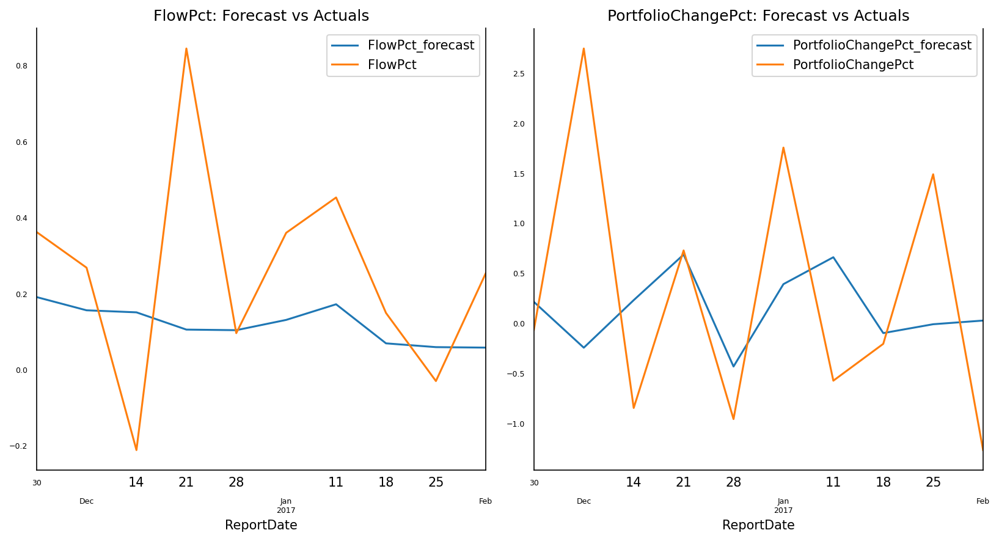

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcv_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.3007
corr :  0.176

Forecast Accuracy of: PortfolioPct
rmse :  1.3328
corr :  -0.0195


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,0,1,0,-1
2016-12-14,-1,-1,0,1
2016-12-21,1,1,0,1
2016-12-28,-1,-1,0,-1
2017-01-04,1,1,0,1
2017-01-11,0,-1,0,1
2017-01-18,-1,1,-1,-1
2017-01-25,-1,1,0,0


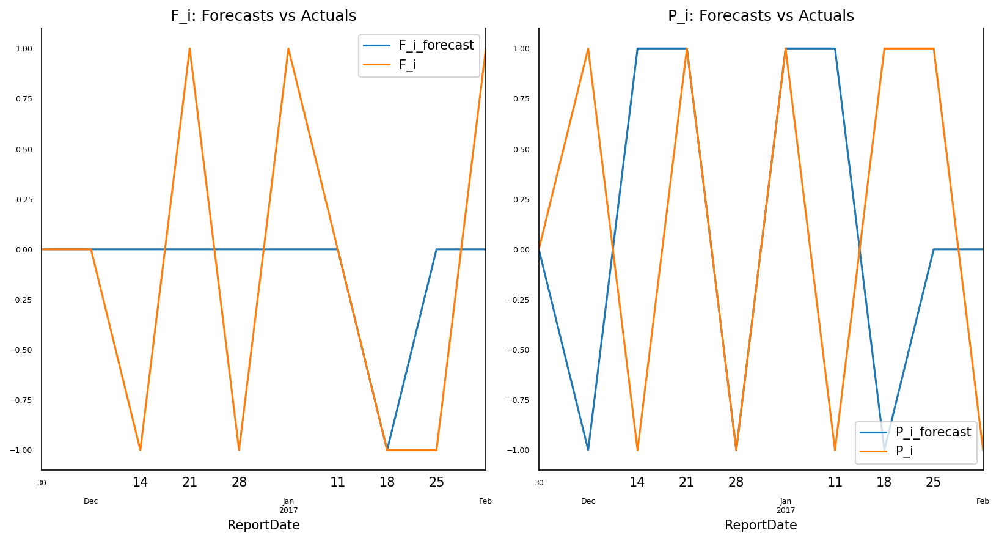

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.4


## rea, Real Estate

In [ ]:
clip(rea_model1, 0.01, 0.99)

Before cliping:
min   -27.9671
max    39.3459
Name: FlowPct, dtype: float64
min   -20.7912
max    23.8593
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -5.169620
max    6.358636
Name: FlowPct, dtype: float64
min   -12.729264
max     9.489578
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(rea_model1, variables = rea_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.3374
PortfolioChangePct_y,0.0186,1.0000


In [ ]:
adf_test(rea_model1)

Statistics analysis of FlowPct

Statistic Test: -5.894964480537216
p-value: 2.865744811103192e-07
 => P-Value = 2.865744811103192e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.170531856114053
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(rea_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(rea_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.2743,0.4503,0.590687,0.070733
2016-12-07,0.1321,2.1155,-0.071015,0.152488
2016-12-14,-0.8877,-0.7480,-0.172114,0.833552
2016-12-21,0.1021,0.3964,0.183288,-0.224034
2016-12-28,-0.5659,-0.2507,0.293050,0.112606
2017-01-04,0.5539,3.1204,0.108158,0.539854
2017-01-11,0.4312,-1.4986,0.018656,0.380933
2017-01-18,0.2301,0.9171,0.177056,0.210323
2017-01-25,-0.0385,-0.0449,0.105222,0.040160


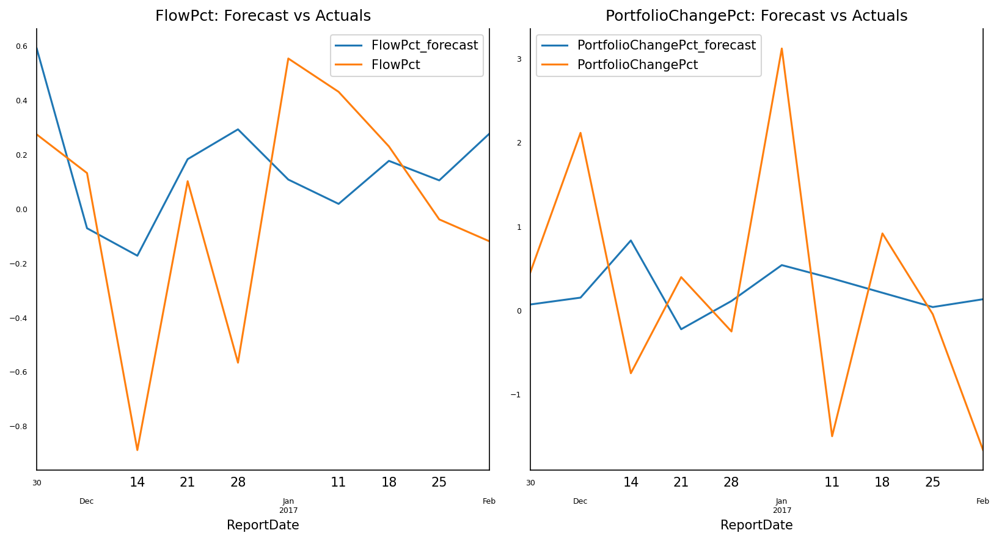

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    rea_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.4413
corr :  0.2508

Forecast Accuracy of: PortfolioPct
rmse :  1.4472
corr :  0.0171


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,-1,0
2016-12-14,-1,-1,-1,1
2016-12-21,1,1,1,-1
2016-12-28,-1,-1,1,1
2017-01-04,1,1,-1,1
2017-01-11,-1,-1,0,-1
2017-01-18,-1,1,1,-1
2017-01-25,-1,-1,0,-1


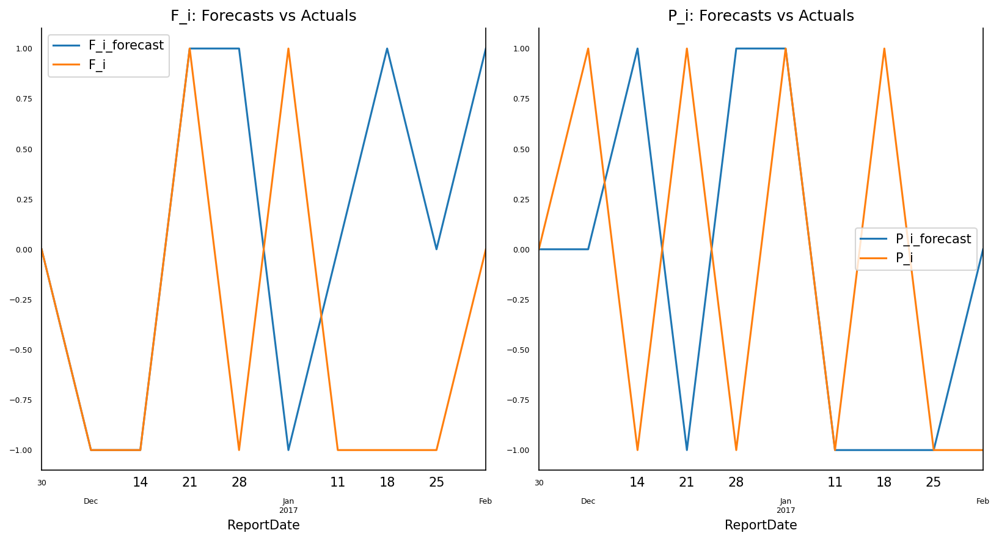

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.4


## scb, Small Capital Blend

In [ ]:
clip(scb_model1, 0.01, 0.99)

Before cliping:
min   -27.9152
max    65.2939
Name: FlowPct, dtype: float64
min   -17.9520
max    13.1679
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -9.050106
max    9.715816
Name: FlowPct, dtype: float64
min   -7.380496
max    6.572004
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(scb_model1, variables = scb_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0441
PortfolioChangePct_y,0.0439,1.0000


In [ ]:
adf_test(scb_model1)

Statistics analysis of FlowPct

Statistic Test: -8.186588486896273
p-value: 7.869659642468179e-13
 => P-Value = 7.869659642468179e-13. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.15490366714889
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scb_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(scb_model1)

Durbin Watson Statistic:
FlowPct : 1.96
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.7559,-1.0174,-1.666959,-0.083742
2016-12-07,0.2499,3.2676,-0.506320,-0.194671
2016-12-14,1.1097,-0.5389,0.232291,-0.307357
2016-12-21,-0.0432,1.3315,0.606592,-0.060929
2016-12-28,0.7987,-0.9991,0.298212,-0.526479
2017-01-04,0.6949,1.9631,-0.426875,0.299011
2017-01-11,0.5563,-1.0960,-0.676587,0.421205
2017-01-18,0.1542,-1.0264,-0.183812,-0.235864
2017-01-25,0.0360,1.8008,0.137378,-0.324458


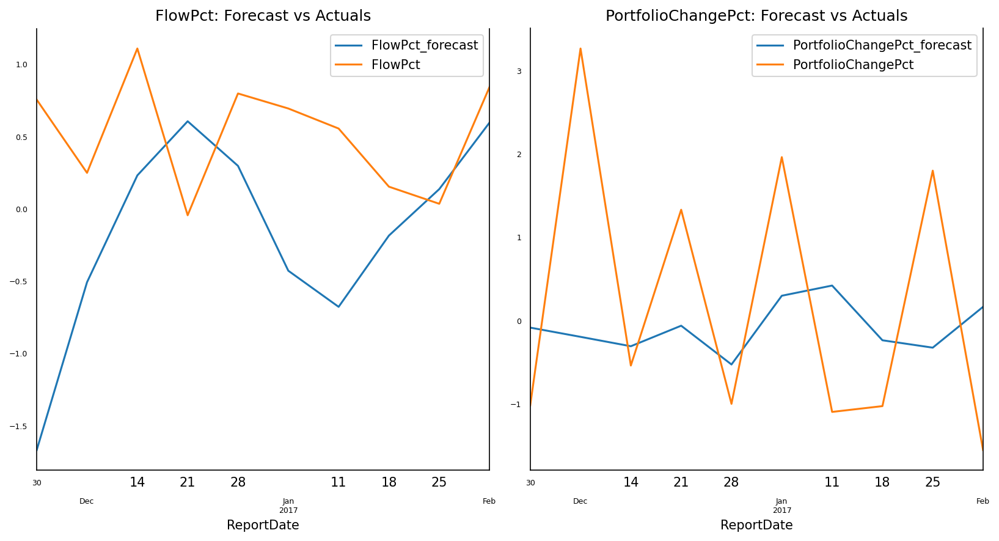

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scb_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.0416
corr :  -0.1184

Forecast Accuracy of: PortfolioPct
rmse :  1.6806
corr :  -0.0512


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,1,-1
2016-12-14,1,-1,1,-1
2016-12-21,-1,1,1,1
2016-12-28,1,-1,-1,-1
2017-01-04,-1,1,-1,1
2017-01-11,-1,-1,-1,1
2017-01-18,-1,0,1,-1
2017-01-25,-1,1,1,0


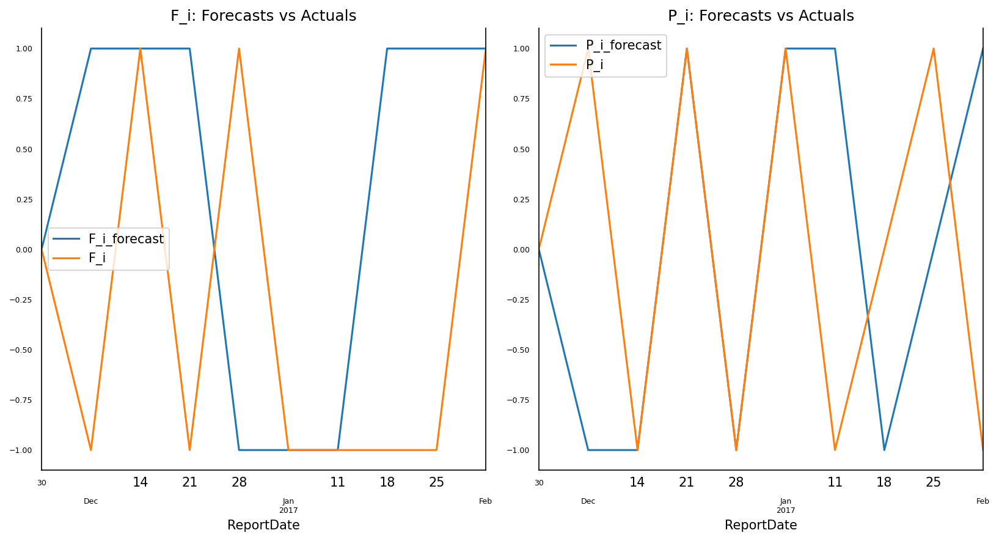

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.5
The accuracy score for PortfolioChangePct is 0.5


## scg, Small Capital Growth

In [ ]:
clip(scg_model1, 0.01, 0.99)

Before cliping:
min   -2.3639
max    2.1243
Name: FlowPct, dtype: float64
min   -17.780
max    12.414
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -1.530178
max    1.473418
Name: FlowPct, dtype: float64
min   -7.517886
max    6.318108
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(scg_model1, variables = scg_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.2614,1.0


In [ ]:
adf_test(scg_model1)

Statistics analysis of FlowPct

Statistic Test: -10.268221753722939
p-value: 4.065895860318587e-18
 => P-Value = 4.065895860318587e-18. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.66704134760055
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scg_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(scg_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.0291,-1.6599,0.105730,0.097355
2016-12-07,0.2677,2.0343,0.080993,-0.219982
2016-12-14,0.4753,-0.8185,0.065458,-0.201699
2016-12-21,-0.3124,0.8222,0.061906,0.318366
2016-12-28,-0.4683,-1.0279,0.099380,-0.387727
2017-01-04,-0.0167,2.0378,0.017592,0.625802
2017-01-11,0.3603,-0.1664,-0.039964,0.795751
2017-01-18,-0.0240,-0.5907,-0.038644,0.126678
2017-01-25,0.8825,1.7076,-0.022891,0.059754


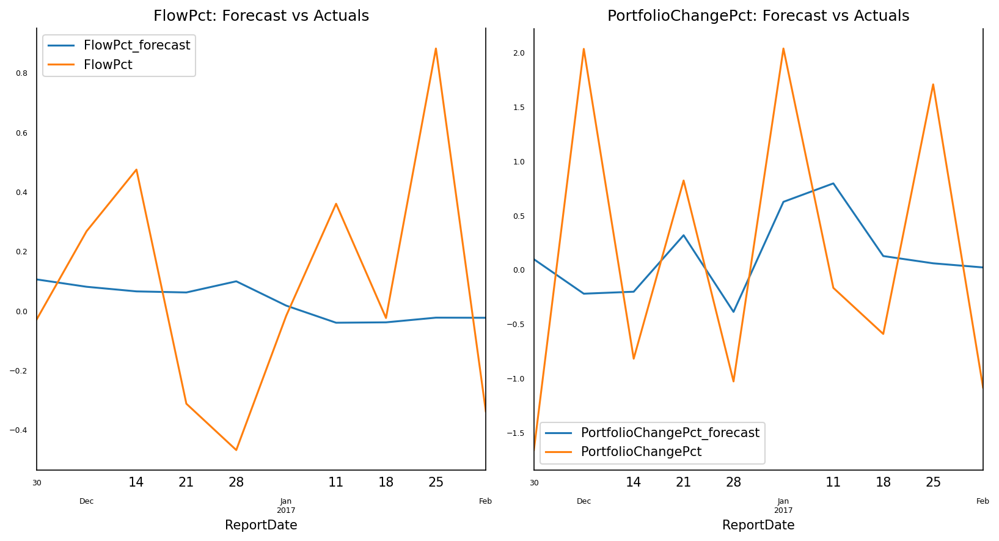

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scg_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.42
corr :  -0.3025

Forecast Accuracy of: PortfolioPct
rmse :  1.2879
corr :  0.2571


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,0,-1
2016-12-14,1,-1,0,0
2016-12-21,-1,1,0,1
2016-12-28,-1,-1,0,-1
2017-01-04,1,1,0,1
2017-01-11,1,-1,0,1
2017-01-18,-1,-1,0,-1
2017-01-25,1,1,0,0


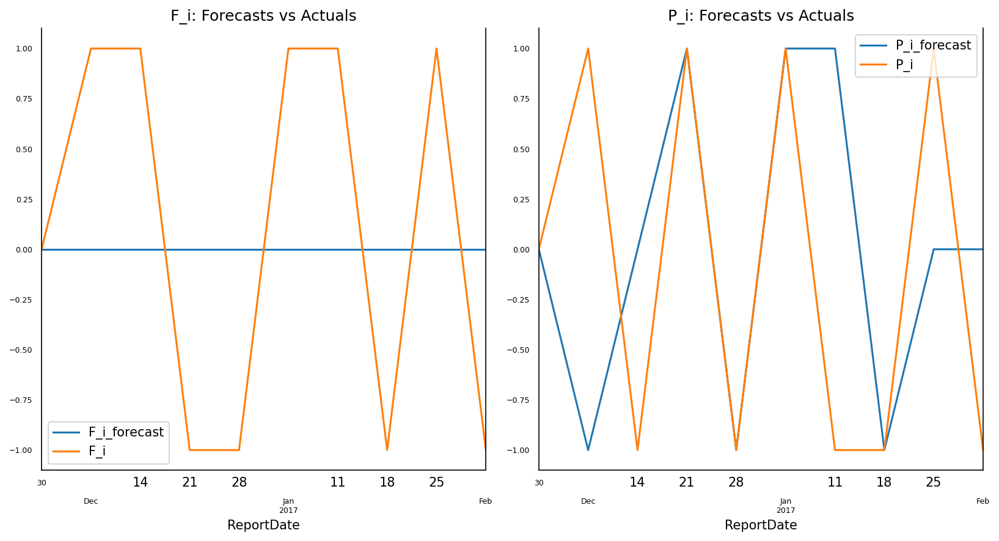

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.1
The accuracy score for PortfolioChangePct is 0.5


## scv, Small Capital Value

In [ ]:
clip(scv_model1, 0.01, 0.99)

Before cliping:
min   -4.3952
max    4.7102
Name: FlowPct, dtype: float64
min   -17.8990
max    13.6372
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -1.810638
max    2.071820
Name: FlowPct, dtype: float64
min   -7.271356
max    6.350456
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(scv_model1, variables = scv_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.1087,1.0


In [ ]:
adf_test(scv_model1)

Statistics analysis of FlowPct

Statistic Test: -5.988293648617906
p-value: 1.770451899999362e-07
 => P-Value = 1.770451899999362e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -26.255472626856836
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scv_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(scv_model1)

Durbin Watson Statistic:
FlowPct : 2.0
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.3342,-0.5499,0.337003,0.320939
2016-12-07,0.6305,3.5934,0.234061,0.037401
2016-12-14,1.6335,-0.6807,0.166777,-0.139539
2016-12-21,-0.1872,1.5602,0.050910,0.340562
2016-12-28,0.0813,-0.9844,-0.034598,-0.442984
2017-01-04,-0.1346,1.9744,0.046535,0.212785
2017-01-11,0.8384,-1.2480,0.166677,0.560329
2017-01-18,0.5330,-1.0846,0.123094,-0.355665
2017-01-25,0.5471,1.9713,0.000672,-0.503044


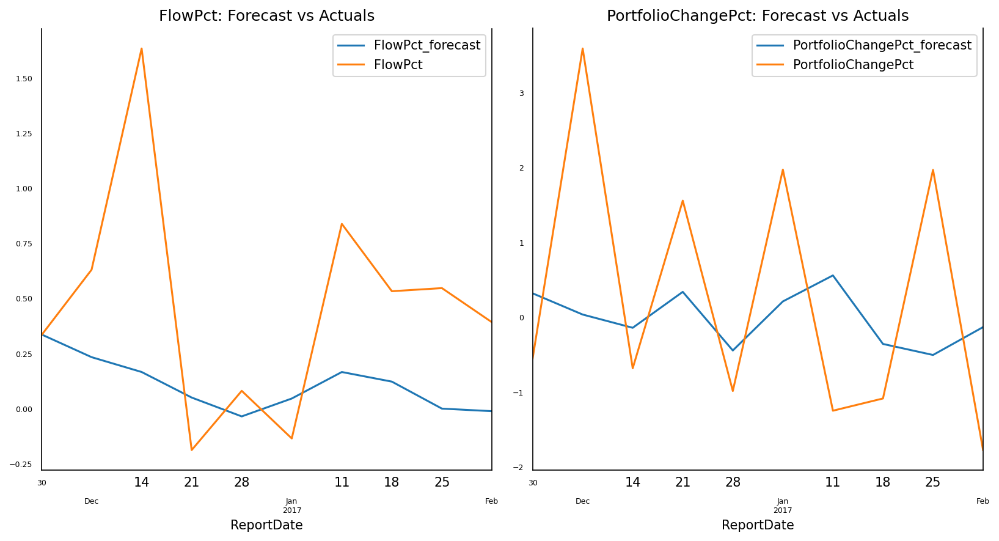

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scv_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  0.5909
corr :  0.3727

Forecast Accuracy of: PortfolioPct
rmse :  1.7665
corr :  0.066


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,-1
2016-12-14,1,-1,0,-1
2016-12-21,-1,1,-1,1
2016-12-28,1,-1,0,-1
2017-01-04,-1,1,0,1
2017-01-11,1,-1,1,1
2017-01-18,-1,1,0,-1
2017-01-25,0,1,-1,-1


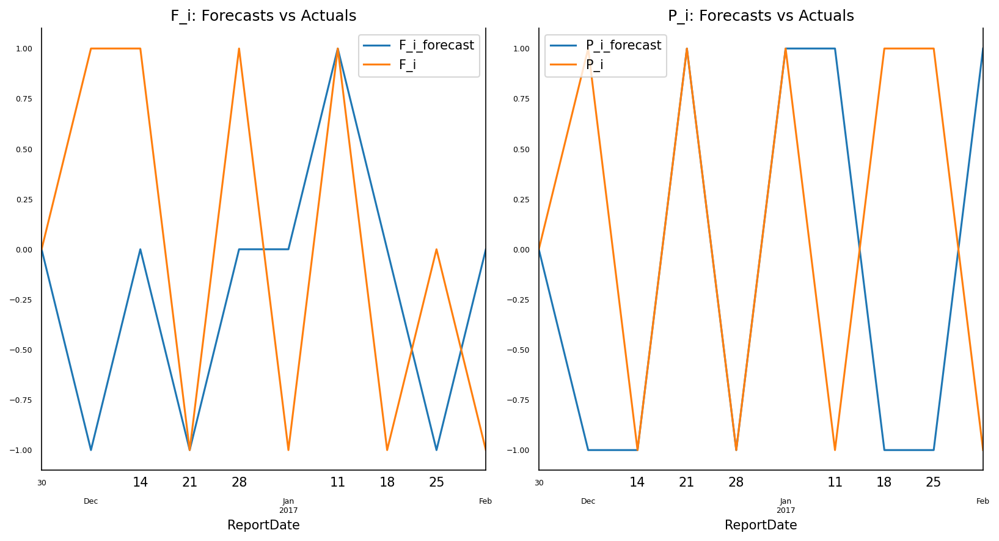

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.5


## tel, Telecom

In [ ]:
clip(tel_model1, 0.01, 0.99)

Before cliping:
min   -15.2367
max    18.8269
Name: FlowPct, dtype: float64
min   -17.4834
max    17.5016
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -7.374104
max    8.995028
Name: FlowPct, dtype: float64
min   -6.592470
max    6.426036
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(tel_model1, variables = tel_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0
PortfolioChangePct_y,0.3124,1.0


In [ ]:
adf_test(tel_model1)

Statistics analysis of FlowPct

Statistic Test: -10.55142321745212
p-value: 8.157290356125866e-19
 => P-Value = 8.157290356125866e-19. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -25.39924821308145
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(tel_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(tel_model1)

Durbin Watson Statistic:
FlowPct : 1.97
PortfolioChangePct : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,-0.6675,-0.8973,0.349507,0.092294
2016-12-07,1.9919,4.6463,0.047119,-0.529684
2016-12-14,0.5663,-0.5926,0.802701,0.646970
2016-12-21,1.4593,2.5637,0.348506,0.317573
2016-12-28,2.0766,0.8746,0.498412,-0.915357
2017-01-04,7.9112,3.9538,0.099895,0.302406
2017-01-11,4.4253,-2.8787,0.012668,0.277552
2017-01-18,0.9345,-0.3992,-0.123118,0.055861
2017-01-25,-2.6467,-0.4705,-0.070649,0.366575


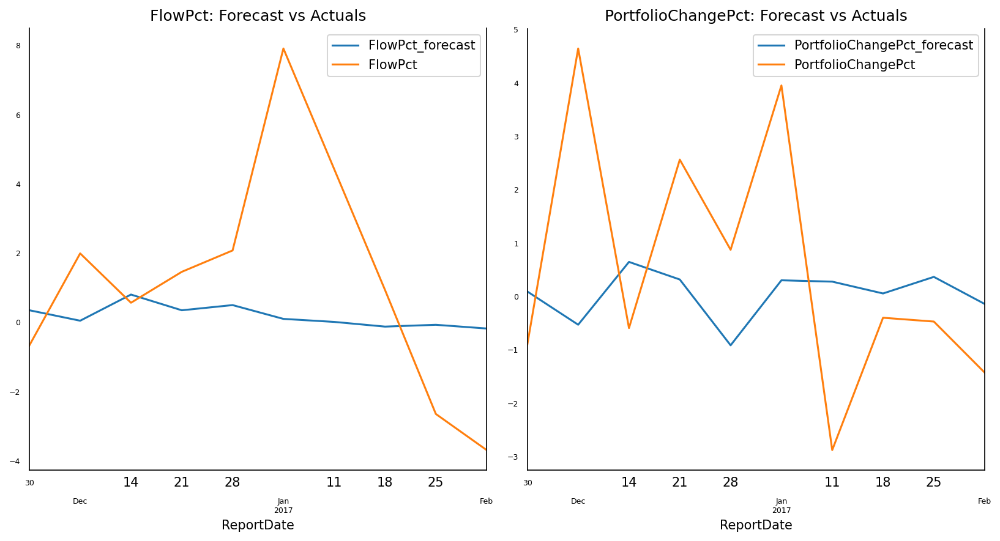

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tel_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  3.3041
corr :  0.1307

Forecast Accuracy of: PortfolioPct
rmse :  2.5182
corr :  -0.2707


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,1,1,-1,-1
2016-12-14,-1,-1,1,1
2016-12-21,1,1,-1,-1
2016-12-28,1,-1,1,-1
2017-01-04,1,1,-1,1
2017-01-11,-1,-1,0,0
2017-01-18,-1,1,-1,-1
2017-01-25,-1,0,0,1


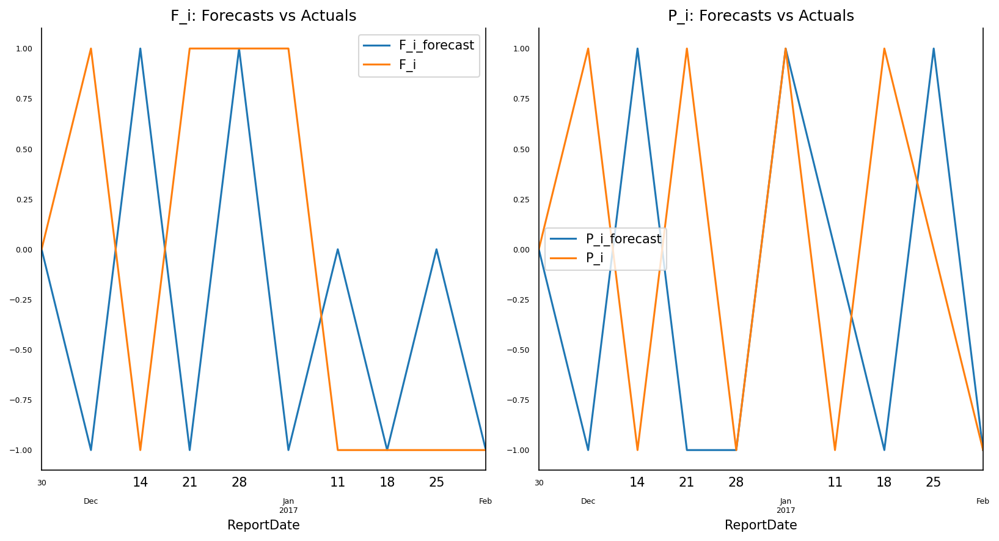

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.4
The accuracy score for PortfolioChangePct is 0.4


## uti, Utilities

In [ ]:
clip(uti_model1, 0.01, 0.99)

Before cliping:
min    -9.5055
max    15.1623
Name: FlowPct, dtype: float64
min   -15.4730
max    10.1838
Name: PortfolioChangePct, dtype: float64

After cliping:
min   -6.103494
max    6.785928
Name: FlowPct, dtype: float64
min   -6.739520
max    5.171748
Name: PortfolioChangePct, dtype: float64


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


In [ ]:
grangers_causation_matrix(uti_model1, variables = uti_model1.columns)

,FlowPct_x,PortfolioChangePct_x
FlowPct_y,1.0000,0.0043
PortfolioChangePct_y,0.8774,1.0000


In [ ]:
adf_test(uti_model1)

Statistics analysis of FlowPct

Statistic Test: -21.81452346465232
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of PortfolioChangePct

Statistic Test: -8.295288250700569
p-value: 4.155971786700165e-13
 => P-Value = 4.155971786700165e-13. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(uti_model1, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
dw_statistic(uti_model1)

Durbin Watson Statistic:
FlowPct : 1.99
PortfolioChangePct : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_forecast', 'PortfolioChangePct_forecast'])

In [ ]:
test["FlowPct_forecast"] = forecast["FlowPct_forecast"]
test["PortfolioChangePct_forecast"] = forecast["PortfolioChangePct_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,FlowPct,PortfolioChangePct,FlowPct_forecast,PortfolioChangePct_forecast
ReportDate,,,,
2016-11-30,0.0109,0.1389,-0.671601,-0.103046
2016-12-07,-0.9990,1.3633,0.328365,-0.368819
2016-12-14,-0.3589,0.9230,0.165319,0.252407
2016-12-21,0.7863,1.3563,0.123703,0.284334
2016-12-28,-0.6129,-0.4188,0.030501,0.078201
2017-01-04,0.2172,1.0496,0.212659,0.302757
2017-01-11,-0.4926,-0.1292,0.268029,-0.146854
2017-01-18,-0.9724,0.8942,0.270408,0.172415
2017-01-25,-1.5704,-0.7857,0.128608,0.201699


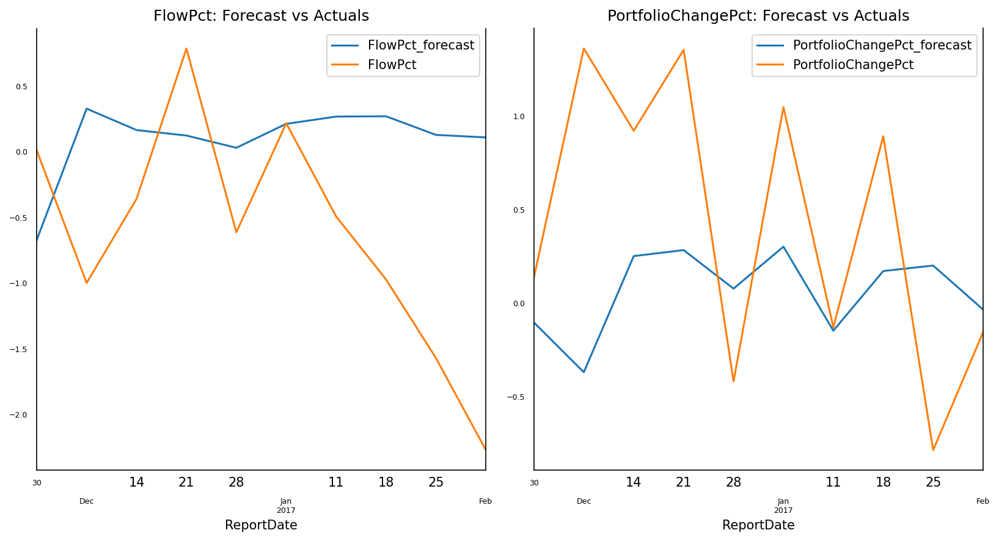

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    uti_model1[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct:
rmse :  1.1845
corr :  -0.2253

Forecast Accuracy of: PortfolioPct
rmse :  0.8351
corr :  0.0869


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 4:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_i_forecast,P_i_forecast
ReportDate,,,,
2016-11-30,0,0,0,0
2016-12-07,-1,1,1,-1
2016-12-14,1,-1,-1,1
2016-12-21,1,1,0,0
2016-12-28,-1,-1,0,-1
2017-01-04,1,1,1,1
2017-01-11,-1,-1,0,-1
2017-01-18,-1,1,0,1
2017-01-25,-1,-1,-1,0


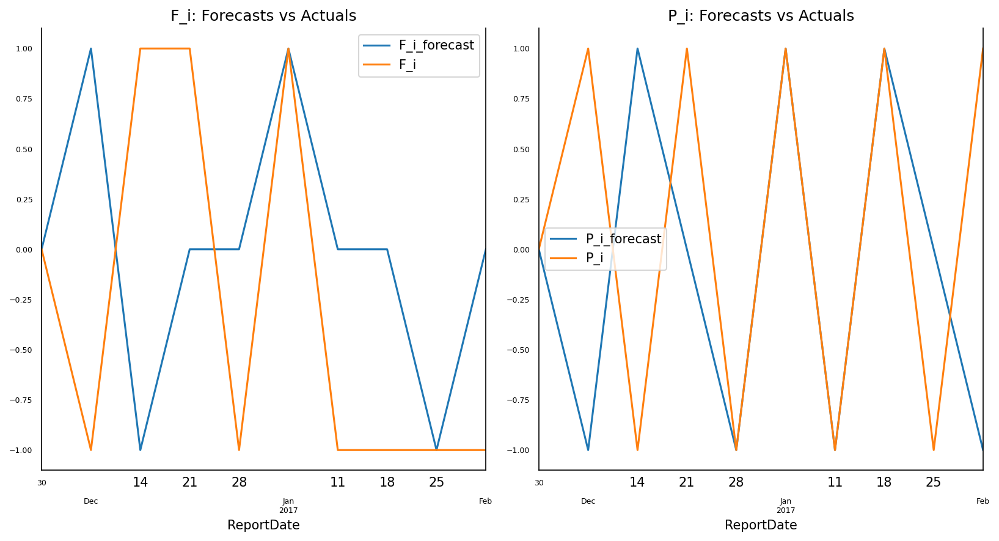

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct is 0.3
The accuracy score for PortfolioChangePct is 0.5
